# Robotic Behavioural Cloning Using VAEs and Supervised Learning

## Description
As part of an assignment for a University College London computer science course, I developed a behaviour cloning model. Behaviour cloning is a technique for training robotic agents using a dataset of sequences of actions. Consider the supervised learning definition where we have a dataset of observatios $d=\{(x_{1},y_{1}),...,(x_{n},y_{n})\}$ and the aim is to learn a function: $f:\mathcal{X}\rightarrow\mathcal{Y}$. In this case, $\mathcal{X}$ is the set of "observations" that the robot makes and $\mathcal{Y}$ is the set of actions that the robot takes.

The dataset used contains examples of robot arms being required to pickup objects or drop objects (given it has already picked the object up) in a specific place. The observation space ($\mathcal{X}$) consists of:
- "front_cam_ob": A 3rd person image of the scene
- "mount_cam_ob": An image of the scene taken from a camera mounted on top of the robotic arm, looking down
- "ee_cartesian_pos_ob": The positional and orientation co-ordinates of the robotic arm
- "ee_cartesian_vel_ob": The velocity of position and orientation of the robotic arm
- "joint_pos_ob": The position of the gripper which opens and closes

The action space ($\mathcal{Y}$) consists of:
- Three co-ordinates defining how much to move the robotic arm
- An action defining whether to open, not to move or close the gripper

The dataset is split into "trajectories" i.e., sequences of:
- $x_{i}$: The front_cam_ob, mount_cam_ob, ee_cartesian_pos_ob, ee_cartesian_vel_ob, joint_pos_ob __at time point i__
- $y_{i}$: The action taken i.e., how to move the arm and the gripper __given the observations__ in $x_{i}$

More information on the dataset can be found at: https://github.com/clvrai/clvr_jaco_play_dataset?tab=readme-ov-file

### Tasks
- Task 1: Tune an end-to-end supervised learning model taking in the full set of observations and predicting actions: I will be evaluating a proposed deep learning architecture (which takes as input all of front_cam_ob, mount_cam_ob, ee_cartesian_pos_ob, ee_cartesian_vel_ob and joint_pos_ob and predict the two actions) and propose a new model which outperforms the existing model;
- Task 2: Define and evaluate a VAE model for performing self-supervised learning and tune it, to learn a latent representation that can be used as input to a downstream supervised model for behaviour cloning
- Task 3: Evaluate the performance of the mode built in task 1 against the self-supervised VAE representations from task 2 (plus a supervised head) on the test set

### Pointers
Some helper functions have been provided including the following functionality:
- A training and validation loop capabale of:
  - Handling "half-precision" modelling;
  - Logging results to weights and biases;
- An eda template to help visualise the data
- An evaluation template to help load saved model checkpoints from weights and biases
- A preprocessing script to help convert the data into train/validation and test splits;
  - In this preprocessing script, trajectories longer than 75 timesteps have been removed to ease the computational requirements of the task;
- A torch Dataset class capable of handling the multi-model nature of the data;
- A example collate_fn to use in Dataloaders

## Data download
Data is downloaded for the project from here: https://drive.usercontent.google.com/download?id=1tVSilmXhyQd8gxZAEhvKMnynw0qzRFSZ&authuser=0

### transition_df.csv
I am using a supplementary dataset  called "transition_df.csv". This contains a row for each observation/action pair in the dataset and is used to generate the train/validation and test datasets for this task. Note that this csv contains all trajectories (even those over 75 timesteps). This csv might also be useful for EDA. The transition_df.csv should be placed in the same folder that contains the raw data downloaded above.

## Imports

The comp0188_cw2 contains some config functionality to run the code in collab and locally (to test models).
- project_options.collab = True will set the dataset directories for google collab whilst false will set suitable local directories
- project_options.debug = True will load a subset of data whilst False will load all of the data.


In [ ]:
COLLAB = True
if COLLAB:
    from google.colab import drive
    drive.mount('/content/drive')

!pip3 install --force-reinstall git+https://github.com/joshuaspear/pymlrf.git
!pip3 install wandb
!pip3 install torchinfo
!pip3 install jaxtyping
!pip3 install git+https://github.com/tessacannon48/comp0188_cw2_public
!pip3 install typeguard==2.13.3

In [ ]:
!wandb login --relogin

Ignore the error:
```ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.inflect 7.4.0 requires typeguard>=4.0.1, but you have typeguard 2.13.3 which is incompatible.```

In [ ]:
from comp0188_cw2 import project_options
project_options.collab = COLLAB
print(project_options.collab)
project_options.debug = False
print(project_options.debug)

True
False


In [ ]:
import torch
import numpy as np
import torch.nn as nn
from torchvision import transforms
from torch.utils.data import DataLoader
import datetime
from pymlrf.Structs.torch import DatasetOutput
import copy

from comp0188_cw2.utils import load_all_files
from torchvision import transforms
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
import datetime
from typing import List
from pymlrf.Structs.torch import DatasetOutput

from comp0188_cw2.config import (
    train_dh, val_dh, test_dh, WANDB_PROJECT
    )
from comp0188_cw2.models.CNNConfig import ConvolutionLayersConfig
from comp0188_cw2.models.base import BaseModel
from comp0188_cw2.models.JointCNNEncoder import JointCNNEncoder
from comp0188_cw2.models.CNN import CNN
from comp0188_cw2.models.MLP import MLP
from comp0188_cw2.Metric.WandBMetricOrchestrator import WandBMetricOrchestrator
from comp0188_cw2.Dataset.NpDictDataset import NpDictDataset
from comp0188_cw2.Loss.BalancedLoss import TrackerBalancedLoss
from comp0188_cw2 import logger
from comp0188_cw2.training.TrainingLoop import TorchTrainingLoop

import sys
import os
sys.path.append(os.getcwd())
import pandas as pd
import os
import logging
import h5py
import matplotlib.pyplot as plt
import numpy as np
from comp0188_cw2.utils import to_greyscale
from comp0188_cw2.config import FILE_PATH, ROOT_PATH
import seaborn as sns
import math
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from torchsummary import summary
from torch.utils.data import DataLoader, sampler
from torch.optim.lr_scheduler import CosineAnnealingLR
import torch.nn.functional as F
from IPython.display import Image, display
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import precision_score, recall_score, f1_score
from sklearn.manifold import TSNE
import wandb
from scipy.ndimage import gaussian_filter

In [ ]:
print(train_dh.loc)

/content/drive/MyDrive/comp0188_2425/cw2/train


## Build the dataset
This step only needs to be performed __once__ for the full dataset and __once__ for the debug dataset for the entire coursework, both locally and in Google collab. In Google Collab, the data will be saved in Google Drive.

In [ ]:
from comp0188_cw2.Preprocessing import main
RUN_PREPROCESSING = False
if RUN_PREPROCESSING:
  main()

## Exploratory Data Analysis

Please note some visualizations below were created using the debug set during EDA to reduce dataload and improve visibility.

In [ ]:
# Load training and validation data

_keys = [
    "actions","front_cam_ob",
    "mount_cam_ob","terminals",
    "ee_cartesian_pos_ob",
    "ee_cartesian_vel_ob",
    "joint_pos_ob"
    ]
train_nps = load_all_files(train_dh.loc,"train_[0-9]+.h5",keys=_keys)
val_nps = load_all_files(val_dh.loc,"val_[0-9]+.h5",keys=_keys)

100%|██████████| 5/5 [00:12<00:00,  2.50s/it]


In [ ]:
tran_df = pd.read_csv(os.path.join(ROOT_PATH, "transition_df.csv"))
tran_df.head()

,episode,terminated,reward,max_reward,episode_length
0,0,0,0,1,76
1,0,0,0,1,76
2,0,0,0,1,76
3,0,0,0,1,76
4,0,0,0,1,76


In [ ]:
tran_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 77965 entries, 0 to 77964
Data columns (total 5 columns):
 #   Column          Non-Null Count  Dtype
---  ------          --------------  -----
 0   episode         77965 non-null  int64
 1   terminated      77965 non-null  int64
 2   reward          77965 non-null  int64
 3   max_reward      77965 non-null  int64
 4   episode_length  77965 non-null  int64
dtypes: int64(5)
memory usage: 3.0 MB


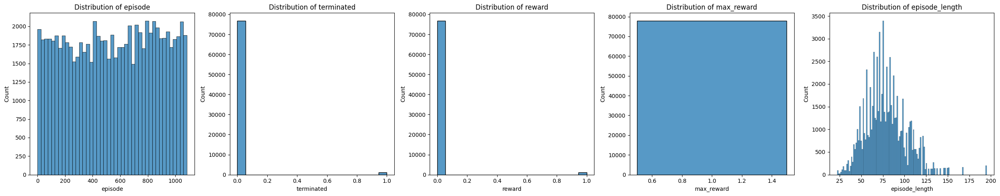

In [ ]:
# Visualize distribution of transition

fig, axes = plt.subplots(1, 5, figsize=(25, 5))
axes = axes.flatten()

for i,col in enumerate(tran_df):
    sns.histplot(tran_df[col],ax=axes[i])
    axes[i].set_title(f"Distribution of {col}")
    axes[i].set_xlabel(col)

plt.tight_layout()

plt.show()

Front Image Shape: (224, 224, 3)
Top Image Shape: (224, 224, 3)
--------
Action Shape: 4
First Action: [ 0.05892739  0.03721748 -0.00249063  1.        ]
--------
Robot Arm Position Shape: 7
First Robot Arm Position [-0.08795056 -0.29436624  0.32132019  0.00363336 -0.01560882  0.98868338
  0.14915879]
--------
Robot Arm Velocity Shape: 6
First Robot Arm Velocity [ 0.05997676  0.03909448 -0.00282936  0.00466181 -0.00936928 -0.00948343]
--------
Robot Gripper Position Shape: 8
First Robot Gripper Position [-0.001232 -0.001232]


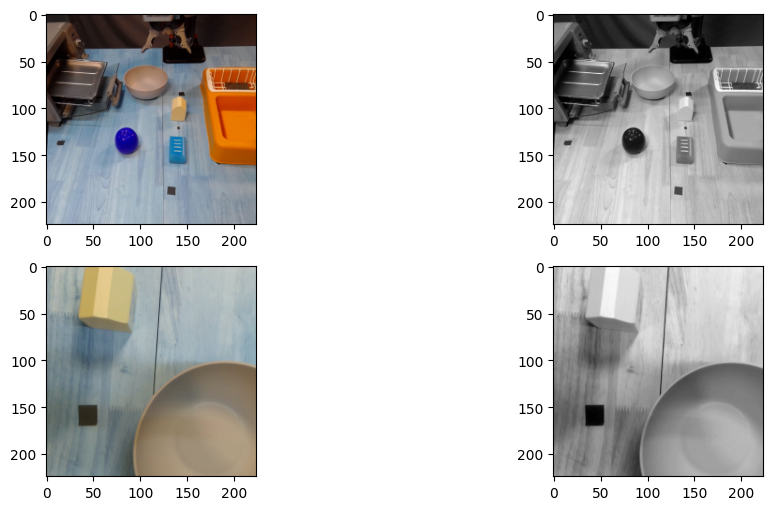

In [ ]:
# Visualize first image and associated data: Raw Data

_idx = 0
with h5py.File(FILE_PATH, 'r') as h5_file:
    _img_front = h5_file["front_cam_ob"][_idx]
    _img_top = h5_file["mount_cam_ob"][_idx]
    _action = h5_file["actions"][_idx]
    _pos_ob = h5_file["ee_cartesian_pos_ob"][_idx]
    _vel_ob = h5_file["ee_cartesian_vel_ob"][_idx]
    _joint_ob = h5_file["joint_pos_ob"][_idx]

# My code here:

print(f'Front Image Shape: {_img_front.shape}')
print(f'Top Image Shape: {_img_top.shape}')
print('--------')
print(f'Action Shape: {_action.shape[0]}')
print(f"First Action: {_action}")
print('--------')
print(f'Robot Arm Position Shape: {_pos_ob.shape[0]}')
print(f"First Robot Arm Position {_pos_ob}")
print('--------')
print(f'Robot Arm Velocity Shape: {_vel_ob.shape[0]}')
print(f"First Robot Arm Velocity {_vel_ob}")
print('--------')
print(f'Robot Gripper Position Shape: {_joint_ob.shape[0]}')
print("First Robot Gripper Position {}".format(_joint_ob[-2:]))


fig, axis = plt.subplots(2,2, figsize=(12,6))
axis[0,0].imshow(_img_front)
axis[0,1].imshow(to_greyscale(_img_front.astype(int)[None,:]).astype(np.float16).squeeze(), cmap=plt.get_cmap('gray'))
axis[1,0].imshow(_img_top)
axis[1,1].imshow(to_greyscale(_img_top.astype(int)[None,:]).astype(np.float16).squeeze(), cmap=plt.get_cmap('gray'))
plt.show()


Front Image Shape: (224, 224)
Top Image Shape: (224, 224)
--------
Action Shape: 4
First Action: [0.      0.      0.03072 1.     ]
--------
Robot Arm Position Shape: 7
First Robot Arm Position [-0.03812  -0.4106    0.2847    0.004757 -0.00663   0.9893    0.1458  ]
--------
Robot Arm Velocity Shape: 6
First Robot Arm Velocity [-0.0001632 -0.003597   0.04343   -0.009224   0.005886   0.01283  ]
--------
Robot Gripper Position Shape: 2
First Robot Gripper Position [1.055 1.05 ]


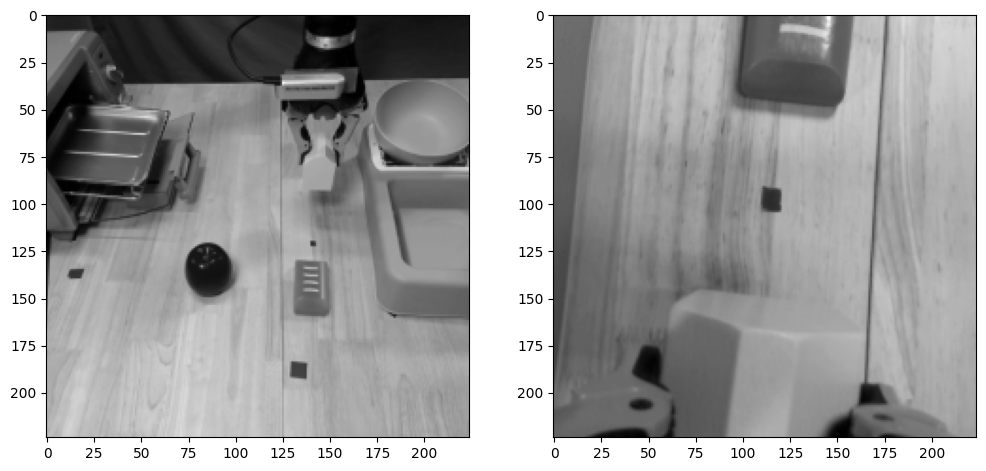

In [ ]:
# Visualize first image and associated data: Training Data

train_file_path = train_dh.loc
train_file_name = '/train_0.h5'

_idx = 0
with h5py.File(train_file_path+train_file_name, 'r') as h5_file:
    _img_front = h5_file["front_cam_ob"][_idx]
    _img_top = h5_file["mount_cam_ob"][_idx]
    _action = h5_file["actions"][_idx]
    _pos_ob = h5_file["ee_cartesian_pos_ob"][_idx]
    _vel_ob = h5_file["ee_cartesian_vel_ob"][_idx]
    _joint_ob = h5_file["joint_pos_ob"][_idx]

print(f'Front Image Shape: {_img_front.shape}')
print(f'Top Image Shape: {_img_top.shape}')
print('--------')
print(f'Action Shape: {_action.shape[0]}')
print(f"First Action: {_action}")
print('--------')
print(f'Robot Arm Position Shape: {_pos_ob.shape[0]}')
print(f"First Robot Arm Position {_pos_ob}")
print('--------')
print(f'Robot Arm Velocity Shape: {_vel_ob.shape[0]}')
print(f"First Robot Arm Velocity {_vel_ob}")
print('--------')
print(f'Robot Gripper Position Shape: {_joint_ob.shape[0]}')
print(f"First Robot Gripper Position {_joint_ob}")

fig, axis = plt.subplots(1,2, figsize=(12,6))
axis[0].imshow(_img_front,cmap='gray')
axis[1].imshow(_img_top,cmap='gray')


In [ ]:
# Calculate descriptive statistics for each variable and shape

for key, value in train_nps.items():
    if key not in ['front_cam_ob','mount_cam_ob']:
        print(f"{key}: min={value.min()}, max={value.max()}, mean={value.mean()}, std={value.std()}")
    else:
        print(f"{key}: min={value.min()}, max={value.max()}, mean={value.mean()}") # Not calculating std for raw image columns because of overflow
    print(value.shape)

actions: min=-0.199951171875, max=2.0, mean=0.2626953125, std=0.5439453125
(1274, 4)
front_cam_ob: min=0.52685546875, max=249.5, mean=114.375
(1274, 224, 224)
mount_cam_ob: min=1.8408203125, max=254.75, mean=128.25
(1274, 224, 224)
terminals: min=0, max=1, mean=0.01805337519623234, std=0.13314447356257939
(1274,)
ee_cartesian_pos_ob: min=-0.60693359375, max=0.9951171875, mean=0.126953125, std=0.407958984375
(1274, 7)
ee_cartesian_vel_ob: min=-0.31640625, max=0.38916015625, mean=-0.00186920166015625, std=0.0799560546875
(1274, 6)
joint_pos_ob: min=0.0, max=1.3994140625, mean=0.8056640625, std=0.398681640625
(1274, 2)


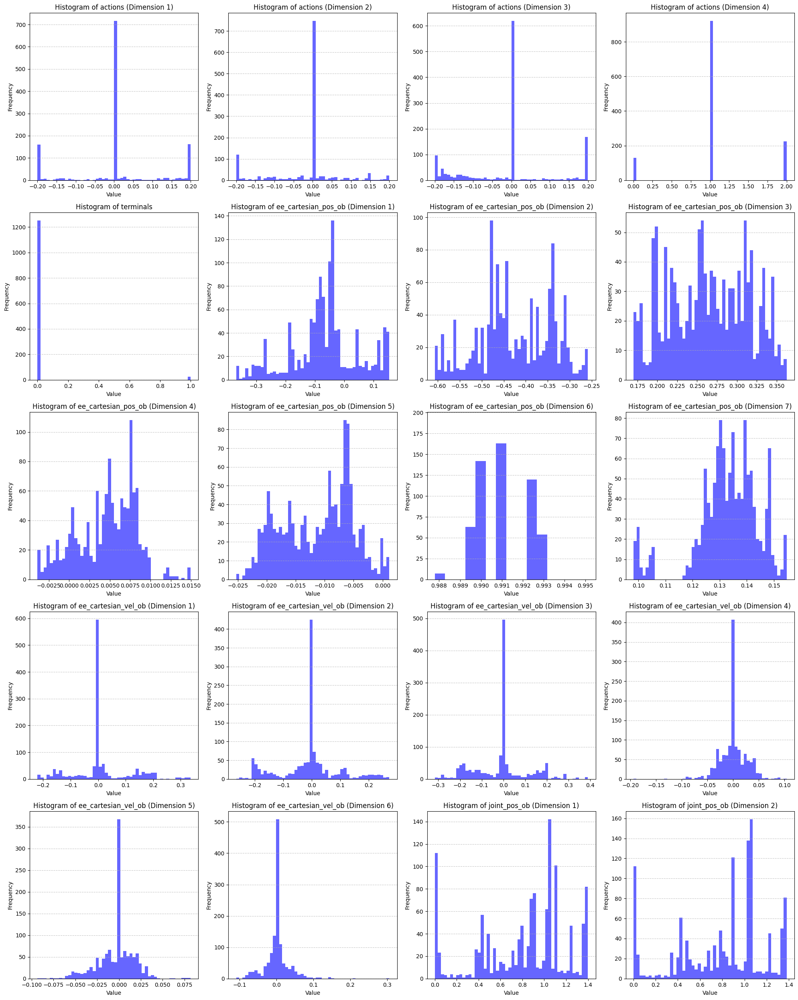

In [ ]:
# Cols to visualize
viz_cols = ['actions','terminals','ee_cartesian_pos_ob','ee_cartesian_vel_ob','joint_pos_ob']

# Create subplots
fig, axes = plt.subplots(5, 4, figsize=(20, 5 * 5))
axes = axes.flatten()

# Construct plots
plot_idx = 0
for variable in viz_cols:
    dim = train_nps[variable][0].size
    if dim==1:
        axes[plot_idx].hist(train_nps[variable], bins=50, color='blue', alpha=0.6)
        axes[plot_idx].set_title(f"Histogram of {variable}")
        axes[plot_idx].set_xlabel("Value")
        axes[plot_idx].set_ylabel("Frequency")
        axes[plot_idx].grid(axis='y', linestyle='--', alpha=0.7)
        plot_idx += 1
    elif dim > 1:
        for i in range(dim):
            axes[plot_idx].hist(train_nps[variable][:, i].flatten(), bins=50, color='blue', alpha=0.6)
            axes[plot_idx].set_title(f"Histogram of {variable} (Dimension {i + 1})")
            axes[plot_idx].set_xlabel("Value")
            axes[plot_idx].set_ylabel("Frequency")
            axes[plot_idx].grid(axis='y', linestyle='--', alpha=0.7)
            plot_idx += 1

plt.tight_layout()
plt.show()

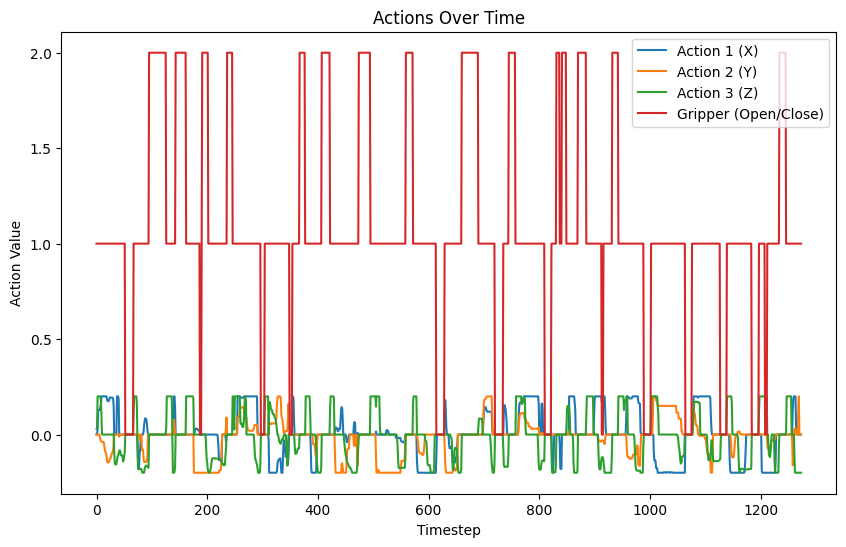

In [ ]:
# Plot actions over time

actions = train_nps["actions"]
plt.figure(figsize=(10, 6))
plt.plot(actions[:, 0], label="Action 1 (X)")
plt.plot(actions[:, 1], label="Action 2 (Y)")
plt.plot(actions[:, 2], label="Action 3 (Z)")
plt.plot(actions[:, 3], label="Gripper (Open/Close)")
plt.legend()
plt.title("Actions Over Time")
plt.xlabel("Timestep")
plt.ylabel("Action Value")
plt.show()

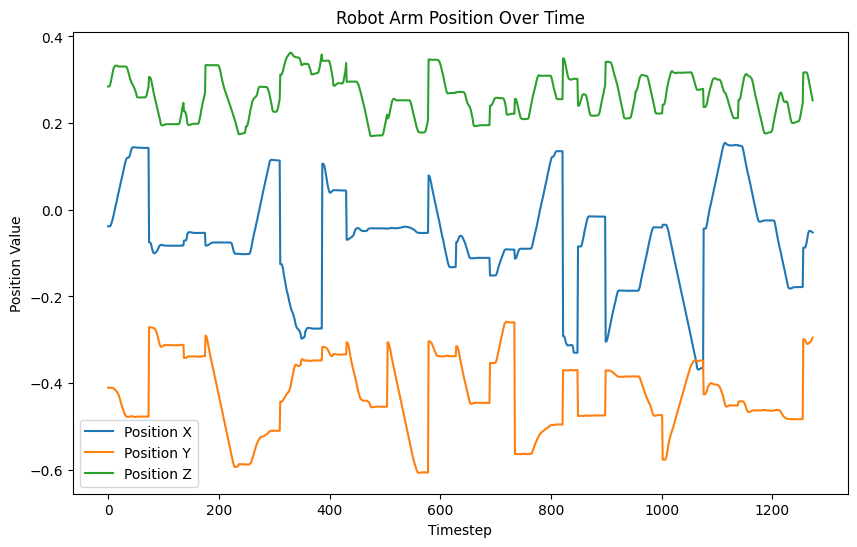

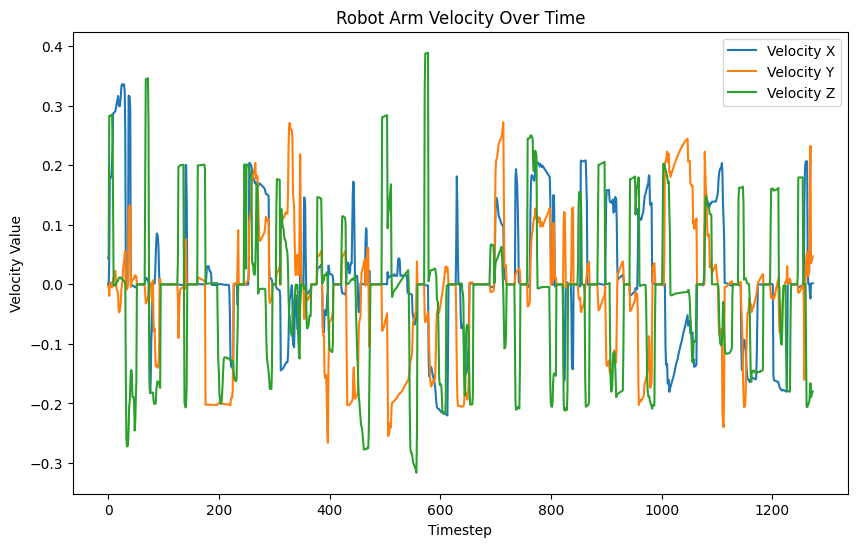

In [ ]:
# Plot Robot Arm Position and Velocity Over Time

positions = train_nps["ee_cartesian_pos_ob"]
velocities = train_nps["ee_cartesian_vel_ob"]

plt.figure(figsize=(10, 6))
plt.plot(positions[:, 0], label="Position X")
plt.plot(positions[:, 1], label="Position Y")
plt.plot(positions[:, 2], label="Position Z")
plt.legend()
plt.title("Robot Arm Position Over Time")
plt.xlabel("Timestep")
plt.ylabel("Position Value")
plt.show()

plt.figure(figsize=(10, 6))
plt.plot(velocities[:, 0], label="Velocity X")
plt.plot(velocities[:, 1], label="Velocity Y")
plt.plot(velocities[:, 2], label="Velocity Z")
plt.legend()
plt.title("Robot Arm Velocity Over Time")
plt.xlabel("Timestep")
plt.ylabel("Velocity Value")
plt.show()

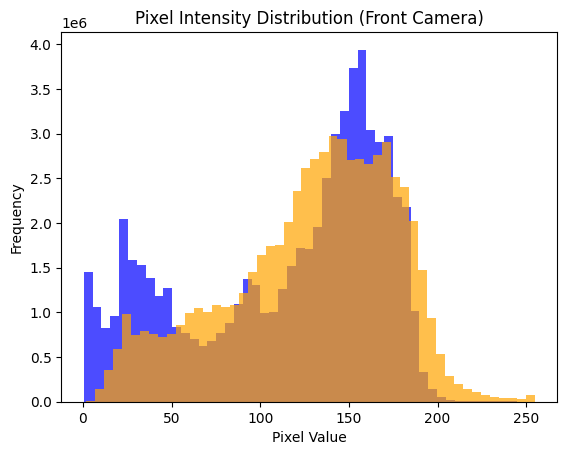

In [ ]:
# Plot distribution of pixel values for each camera type

front_pixels = train_nps["front_cam_ob"].flatten()
mount_pixels = train_nps["mount_cam_ob"].flatten()
plt.hist(front_pixels, bins=50, color="blue", alpha=0.7)
plt.hist(mount_pixels, bins=50, color="orange", alpha=0.7)
plt.title("Pixel Intensity Distribution (Front Camera)")
plt.xlabel("Pixel Value")
plt.ylabel("Frequency")
plt.show()

## Task 1: Tune an end-to-end supervised learning model taking in the full set of observations and predicting actions

### Preprocessing

In [ ]:
# Calculate mean and standard deviation to normalize images

def calculate_mean_std(dataset, variable, image=True):
    """
    Takes in dataset dictionary and returns the global mean and standard deviation of the variable.
    For image variables, pixels are first scaled to be between 0 and 1. A single global mean and std is returned to be used to standardize the image variable.
    For non-image variables, individual means and stds are calculated along each axis of the multi-dimensional variable.
    Tensors for the means and stds are returned to standardize each dimension of the variable individually.
    """

    if image==True:
        total_pixels = 0
        sum_pixels = 0
        sum_squared_pixels = 0

        for image in dataset[variable]:
            scaled_image = image.astype(np.float32) / 255.0 # Scales by 255.0 so that each pixel value is between 0 and 1
            total_pixels += image.size
            sum_pixels += scaled_image.sum()
            sum_squared_pixels += (scaled_image**2).sum()

        mean = sum_pixels / total_pixels
        std = np.sqrt((sum_squared_pixels / total_pixels) - mean**2)
        return mean, std
    elif variable=='actions':
        axis_means = []
        axis_stds = []
        dim = dataset[variable][0].size
        for i in range(dim):
            if i!=3:
                axis = dataset[variable][:, i] # Gets individual dimension to calculate mean and std
                axis_mean = axis.mean()
                axis_means.append(axis_mean)
                axis_std = axis.std()
                axis_stds.append(axis_std)
            elif i==3:
                axis_mean = 0
                axis_means.append(axis_mean)
                axis_std = 1
                axis_stds.append(axis_std)
        return torch.tensor(axis_means), torch.tensor(axis_stds) # Outputs list of means and stds as tensors to apply within global_transforms dict below
    else:
        axis_means = []
        axis_stds = []
        dim = dataset[variable][0].size  # Number of dimensions in each variable
        for i in range(dim):
            axis = dataset[variable][:, i] # Gets individual dimension to calculate mean and std
            axis_mean = axis.mean()
            axis_means.append(axis_mean)
            axis_std = axis.std()
            axis_stds.append(axis_std)
        return torch.tensor(axis_means), torch.tensor(axis_stds) # Outputs list of means and stds as tensors to apply within global_transforms dict below

front_mean, front_std = calculate_mean_std(train_nps,'front_cam_ob',image=True)
mount_mean, mount_std = calculate_mean_std(train_nps,'mount_cam_ob',image=True)
pos_means, pos_stds = calculate_mean_std(train_nps,'ee_cartesian_pos_ob',image=False)
vel_means, vel_stds = calculate_mean_std(train_nps,'ee_cartesian_vel_ob',image=False)
joint_means, joint_stds = calculate_mean_std(train_nps,'joint_pos_ob',image=False)

In [ ]:
global_transforms = {
    "front_cam_ob":
        transforms.Compose([
            transforms.ToTensor(),
            transforms.Lambda(lambda x: x / 255.0), # Scaling
            transforms.Normalize(mean=front_mean, std=front_std) # Standardization
            ]),
    "mount_cam_ob": transforms.Compose([
            transforms.ToTensor(),
            transforms.Lambda(lambda x: x / 255.0), # Scaling
            transforms.Normalize(mean=mount_mean, std=mount_std) # Standardization
            ]),
    "actions": transforms.Compose([
        lambda x: torch.tensor(x),
       #lambda x: (x - action_means) / action_stds  # Standardization, with no standardization for the 4th dimension
    ]),
    "ee_cartesian_pos_ob": transforms.Compose([
        lambda x: torch.tensor(x),
        lambda x: (x - pos_means) / pos_stds  # Standardization
    ]),
    "ee_cartesian_vel_ob": transforms.Compose([
        lambda x: torch.tensor(x),
        lambda x: (x - vel_means) / vel_stds  # Standardization
    ]),
    "joint_pos_ob": transforms.Compose([
        lambda x: torch.tensor(x),
        lambda x: (x - joint_means) / joint_stds  # Standardization
    ])
}

#### Transformation Justifications

_actions_

For the actions variable, I decided to apply no transformations. This is because the coordinates of the action variable were already on the same scale (betweeen -0.2 and 0.2) and they were centered around zero. Please see the "Actions Over Time" plot in the above EDA where I vizualized the scales of each component of the action variable. Therefore, I decided no transformations were needed to adjust scaling or distributions.

If I were to apply transformations, I would need to handle the transformations separately for the two datatypes of my action variable (the 3 continuous coordinates and the 1 categorical axis). If the coordinates were not on the same scale, I would apply normalization and do so by calculating the mean and standard deviation for each dimension. I would not apply any transformations to the categorical variable as I would not want to adjust the scale of label data.

_front_cam_ob_

Since the front camera observation variable consists of image data, which has pixel values between 0 and 255, I wanted to first scale the pixel values to be between 0 and 1 by dividing every pixel value by 255. This increases numerical stability, stabilizing gradients and leading to faster convergence. After scaling, I apply standardization by subtracting the mean from each pixel value and dividing by the standard deviation (I calculated the mean and standard deviation on pre-scaled pixel values in the custom function above). This results in the entire variable having a mean of zero and standard deviation 1. It is important to perform standardization to ensure that each variable is on the same scale to improve convergence. For empirical evidence which motivated these decisions, please see the Pixel Intensity histogram above which demonstrates the range of the pixel values (0 to 255) and the varying distributions of the two image variables.

_mount_cam_ob_

For the mount camera observation variable, I performed the exact same transformation (scaling and standardization) as I did for the front camera variable seeing as the data types and structure were identical. Since my Pixel Intensity Histogram revealed that the variables had different distributions, it provided more reason that both image variables needed to be normalized to ensure neither variable was given more importance in modeling.

For both image variables, I considered adding noise to the image data, but ultimately decided against it based on my modeling results as I did not want to decrease the model's ability to fit the training data due to my poor training scores.

_ee_cartesian_pos_ob_

For the cartesian position variable, I applied standardization. This was a multidimensional variable, with one dimension for each axis in the X-Y-Z plane, so I calculated the mean and standard deviation along each axis to be used in standardizing each dimension. This was necesssary to ensure that all of the coordinates were on the same scale, seeing as I discovered in my "Robot Arm Position Over Time" plot above that every dimension was in a completely different scale which did not overlap. More specifically, I found that the Z coordinates were centered around 0.3, the X coordinates were centered around 0, and the Y coordinates were centered around -0.4 prior to standardization.

_ee_cartesian_vel_ob_

For the cartesian velocity variable, I also applied standardization using a separate mean and std calculated for each dimension. This was justified based on the evidence found in my "Robot Arm Velocity Over Time" plot above. Although the scales did not vary as significantly as the cartesian coordinates, and they actually shared the same center, there was still enough variation in scale to warrant standardization. It is also important to standardize to ensure they are on the same scale as other independent features to ensure that no variable is given unjustified importance than another in modeling.

_joint_pos_ob_

Finally, for the joint position variable, I also applied multi-dimensional standardization with the same reasoning given for the variables above. As seen in my histograms of the distribution of each dimension of the variable, the scale is roughly the same (between 0 and 1.4) but standardization should still be applied to ensure similar scales with the other features.

### End-to-end supervised model evaluation


In [ ]:
cnn2_config = ConvolutionLayersConfig(
    input_dim=224,
    input_channels=2,
    layers=[
        nn.Conv2d(
            in_channels=2,
            out_channels=8,
            kernel_size=(3,3),
            stride=1,
            padding=1,
            dilation=1
          ),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=(2,2)),
        nn.Conv2d(
            in_channels=8,
            out_channels=16,
            kernel_size=(3,3),
            stride=1,
            padding=1
          ),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=(2,2)),
        nn.Conv2d(
            in_channels=16,
            out_channels=32,
            kernel_size=(3,3),
            stride=1,
            padding=1
          ),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=(2,2))
        ]
    )

_cnn_output_dim = cnn2_config.get_output_dims()
_cnn_output_channels = cnn2_config.get_output_channels()
_mlp_input_dim = int(
            (_cnn_output_dim[-1]*_cnn_output_dim[-1])*_cnn_output_channels[-1]
            )


image_encoder = JointCNNEncoder(
    cnn=CNN(cnn2_config),
    dense=MLP(
        input_dim=_mlp_input_dim,
        hidden_dims=[256],
        output_dim=128
        )
)

obs_encoder = MLP(
    input_dim = 15,
    hidden_dims = [256,256],
    output_dim = 128
)

dense = MLP(
    input_dim = 128,
    hidden_dims = [64,32],
    output_dim = 6
)

class Baseline1(BaseModel):

  def __init__(
      self,
      image_encoder:JointCNNEncoder,
      obs_encoder:MLP,
      dense:MLP
      ) -> None:
      super().__init__()
      self.image_encoder = image_encoder
      self.obs_encoder = obs_encoder
      self.dense = dense

  def forward(self, images, obs):
    _img_enc = self.image_encoder(images)
    _obs_enc = self.obs_encoder(obs)
    _dense_enc = self.dense(_img_enc+_obs_enc)
    pos = _dense_enc[:,0:3]
    grp = _dense_enc[:,3:]
    return {
        "pos": pos,
        "grp":grp
        }
  def reset(
      self,
      image_encoder_kwargs,
      obs_encoder_kwargs,
      dense_kwargs
      ):
    self.image_encoder.reset(**image_encoder_kwargs)
    self.obs_encoder.reset(**obs_encoder_kwargs)
    self.dense.reset(**dense_kwargs)

torch.manual_seed(5)
model = Baseline1(
    image_encoder=image_encoder,
    obs_encoder=obs_encoder,
    dense=dense
)

#### Composite Loss Discussion

For the model defined above, the proposed loss function is defined where the contribution of "pos_criterion" and "grp_criterion" are equally weighted and the mean of the two values loss are used to define the final loss. Furthermore, the loss for the positional actions is the MSE and the loss for grp_criterion is the CrossEntropyLoss. This composite loss function is reasonable because we are dealing with a composite response variable of two different types of datatypes: the position of the robot arm is continuous while the gripper action is categorical. It would not be reasonable to use only MSE or CrossEntropyLoss for the entire response variable seeing as MSE is a continuous error measurement while CrossEntropyLoss is a categorical error measurement. Additionally, by weighting them equally, we ensure that both the position and gripper predictions have equal importance, which is reasonable given our task seeing as both parts of the action response variable are equally important to predict correctly.

In regards to the individual loss functions, MSE is a reasonable choice because it is a standard error measurement for continuous outputs. It will calculate how far the cartesian coordinate predictions are from the true values on average using the squared error. CrossEntropyLoss is also a reasonable choice because the model is outputting raw logits as the predictions for each class (example output for single observation: [-5.32,9.99,7.31]). CrossEntropyLoss is designed to take in these raw logits, which represents the models unnormalized confidence in each class, and then apply a SoftMax function to compute probabilities. The loss function then calculates the difference between the true class distribution and the predicted probabilities.


In [ ]:
pos_criterion = nn.MSELoss(reduction="mean")
grp_criterion = nn.CrossEntropyLoss(reduction="mean")

In [ ]:
torch.manual_seed(5)
model.reset({},{},{})
exp_kwargs = {
    "batch_size": 64,
    "learning_rate": 0.001,
    "half_precision": True,
    "target_offset": 0
}

if project_options.debug:
    exp_kwargs["batch_size"] = 4

if exp_kwargs["half_precision"]:
    train_dataset = NpDictDataset(
        array_dict=train_nps,
        transform_lkp = global_transforms,
        dep_vars = ["actions"],
        indep_vars = [
            "front_cam_ob","mount_cam_ob", "ee_cartesian_pos_ob",
            "ee_cartesian_vel_ob", "joint_pos_ob"
            ],
        target_offset=exp_kwargs["target_offset"]
        )

    val_dataset = NpDictDataset(
        array_dict=val_nps,
        transform_lkp = global_transforms,
        dep_vars = ["actions"],
        indep_vars = [
            "front_cam_ob","mount_cam_ob", "ee_cartesian_pos_ob",
            "ee_cartesian_vel_ob", "joint_pos_ob"
            ],
        target_offset=exp_kwargs["target_offset"]
        )
else:
    train_dataset = NpDictDataset(
        array_dict={k:train_nps[k].astype(np.float32) for k in train_nps},
        transform_lkp = global_transforms,
        dep_vars = ["actions"],
        indep_vars = [
            "front_cam_ob","mount_cam_ob", "ee_cartesian_pos_ob",
            "ee_cartesian_vel_ob", "joint_pos_ob"
            ],
        target_offset=exp_kwargs["target_offset"]
        )

    val_dataset = NpDictDataset(
        array_dict={k:val_nps[k].astype(np.float32) for k in val_nps},
        transform_lkp = global_transforms,
        dep_vars = ["actions"],
        indep_vars = [
            "front_cam_ob","mount_cam_ob", "ee_cartesian_pos_ob",
            "ee_cartesian_vel_ob", "joint_pos_ob"
            ],
        target_offset=exp_kwargs["target_offset"]
        )

print(len(train_dataset))
out = train_dataset[0]

def collate_func(input_list:List[DatasetOutput])->DatasetOutput:
    pos = []
    _grp = []
    images = []
    obs = []
    for val in input_list:
        images.append(
            torch.concat(
                [val.input["front_cam_ob"], val.input["mount_cam_ob"]],
                dim=0
            )[None,:]
            )
        obs.append(
            torch.concat(
                [
                    val.input["ee_cartesian_pos_ob"],
                    val.input["ee_cartesian_vel_ob"],
                    val.input["joint_pos_ob"]
                    ],
                dim=0
            )[None,:]
        )
        pos.append(val.output["actions"][0:3][None,:])
        _grp.append(val.output["actions"][-1:][None])
    _grp = torch.concat(_grp, dim=0)
    grp = torch.zeros(_grp.shape[0],3)
    grp[torch.arange(len(grp)), _grp.squeeze().int()] = 1
    return DatasetOutput(
        input = {
            "images":torch.concat(images,dim=0),
            "obs":torch.concat(obs,dim=0),
            },
        output = {
            "pos":torch.concat(pos, dim=0),
            "grp":grp
            }
    )


train_dataloader = DataLoader(
    train_dataset,
    batch_size=exp_kwargs["batch_size"],
    shuffle=True,
    collate_fn=collate_func,
)
val_dataloader = DataLoader(
    val_dataset,
    batch_size=exp_kwargs["batch_size"],
    shuffle=False,
    collate_fn=collate_func,
)

first_batch = next(train_dataloader.__iter__())

input_dim = first_batch.input["images"].shape
print(input_dim)
input_dim = first_batch.input["obs"].shape
print(input_dim)
pos_dim = first_batch.output["pos"].shape
print(pos_dim)
grp_dim = first_batch.output["grp"].shape
print(grp_dim)

exp_kwargs["model_def"] = model.__repr__()


if exp_kwargs["half_precision"]:
    model = model.half()
optimizer = torch.optim.Adam(
    model.parameters(), lr=exp_kwargs["learning_rate"],
    eps=1e-04
    )

__criterion = TrackerBalancedLoss(
    loss_lkp={
        "pos":pos_criterion,
        "grp": grp_criterion
    }
    )

if exp_kwargs["half_precision"]:
    with torch.no_grad():
        if torch.cuda.is_available():
            model = model.cuda()
            with torch.autocast(device_type="cuda"):
                res = model(
                    images=first_batch.input["images"].cuda(),
                    obs=first_batch.input["obs"].cuda()
                    )
                first_batch.output["pos"] = first_batch.output["pos"].cuda()
                first_batch.output["grp"] = first_batch.output["grp"].cuda()
        else:
            with torch.autocast(device_type="cuda"):
                res = model(
                    images=first_batch.input["images"],
                    obs=first_batch.input["obs"]
                    )
else:
    with torch.no_grad():
        if torch.cuda.is_available():
            model = model.cuda()
            res = model(
                images=first_batch.input["images"].cuda(),
                obs=first_batch.input["obs"].cuda()
                )
            first_batch.output["pos"] = first_batch.output["pos"].cuda()
            first_batch.output["grp"] = first_batch.output["grp"].cuda()
        else:
            res = model(
                images=first_batch.input["images"],
                obs=first_batch.input["obs"]
                )
print(__criterion(res,first_batch.output))


25469
torch.Size([64, 2, 224, 224])
torch.Size([64, 15])
torch.Size([64, 3])
torch.Size([64, 3])
tensor(1.7266, device='cuda:0', dtype=torch.float16)


In [ ]:
mo = WandBMetricOrchestrator()

train_criterion = TrackerBalancedLoss(
    loss_lkp={
        "pos":copy.deepcopy(pos_criterion),
        "grp":copy.deepcopy(grp_criterion)
    },
    name="train",
    mo=mo
    )

val_criterion = TrackerBalancedLoss(
    loss_lkp={
        "pos":copy.deepcopy(pos_criterion),
        "grp":copy.deepcopy(grp_criterion)
    },
    name="val",
    mo=mo
    )

sl_trainer = TorchTrainingLoop(
    model=model, gpu=True, optimizer=optimizer, criterion=train_criterion,
    val_criterion=val_criterion, epochs=10, logger=logger,
    mo=WandBMetricOrchestrator(), half_precision=exp_kwargs["half_precision"],
    preds_save_type="csv",output_dir='/content/drive/MyDrive/comp0188_2425/cw2/predictions'
)

wandb_name = "End_to_end_1"
wandb_grp="End_to_end"

if project_options.debug:
    wandb_name = f"{wandb_name}_DEBUG"


orig = datetime.datetime.now()
sl_trainer.training_loop(
    train_loader=train_dataloader,
    val_loader=val_dataloader,
    wandb_proj=WANDB_PROJECT,
    wandb_grp=wandb_grp,
    wandb_config=exp_kwargs,
    wandb_name=wandb_name,
    reset_kwargs={
        "image_encoder_kwargs": {},
        "obs_encoder_kwargs": {},
        "dense_kwargs": {}
    }
    )
post_train = datetime.datetime.now()

wandb: Currently logged in as: ucabtc8 (ucabtc8-university-college-london-ucl-). Use `wandb login --relogin` to force relogin


INFO:cw2_logger:Running epochs: 10
INFO:cw2_logger:Running training epoch
100%|██████████| 379/379 [00:31<00:00, 12.03it/s]
INFO:cw2_logger:epoch 1	 training loss : 25.140625
INFO:cw2_logger:Running validation
INFO:cw2_logger:epoch 1	 validation loss : 0.66064453125 
INFO:cw2_logger:Running training epoch
100%|██████████| 379/379 [00:33<00:00, 11.19it/s]
INFO:cw2_logger:epoch 2	 training loss : 0.62451171875
INFO:cw2_logger:Running validation
INFO:cw2_logger:epoch 2	 validation loss : 0.66162109375 
INFO:cw2_logger:Running training epoch
100%|██████████| 379/379 [00:31<00:00, 12.00it/s]
INFO:cw2_logger:epoch 3	 training loss : 0.626953125
INFO:cw2_logger:Running validation
INFO:cw2_logger:epoch 3	 validation loss : 0.6689453125 
INFO:cw2_logger:Running training epoch
100%|██████████| 379/379 [00:31<00:00, 11.93it/s]
INFO:cw2_logger:epoch 4	 training loss : 0.625
INFO:cw2_logger:Running validation
INFO:cw2_logger:epoch 4	 validation loss : 0.6513671875 
INFO:cw2_logger:Running training 

epoch_train_loss,█▁▁▁▁▁▁▁▁▁
epoch_val_loss,▅▅█▂▄▂▁▃▇▄
grp_train_loss,▂▄▇█▅▄▄▇▆▇▃▁▆▆▄▇▆▇▂▃▂▇█▃▃▅▆▅▄▃▅▅▄▆▂▅▆▆▅▅
grp_val_loss,▃▂▂▄▄▃█▂▄▃▃▄▅▂▁▁▂▂▂▇▆▄▇▁▂▂▇▂▄▄▂▅▃▂▆█▆▂▄▂
pos_train_loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
pos_val_loss,▂▂▂▄█▃▃▁▂▂▄▁▁▂▁▁▂▁▁▁▂▁▂▁▂▂▁▁▂▁▂▁▂▂▃▂▁▁▃▁
epoch_train_loss,0.62061
epoch_val_loss,0.65771
grp_train_loss,0.56424
grp_val_loss,0.99244
pos_train_loss,0.00133


#### Model evaluation

##### Epoch selection

Based on the training of the baseline model over the 10 epochs, an appropriate epoch to save the model and perform evaluation would be epoch 7. This is because epoch 7 is when the composite validation loss is minimized across the 10 epochs. After epoch 7, the composite validation loss starts to increase, which indicates potential overfitting. I am selecting the epoch based on the composite loss as opposed to the individual position or gripper loss so that I can achieve the best average performance. Please see the screenshot below from the baseline run using weights and biases.

At epoch 7, below are the reported metrics:

epoch_train_loss: 0.634

epoch_val_loss: 0.649

pos_train_loss=0.002

pos_val_loss=0.001

grp_train_loss=0.648

grp_val_loss=0.803

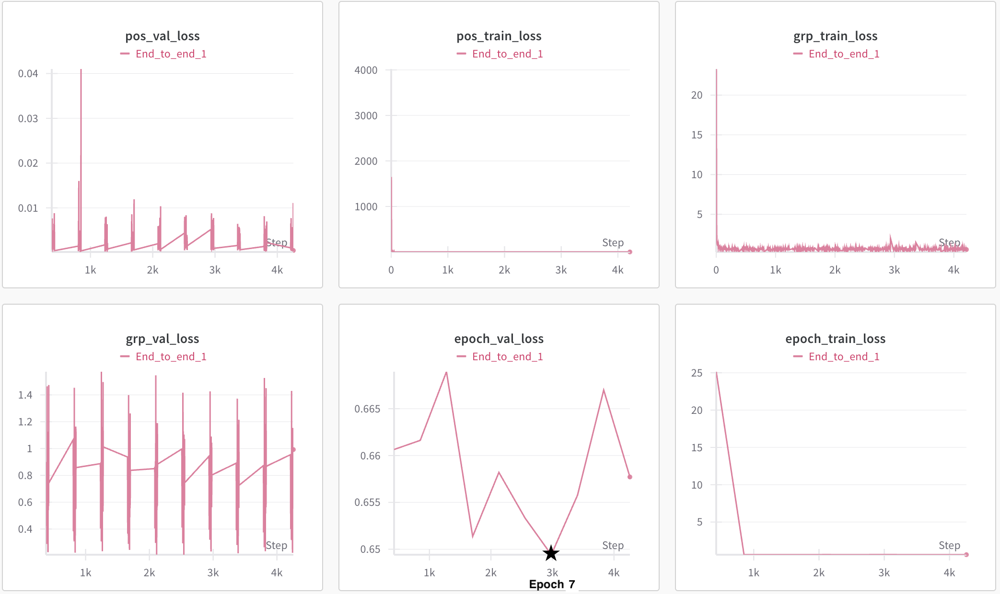

In [ ]:
# Baseline Run (WANDB)
image_path = '/content/drive/MyDrive/comp0188_2425/cw2/wandb/baseline_run.png'
display(Image(filename=image_path, width=1600))

#### Performance evaluation

To evaluate the model's performance, I calculated RMSE, MAE, and R2 along each dimension of the action variable's position. I chose RMSE because it provides a better understanding of the average error in the original scale of the variable. MAE is also in the same scale of the original variable but, unlike RMSE, measures the magnitude of the errors and penalizes large errors less than RMSE. R2 measures how well the independent variables explain the variance in the response variable. This metric is particularly important to calculate in addition to error because it is a measure of good linear fit. For all of the action dimensions (X,Y,Z), I calculated each metric separately to understand how the model was performing on each dimension. For the gripper action, I calculated precision, recall and F1 scores in order to get a better understanding of how the model was making incorrect/correct classifications and if this depended on class. For visualization, I plotted a scatterplot of the predictions vs the actuals for the position and created a 3x3 confusion matrix for the gripper.

The model achieved train RMSES of -1.05, -0.88,	-1.0 (respectively for X,Y,Z dimensions) and validation RMSES of 0.71, 0.77, 0.87. This, strangely, suggests that the model has a very poor fit for the training data's action position (negative R2 means the model is better off using the average as every prediction) but has a very good fit for the validation data's action position. Similarly, the model achieved training RMSES of 0.16, 0.14, 0.17 and validation RMSES of 0.06, 0.05,	0.04. For MAE, the model had training MAEs of 0.12,	0.10, and	0.13 and validation MAEs of 0.05,	0.03, and 0.03. Both of these additional error metrics confirm the previous behavior that the model is not making good predictions for the X,Y,Z coordinates on the training set but is making better predictions during validation. In the plots of predicted versus actuals, this is confirmed by the fact the validation plots are clustered roughly around the diagonal unlike the training plots which are horizontally scattered. This behavior is atypical but could suggest that the validation set is easier to make predictions on than the training dataset.

To evaluate the gripper action predictions, I created a confusion matrix. We can clearly see that the model is biased towards the majority class (action=1), seeing as the vast majority of labels and predictions are concentrated in the center of the matrix for both training and validation. In calculating the precision (TP/ TP+FP ), recall (TP/ TP+FN ), and F1 (harmonic mean of precision and recall) of the gripper predicition, we can see the validation set (precision=0.64, recall=0.76, F1= 0.68) also outperforms the training set (precision=0.59, recall=0.71, F1= 0.64). This F1 scores (range of 0-1) indicate that the model is performing fairly well on both the training and validation sets in identifying classes and minimizing false negatives, but the model performs slightly better on the validation set.

In examining the overall loss metrics as reported above at epoch 6, the weighted loss criterion reports the overall validation loss (0.65) as slightly worse than the overall training loss (0.63). The pos_train_loss (0.002) is worse than the pos_val_loss (0.001), but the grp_train_loss (0.56) is better than the grp_val_loss (0.8). The difference in the grp_train_loss and my evaluation metrics can be explained by the difference between the CrossEntropyLoss calculation and F1; different methods of evaluating performance may produce different conclusions.

Altogether, I would conclude the base model is not performing adequately, with concerns about the base model's ability to fit the training data, potential overfitting, and the oscillation of the loss curve.

In [ ]:
# Get Training and Validation Labels

train_labels = {"pos": [], "grp": []}
with torch.no_grad():
    for vals in train_dataloader:
        output_vals = {key: val for key, val in vals.output.items()}
        for k in output_vals.keys():
            train_labels[k].append(output_vals[k].detach().cpu())

train_labels = {k: torch.cat(train_labels[k], dim=0) for k in train_labels}

train_pos_labels = train_labels['pos']
train_grp_labels = train_labels['grp']

val_labels = {"pos": [], "grp": []}
with torch.no_grad():
    for vals in val_dataloader:
        input_vals = {key: val for key, val in vals.input.items()}
        output_vals = {key: val for key, val in vals.output.items()}
        for k in output_vals.keys():
            val_labels[k].append(output_vals[k].detach().cpu())
val_labels = {k: torch.cat(val_labels[k], dim=0) for k in val_labels}

val_pos_labels = val_labels['pos']
val_grp_labels = val_labels['grp']

In [ ]:
# Get Raw Predictions from 7th Epoch

train_pos_preds = pd.read_csv('/content/drive/MyDrive/comp0188_2425/cw2/predictions/epoch_7_train_preds_pos.csv',header=None)
train_grp_preds = pd.read_csv('/content/drive/MyDrive/comp0188_2425/cw2/predictions/epoch_7_train_preds_grp.csv',header=None)
val_pos_preds = pd.read_csv('/content/drive/MyDrive/comp0188_2425/cw2/predictions/epoch_7_val_preds_pos.csv',header=None)
val_grp_preds = pd.read_csv('/content/drive/MyDrive/comp0188_2425/cw2/predictions/epoch_7_val_preds_grp.csv',header=None)

In [ ]:
def evaluate_model_position(train_pos_labels,val_pos_labels,train_pos_preds,val_pos_preds,visualize=True):

    # Convert labels to numpy arrays
    train_pos_labels = train_pos_labels.numpy()
    val_pos_labels = val_pos_labels.numpy()

    # Convert predictions to numpy arrays
    train_pos_preds = train_pos_preds.values
    val_pos_preds = val_pos_preds.values

    # Calculate R2, RMSE, MAE for each dimension in training data
    train_r2 = [r2_score(train_pos_labels[:, i], train_pos_preds[:, i]) for i in range(train_pos_labels.shape[1])]
    train_rmse = np.sqrt(mean_squared_error(train_pos_labels, train_pos_preds, multioutput='raw_values'))
    train_mae = mean_absolute_error(train_pos_labels, train_pos_preds, multioutput='raw_values')

    # Calculate R2, RMSE, MAE for each dimension in validation data
    val_r2 = [r2_score(val_pos_labels[:, i], val_pos_preds[:, i]) for i in range(val_pos_labels.shape[1])]
    val_rmse = np.sqrt(mean_squared_error(val_pos_labels, val_pos_preds, multioutput='raw_values'))
    val_mae = mean_absolute_error(val_pos_labels, val_pos_preds, multioutput='raw_values')

    # Print R2, RMSE, MAE for each dimension
    eval_data = {
    "Metric": ["Training R2", "Validation R2", "Training RMSE", "Validation RMSE", "Training MAE", "Validation MAE"],
    "Dimension 1": [train_r2[0], val_r2[0], train_rmse[0], val_rmse[0], train_mae[0], val_mae[0]],
    "Dimension 2": [train_r2[1], val_r2[1], train_rmse[1], val_rmse[1], train_mae[1], val_mae[1]],
    "Dimension 3": [train_r2[2], val_r2[2], train_rmse[2], val_rmse[2], train_mae[2], val_mae[2]]
    }

    eval_df = pd.DataFrame(eval_data)
    eval_df = eval_df.set_index("Metric")
    display(eval_df)

    if visualize==True:
        # Plot Training Position Predictions vs Actuals
        fig, ax = plt.subplots(1, 3, figsize=(18, 6))

        # Dimension 1 (X-axis)
        ax[0].scatter(train_pos_labels[:, 0], train_pos_preds[:, 0], label='Pred vs Actual', alpha=0.7)
        ax[0].set_xlabel('True Position (X)')
        ax[0].set_ylabel('Predicted Position (X)')
        ax[0].set_title('Train Position Dimension 1 (X)')

        # Dimension 2 (Y-axis)
        ax[1].scatter(train_pos_labels[:, 1], train_pos_preds[:, 1], label='Pred vs Actual', alpha=0.7)
        ax[1].set_xlabel('True Position (Y)')
        ax[1].set_ylabel('Predicted Position (Y)')
        ax[1].set_title('Train Position Dimension 2 (Y)')

        # Dimension 3 (Z-axis)
        ax[2].scatter(train_pos_labels[:, 2], train_pos_preds[:, 2], label='Pred vs Actual', alpha=0.7)
        ax[2].set_xlabel('True Position (Z)')
        ax[2].set_ylabel('Predicted Position (Z)')
        ax[2].set_title('Train Position Dimension 3 (Z)')

        plt.tight_layout()
        plt.show()

        # Plot Validation Position Predictions vs Actuals
        fig, ax = plt.subplots(1, 3, figsize=(18, 6))

        # Dimension 1 (X-axis)
        ax[0].scatter(val_pos_labels[:, 0], val_pos_preds[:, 0], label='Pred vs Actual', alpha=0.7)
        ax[0].set_xlabel('True Position (X)')
        ax[0].set_ylabel('Predicted Position (X)')
        ax[0].set_title('Val Position Dimension 1 (X)')

        # Dimension 2 (Y-axis)
        ax[1].scatter(val_pos_labels[:, 1], val_pos_preds[:, 1], label='Pred vs Actual', alpha=0.7)
        ax[1].set_xlabel('True Position (Y)')
        ax[1].set_ylabel('Predicted Position (Y)')
        ax[1].set_title('Val Position Dimension 2 (Y)')

        # Dimension 3 (Z-axis)
        ax[2].scatter(val_pos_labels[:, 2], val_pos_preds[:, 2], label='Pred vs Actual', alpha=0.7)
        ax[2].set_xlabel('True Position (Z)')
        ax[2].set_ylabel('Predicted Position (Z)')
        ax[2].set_title('Val Position Dimension 3 (Z)')

        plt.tight_layout()
        plt.show()

,Dimension 1,Dimension 2,Dimension 3
Metric,,,
Training R2,-1.054253,-0.878923,-1.002941
Validation R2,0.706278,0.772140,0.872362
Training RMSE,0.160835,0.139422,0.167203
Validation RMSE,0.061087,0.046159,0.040832
Training MAE,0.123887,0.104727,0.129906
Validation MAE,0.048023,0.032008,0.030152


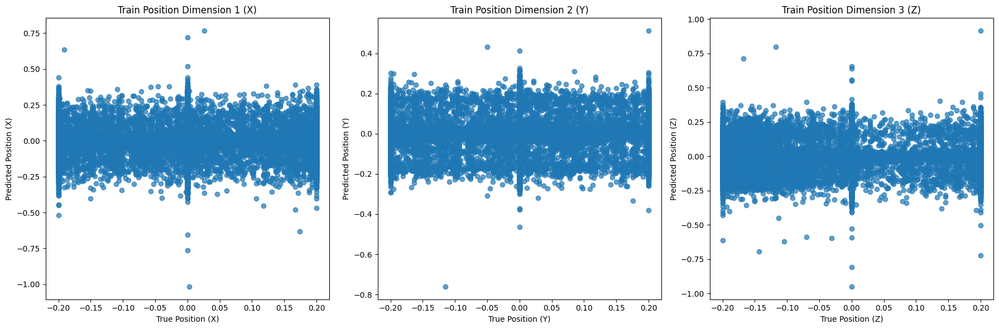

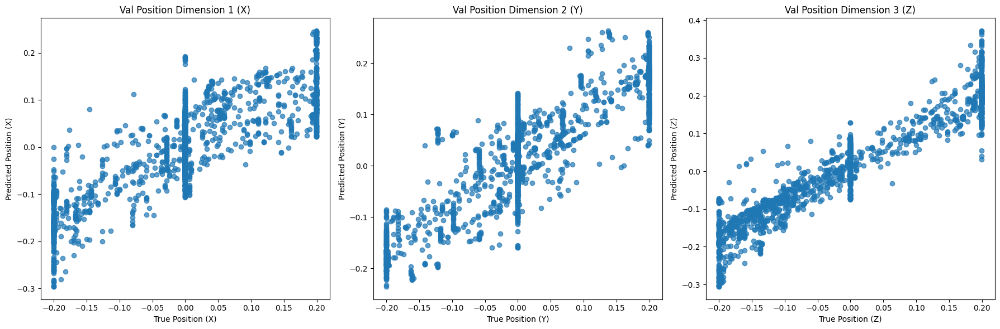

In [ ]:
evaluate_model_position(train_pos_labels,val_pos_labels,train_pos_preds,val_pos_preds,visualize=True)

In [ ]:
def evaluate_model_gripper(train_grp_labels,val_grp_labels,train_grp_preds,val_grp_preds,visualize=True):

    # Convert labels to numpy arrays
    train_grp_labels = train_grp_labels.numpy()
    val_grp_labels = val_grp_labels.numpy()

    # Convert predictions to numpy arrays
    train_grp_preds = train_grp_preds.values
    val_grp_preds = val_grp_preds.values

    # Convert logits to class predictions
    train_true_labels = np.argmax(train_grp_labels, axis=1)
    train_predicted_labels = np.argmax(train_grp_preds, axis=1)
    val_true_labels = np.argmax(val_grp_labels, axis=1)
    val_predicted_labels = np.argmax(val_grp_preds, axis=1)

    # Compute the training confusion matrix
    train_conf_matrix = confusion_matrix(train_true_labels, train_predicted_labels, labels=[0, 1, 2])
    val_conf_matrix = confusion_matrix(val_true_labels, val_predicted_labels, labels=[0, 1, 2])

    # Compute Precision, Recall, and F1 Score for Train
    train_precision = precision_score(train_true_labels, train_predicted_labels, average="weighted", zero_division=0)
    train_recall = recall_score(train_true_labels, train_predicted_labels, average="weighted", zero_division=0)
    train_f1 = f1_score(train_true_labels, train_predicted_labels, average="weighted", zero_division=0)

    # Compute Precision, Recall, and F1 Score for Validation
    val_precision = precision_score(val_true_labels, val_predicted_labels, average="weighted", zero_division=0)
    val_recall = recall_score(val_true_labels, val_predicted_labels, average="weighted", zero_division=0)
    val_f1 = f1_score(val_true_labels, val_predicted_labels, average="weighted", zero_division=0)

    # Print Evaluation Metrics
    print(f"Training Precision: {train_precision:.4f}, Recall: {train_recall:.4f}, F1 Score: {train_f1:.4f}")
    print(f"Validation Precision: {val_precision:.4f}, Recall: {val_recall:.4f}, F1 Score: {val_f1:.4f}")

    if visualize:
        # Create a subplot with 1 row and 2 columns for train and validation confusion matrices
        fig, ax = plt.subplots(1, 2, figsize=(16, 8))

        # Plot the training confusion matrix
        train_disp = ConfusionMatrixDisplay(confusion_matrix=train_conf_matrix, display_labels=[0, 1, 2])
        train_disp.plot(ax=ax[0], cmap="Blues", colorbar=True)
        ax[0].set_title("Train Confusion Matrix")
        ax[0].set_xlabel("Predicted Label")
        ax[0].set_ylabel("True Label")

        # Plot the validation confusion matrix
        val_disp = ConfusionMatrixDisplay(confusion_matrix=val_conf_matrix, display_labels=[0, 1, 2])
        val_disp.plot(ax=ax[1], cmap="Blues", colorbar=True)
        ax[1].set_title("Validation Confusion Matrix")
        ax[1].set_xlabel("Predicted Label")
        ax[1].set_ylabel("True Label")

        plt.tight_layout()
        plt.show()

Training Precision: 0.5929, Recall: 0.7069, F1 Score: 0.6377
Validation Precision: 0.6367, Recall: 0.7556, F1 Score: 0.6808


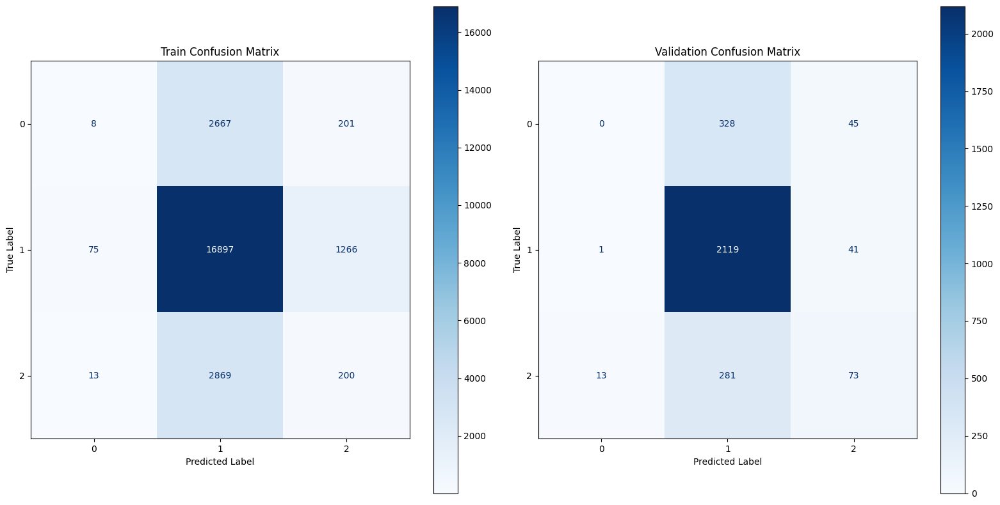

In [ ]:
evaluate_model_gripper(train_grp_labels,val_grp_labels,train_grp_preds,val_grp_preds,visualize=True)

#### Model failure modes

To investigate failure modes of the model, I began by plotting the confusion matrix above. This gave evidence of the model being biased towards the majority class (action type 1) and failing on the minority classes (action type 1 and 2). Using the results from the confusion matrix above, we can calculate the accuracy (correct predictions/total predictions) of each label as follows:

Training Accuracy Type 0: 0.3%

Validation Accuracy Type 0: 0.0%

Training Accuracy Type 1: 92.6%

Validation Accuracy Type 1: 98.1%

Training Accuracy Type 2: 6.4%

Validation Accuracy Type 2: 19.9%

Therefore, the model is clearly failing to classify action type 0 and type 2, with more extreme error on type 0. This makes sense given our dataset construction, seeing as action type 1 makes up 75% of our training observations whereas type 0 and type 2 make up 12% and 13% respectively. When a training set is imbalanced, this causes the model to form a bias towards the majority class as making correct predictions for this class is the quickest way to minimize loss.

Next, I calculated precision, recall, and f1 scores for each individual class rather than for the entire model. This confirmed my hypothesis from the confusion matrix that the model is performing best on action type 1, with a 75% precision score, 79% recall score, and 77% overall f1 score. This is much higher than the two minority classes (action 0: 12.6%, 10.2%, 11.25%, action 2: 12.8%, 11.7%, 12.3%).

Finally, I wanted to plot the confidences of the correct and incorrect predictions for each class for training and validation to understand how significant this problem is for my model. The confidences will provide this information because we are using CrossEntropyLoss which penalizes low confidence. If there is low confidence in my predictions, this will increase the overall loss.

I calculated the confidences by passing the raw logits into a softmax to get probabilities and then taking the max argument for the predictions. If the model assigned a relatively higher probability, I am considering that to mean it was a more confident prediction. I found that for action type 1 (the majority class), the model had much lower confidence in the incorrect predictions on average than the correct predictions (seen by the blue histograms skewed right while the orange histograms are skewed left). For the two minority classes, there are a range of confidences for both the incorrect and correct predictions, confirming my model is far less confident on predicting the minority clases. A large portion of the incorrect predictions also have very high confidence (orange histograms skewed right in 3 out of 4 cases) which suggests my model is performing very poorly on the minority classes by confidently making incorrect predictions.

Altogether, the model is making incorrect yet confident predictions on the action types 0 and 2 due to their lack of representation in the dataset. Furthermore, there are lower confidences in the correct predictions for the minority classes. This is a significant problem due to the low confidences in the incorrect predictions, which will be picked up by our CrossEntropyLoss function. This suggests a critical need to address class imbalance to improve the model.


Class: action_0:
  Precision: 0.1255
  Recall: 0.1019
  F1 Score: 0.1125
-----------------
Class: action_1:
  Precision: 0.7531
  Recall: 0.7869
  F1 Score: 0.7696
-----------------
Class: action_2:
  Precision: 0.1283
  Recall: 0.1171
  F1 Score: 0.1225
-----------------


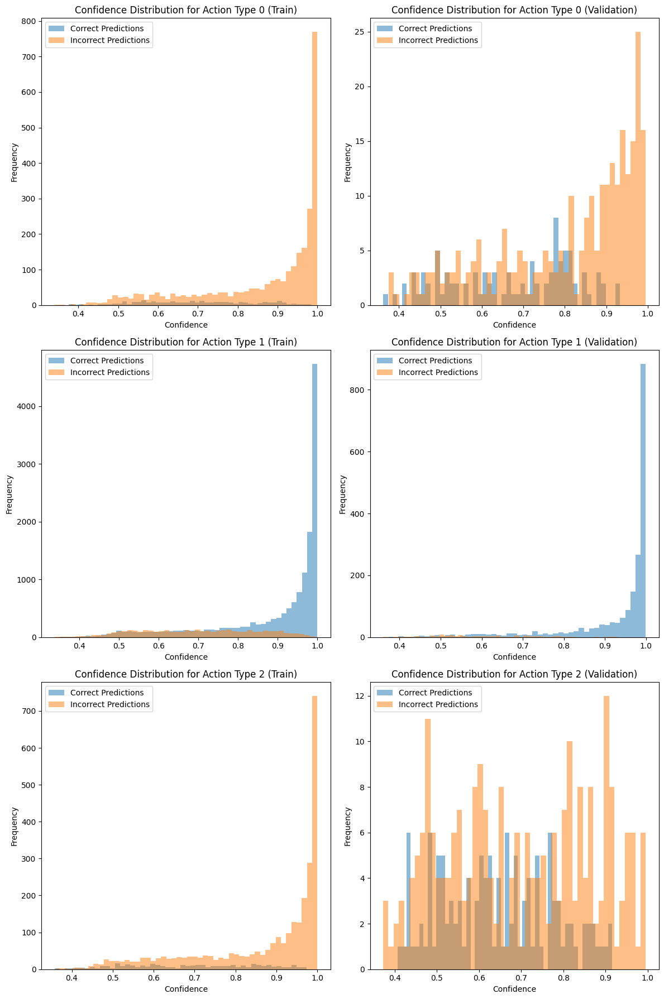

In [ ]:
# Calculate precision, recall, and f1 for each individual class


def investigate_failure_modes(train_grp_labels, val_grp_labels, train_grp_preds, val_grp_preds, visualize=True):
    """
    Investigates the failure modes of the model by analyzing prediction confidences
    for correct and incorrect predictions.

    Args:
        train_grp_labels: True labels for the training set.
        val_grp_labels: True labels for the validation set.
        train_grp_preds: Predicted labels for the training set.
        val_grp_preds: Predicted labels for the validation set.
        visualize: Whether to visualize the confidence distributions.

    """

    # Convert labels to numpy arrays
    train_grp_labels = train_grp_labels.numpy()
    val_grp_labels = val_grp_labels.numpy()

    # Convert predictions to numpy arrays
    train_grp_preds = train_grp_preds.values
    val_grp_preds = val_grp_preds.values

    # Convert logits to probabilities using softmax
    train_probs = F.softmax(torch.tensor(train_grp_preds), dim=1).numpy()
    val_probs = F.softmax(torch.tensor(val_grp_preds), dim=1).numpy()

    # Get class predictions and confidences from probabilities
    train_true_labels = np.argmax(train_grp_labels, axis=1)
    train_predicted_labels = np.argmax(train_probs, axis=1)
    train_confidences = np.max(train_probs, axis=1)

    val_true_labels = np.argmax(val_grp_labels, axis=1)
    val_predicted_labels = np.argmax(val_probs, axis=1)
    val_confidences = np.max(val_probs, axis=1)

    # Calculate metrics for each class
    num_classes = train_grp_labels.shape[1]
    metrics = {}
    for class_idx in range(num_classes):
        precision = precision_score(train_true_labels == class_idx, train_predicted_labels == class_idx, zero_division=0)
        recall = recall_score(train_true_labels == class_idx, train_predicted_labels == class_idx, zero_division=0)
        f1 = f1_score(train_true_labels == class_idx, train_predicted_labels == class_idx, zero_division=0)

        metrics[f"action_{class_idx}"] = {
            "precision": precision,
            "recall": recall,
            "f1": f1
        }

    # Print the metrics
    for class_idx, class_metrics in metrics.items():
        print(f"Class: {class_idx}:")
        print(f"  Precision: {class_metrics['precision']:.4f}")
        print(f"  Recall: {class_metrics['recall']:.4f}")
        print(f"  F1 Score: {class_metrics['f1']:.4f}")
        print('-----------------')

    # Threshold Analysis
    train_correct_confidences = train_confidences[train_true_labels == train_predicted_labels]
    train_incorrect_confidences = train_confidences[train_true_labels != train_predicted_labels]

    val_correct_confidences = val_confidences[val_true_labels == val_predicted_labels]
    val_incorrect_confidences = val_confidences[val_true_labels != val_predicted_labels]

    if visualize:
        num_classes = train_grp_labels.shape[1]
        fig, axes = plt.subplots(num_classes, 2, figsize=(12, 6 * num_classes))

        for class_idx in range(num_classes):
            # Train set
            train_correct_confidences = train_confidences[(train_true_labels == class_idx) & (train_true_labels == train_predicted_labels)]
            train_incorrect_confidences = train_confidences[(train_true_labels == class_idx) & (train_true_labels != train_predicted_labels)]

            axes[class_idx, 0].hist(train_correct_confidences, bins=50, alpha=0.5, label="Correct Predictions")
            axes[class_idx, 0].hist(train_incorrect_confidences, bins=50, alpha=0.5, label="Incorrect Predictions")
            axes[class_idx, 0].set_title(f"Confidence Distribution for Action Type {class_idx} (Train)")
            axes[class_idx, 0].set_xlabel("Confidence")
            axes[class_idx, 0].set_ylabel("Frequency")
            axes[class_idx, 0].legend()

            # Validation set
            val_correct_confidences = val_confidences[(val_true_labels == class_idx) & (val_true_labels == val_predicted_labels)]
            val_incorrect_confidences = val_confidences[(val_true_labels == class_idx) & (val_true_labels != val_predicted_labels)]

            axes[class_idx, 1].hist(val_correct_confidences, bins=50, alpha=0.5, label="Correct Predictions")
            axes[class_idx, 1].hist(val_incorrect_confidences, bins=50, alpha=0.5, label="Incorrect Predictions")
            axes[class_idx, 1].set_title(f"Confidence Distribution for Action Type {class_idx} (Validation)")
            axes[class_idx, 1].set_xlabel("Confidence")
            axes[class_idx, 1].set_ylabel("Frequency")
            axes[class_idx, 1].legend()

        plt.tight_layout()
        plt.show()

investigate_failure_modes(train_grp_labels,val_grp_labels,train_grp_preds,val_grp_preds,visualize=True)


### Model tuning

In [ ]:
# Calculate weights for each class

# Calculate the total number of samples
total_samples = train_grp_labels.shape[0]

# Calculate the count of each class
class_counts = torch.sum(train_grp_labels, dim=0).tolist()

# Calculate the percentage of each class
class_percentages = [(count / total_samples) * 100 for count in class_counts]

# Print the percentages
print("Class Percentages:")
for i, percentage in enumerate(class_percentages):
    print(f"Class {i}: {percentage:.2f}%")

# Calculate weights
class_weights = [1.0 / percentage for percentage in class_percentages]
total_weight = sum(class_weights)
class_weights = [weight / total_weight for weight in class_weights]

# Making the weights less extreme based on experimentation
class_weights = [class_weights[0], class_weights[1], class_weights[2]]

print("Class Weights for Loss:")
for i, weight in enumerate(class_weights):
    print(f"Class {i}: {weight:.4f}")

Class Percentages:
Class 0: 12.02%
Class 1: 75.18%
Class 2: 12.80%
Class Weights for Loss:
Class 0: 0.4765
Class 1: 0.0762
Class 2: 0.4473


In [ ]:
# Redefine cross entropy loss to give weights to minority classes
class_weights = torch.tensor(class_weights,device=torch.device('cuda'))
pos_criterion = nn.MSELoss(reduction="mean")
grp_criterion = nn.CrossEntropyLoss(reduction="mean",weight=class_weights) # Add in pre-calculated weights

improved_cnn2_config = ConvolutionLayersConfig(
    input_dim=224,
    input_channels=2,
    layers=[
        nn.Conv2d(
            in_channels=2,
            out_channels=16,
            kernel_size=(3,3),
            stride=1,
            padding=1,
            dilation=1
          ),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=(2,2)),
        nn.Conv2d(
            in_channels=16,
            out_channels=32,
            kernel_size=(3,3),
            stride=1,
            padding=1
          ),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=(2,2)),
        nn.Conv2d(
            in_channels=32,
            out_channels=64,
            kernel_size=(3,3),
            stride=1,
            padding=1
          ),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=(2,2)),
        nn.Conv2d(in_channels=64,
                  out_channels=128,
                  kernel_size=(3,3),
                  stride=1,
                  padding=1), # Adding a new convolutional layer
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=(2,2)),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=(2,2)),
        nn.Conv2d(in_channels=128,
                  out_channels=256,
                  kernel_size=(3,3),
                  stride=1,
                  padding=1), # Adding a new convolutional layer
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=(2,2))
       ]
   )

improved_cnn_output_dim = improved_cnn2_config.get_output_dims()
improved_cnn_output_channels = improved_cnn2_config.get_output_channels()
improved_mlp_input_dim = int(
            (improved_cnn_output_dim[-1]*improved_cnn_output_dim[-1])*improved_cnn_output_channels[-1]
            )


improved_image_encoder = JointCNNEncoder(
    cnn=CNN(improved_cnn2_config),
    dense=MLP(
        input_dim=improved_mlp_input_dim,
        hidden_dims=[512,256],
        output_dim=128,
        dropouts=[0.3,0.3]
        )
)

improved_obs_encoder = MLP(
    input_dim = 15,
    hidden_dims = [512,256],
    output_dim = 128,
    dropouts = [0.3,0.3]
)

improved_dense = MLP(
    input_dim = 128,
    hidden_dims = [128, 64, 32],
    output_dim = 6,
    dropouts = [0.3,0.3,0.3]
)

class ImprovedBaseline(BaseModel):

  def __init__(
      self,
      image_encoder:JointCNNEncoder,
      obs_encoder:MLP,
      dense:MLP
      ) -> None:
      super().__init__()
      self.image_encoder = image_encoder
      self.obs_encoder = obs_encoder
      self.dense = dense

  def forward(self, images, obs):
    _img_enc = self.image_encoder(images)
    _obs_enc = self.obs_encoder(obs)
    _dense_enc = self.dense(_img_enc+_obs_enc)
    pos = _dense_enc[:,0:3]
    grp = _dense_enc[:,3:]
    return {
        "pos": pos,
        "grp":grp
        }
  def reset(
      self,
      image_encoder_kwargs,
      obs_encoder_kwargs,
      dense_kwargs
      ):
    self.image_encoder.reset(**image_encoder_kwargs)
    self.obs_encoder.reset(**obs_encoder_kwargs)
    self.dense.reset(**dense_kwargs)

torch.manual_seed(5)
improved_model = ImprovedBaseline(
    image_encoder=improved_image_encoder,
    obs_encoder=improved_obs_encoder,
    dense=improved_dense
)

torch.manual_seed(5)
improved_model.reset({},{},{})
exp_kwargs = {
    "batch_size": 64,
    "learning_rate": 0.001,
    "half_precision": True,
    "target_offset": 0
}

# Define a learning rate scheduler
scheduler = torch.optim.lr_scheduler.StepLR(
    optimizer,
    step_size=4,
    gamma=0.2
)

exp_kwargs["model_def"] = improved_model.__repr__()

first_batch = next(train_dataloader.__iter__())

if exp_kwargs["half_precision"]:
    improved_model = improved_model.half()
optimizer = torch.optim.Adam(
    improved_model.parameters(), lr=exp_kwargs["learning_rate"],
    eps=1e-04
    )

__criterion = TrackerBalancedLoss(
    loss_lkp={
        "pos":pos_criterion,
        "grp": grp_criterion
    }
    )

if exp_kwargs["half_precision"]:
    with torch.no_grad():
        if torch.cuda.is_available():
            improved_model = improved_model.cuda()
            with torch.autocast(device_type="cuda"):
                res = improved_model(
                    images=first_batch.input["images"].cuda(),
                    obs=first_batch.input["obs"].cuda()
                    )
                first_batch.output["pos"] = first_batch.output["pos"].cuda()
                first_batch.output["grp"] = first_batch.output["grp"].cuda()
        else:
            with torch.autocast(device_type="cuda"):
                res = improved_model(
                    images=first_batch.input["images"],
                    obs=first_batch.input["obs"]
                    )
else:
    with torch.no_grad():
        if torch.cuda.is_available():
            improved_model = improved_model.cuda()
            res = improved_model(
                images=first_batch.input["images"].cuda(),
                obs=first_batch.input["obs"].cuda()
                )
            first_batch.output["pos"] = first_batch.output["pos"].cuda()
            first_batch.output["grp"] = first_batch.output["grp"].cuda()
        else:
            res = improved_model(
                images=first_batch.input["images"],
                obs=first_batch.input["obs"]
                )

mo = WandBMetricOrchestrator()

train_criterion = TrackerBalancedLoss(
    loss_lkp={
        "pos":copy.deepcopy(pos_criterion),
        "grp":copy.deepcopy(grp_criterion)
    },
    name="train",
    mo=mo
    )

val_criterion = TrackerBalancedLoss(
    loss_lkp={
        "pos":copy.deepcopy(pos_criterion),
        "grp":copy.deepcopy(grp_criterion)
    },
    name="val",
    mo=mo
    )

sl_trainer = TorchTrainingLoop(
    model=improved_model, gpu=True, optimizer=optimizer, criterion=train_criterion,
    val_criterion=val_criterion, epochs=10, logger=logger,
    mo=WandBMetricOrchestrator(), half_precision=exp_kwargs["half_precision"],
    preds_save_type="csv",output_dir='/content/drive/MyDrive/comp0188_2425/cw2/predictions/improved',
    scheduler=scheduler
)

wandb_name = "End_to_end_1"
wandb_grp="End_to_end"

if project_options.debug:
    wandb_name = f"{wandb_name}_DEBUG"

orig = datetime.datetime.now()
sl_trainer.training_loop(
    train_loader=train_dataloader,
    val_loader=val_dataloader,
    wandb_proj=WANDB_PROJECT,
    wandb_grp=wandb_grp,
    wandb_config=exp_kwargs,
    wandb_name=wandb_name,
    reset_kwargs={
        "image_encoder_kwargs": {},
        "obs_encoder_kwargs": {},
        "dense_kwargs": {}
    }
    )
post_train = datetime.datetime.now()


wandb: Using wandb-core as the SDK backend.  Please refer to https://wandb.me/wandb-core for more information.
wandb: Currently logged in as: ucabtc8 (ucabtc8-university-college-london-ucl-). Use `wandb login --relogin` to force relogin


INFO:cw2_logger:Running epochs: 10
INFO:cw2_logger:Running training epoch
100%|██████████| 398/398 [00:34<00:00, 11.54it/s]
INFO:cw2_logger:epoch 1	 training loss : 24.96875
INFO:cw2_logger:Running validation
INFO:cw2_logger:epoch 1	 validation loss : 0.1793212890625 
/usr/local/lib/python3.10/dist-packages/torch/optim/lr_scheduler.py:224: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn(
INFO:cw2_logger:Running training epoch
100%|██████████| 398/398 [00:33<00:00, 11.83it/s]
INFO:cw2_logger:epoch 2	 training loss : 0.56103515625
INFO:cw2_logger:Running validation
INFO:cw2_logger:epoch 2	 validation loss : 0.178955078125 
INFO:cw2_logg

epoch_train_loss,█▁▁▁▁▁▁▁▁▁
epoch_val_loss,███▇▇▅▅▄▁▁
grp_train_loss,▅▅▄█▄▅▇▅▅▆▃▅▂▆▄▃▅▁▁▃▄▁▅▄▂▄▄▄▃▅▄▄▃▃▃▇▃▃▄▂
grp_val_loss,▇▇▄▂▂▅▄▂▃▃▃▅▄▃▃▄▆▃▂▄▂▇▄▃▁▄▂▃▂▄▂▂▃▂▁▁▄█▄▃
pos_train_loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
pos_val_loss,█▃▄▅▄▅▄▄▂▂▂▄▂▂▂▃▂▅▃▁▁▁▂▂▃▁▂▂▂▂▁▂▁▂▄▂▃▄▄▂
epoch_train_loss,0.20117
epoch_val_loss,0.17346
grp_train_loss,0.15825
grp_val_loss,0.11963
pos_train_loss,0.02708


,Dimension 1,Dimension 2,Dimension 3
Metric,,,
Training R2,-3.161124,-3.245977,-2.538373
Validation R2,0.761639,0.751848,0.878258
Training RMSE,0.227526,0.208626,0.222151
Validation RMSE,0.055030,0.048171,0.039878
Training MAE,0.164158,0.151932,0.163303
Validation MAE,0.038712,0.033055,0.028777


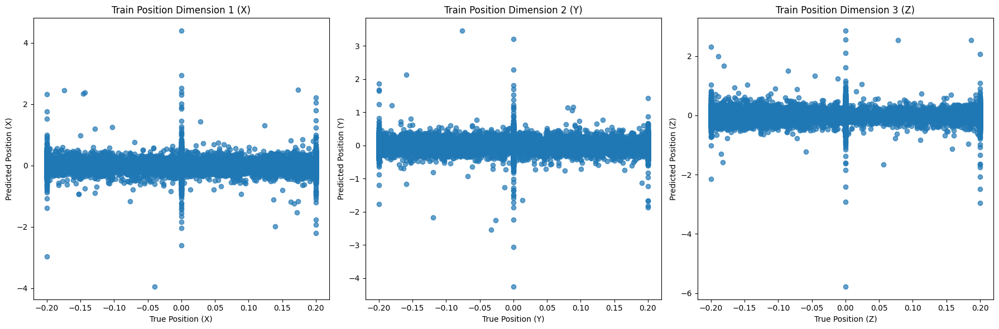

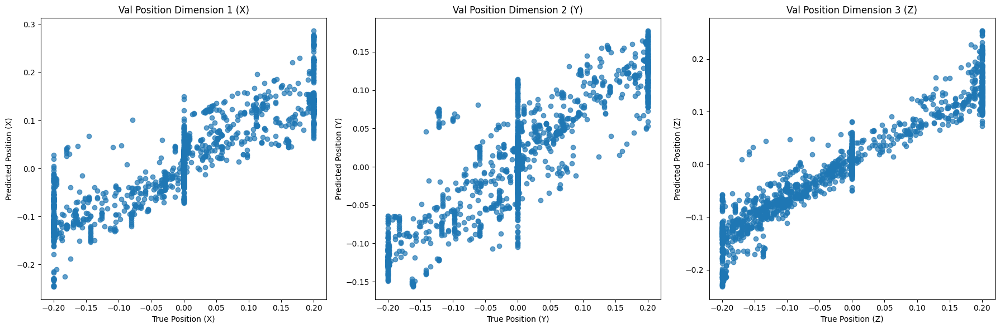

Training Precision: 0.5967, Recall: 0.4662, F1 Score: 0.5147
Validation Precision: 0.6913, Recall: 0.6225, F1 Score: 0.6465


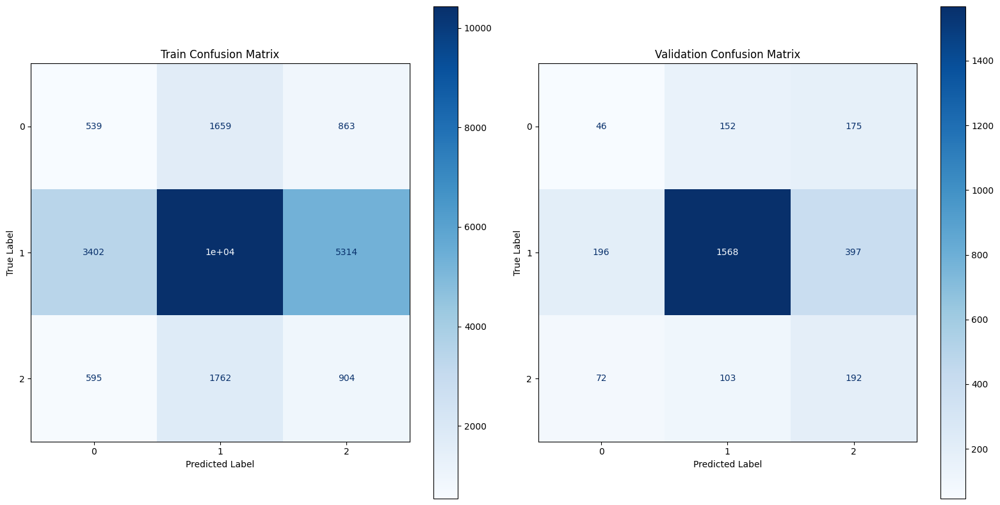

In [ ]:
# Get Predicted Values

# MODEL CODE MOVED TO APPENDIX DUE TO FILE SIZE LIMITS

train_pos_preds = pd.read_csv('/content/drive/MyDrive/comp0188_2425/cw2/predictions/improved/epoch_10_train_preds_pos.csv',header=None)
train_grp_preds = pd.read_csv('/content/drive/MyDrive/comp0188_2425/cw2/predictions/improved/epoch_10_train_preds_grp.csv',header=None)
val_pos_preds = pd.read_csv('/content/drive/MyDrive/comp0188_2425/cw2/predictions/improved/epoch_10_val_preds_pos.csv',header=None)
val_grp_preds = pd.read_csv('/content/drive/MyDrive/comp0188_2425/cw2/predictions/improved/epoch_10_val_preds_grp.csv',header=None)

evaluate_model_position(train_pos_labels,val_pos_labels,train_pos_preds,val_pos_preds,visualize=True)
evaluate_model_gripper(train_grp_labels,val_grp_labels,train_grp_preds,val_grp_preds,visualize=True)

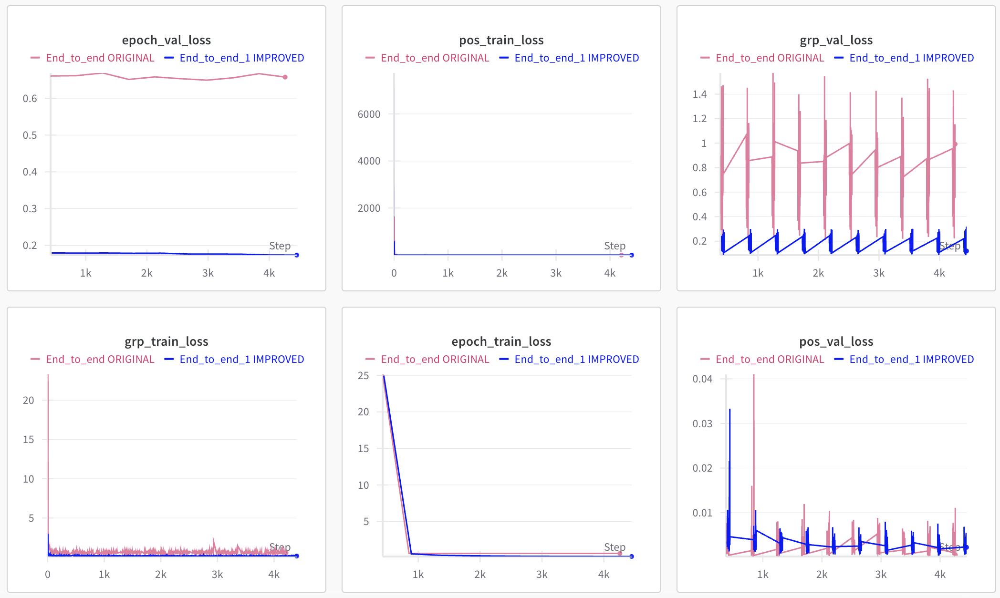

In [ ]:
# Improved Run (WANDB)
image_path = '/content/drive/MyDrive/comp0188_2425/cw2/wandb/improved_run.png'
display(Image(filename=image_path, width=1600))

List of improvements made to final model:

*   Increased Model Complexity (2 additional convolutional layers, increased hidden dimension size)
*   Class weights in Cross Entropy Loss
*   Dropout
*   Learning Rate Scheduler


#### Experiment 1 discussion

*** I conducted each experiment by applying the improvements to the original base model individually. Due to the large size of the code and outputs for each model, I had to delete these code blocks to continue running the notebook in Google Colab. I have added in the code used to run the models for each experiment to an Appendix at the end of the notebook. ***

##### Description

For my first experiment, I added dropout to my model. Dropout randomly deactivates neurons in each layer of the network it is applied to with a given probability in order to reduce overfitting by making each neuron less dependent on each other. In the final model, I decided to add dropout probabilities of 0.3 to each layer of the MLPs (encoder MLPs and final MLP). I settled on these values after experimenting with probabilities 0.2, 0.3, and 0.4 in both the CNN and MLPs. Please see the Appendix for the code used to run experiment #1.

##### Justification

I decided to experiment with dropout because I suspected there could be overfitting happening in my model. Over the 10 epochs, the validation loss started rapidly increasing after epoch 7. Typically, validation loss plateauing or increasing over epochs while training loss decreases is a sign of overfitting. Therefore, I wanted to see if adding dropout would smooth the loss curve and encourage further learning across all 10 epochs.

Although there was some evidence of overfitting based on the increase in my validation loss after epoch 7, it is worth noting that my evaluation revealed the validation set above was performing much better than the training set across all dimensions and all metrics (RMSE, MAE, R2, Precision, Recall, F1).  Typically, overfitting would suggest that the model performs better on the training data than the validation data. Despite this conflicting evidence, I decided to experiment with dropout and did find a jump in performance in most of my trials.

##### Conclusion
I learned from my experiment that dropout, depending on the selected probability and number of layers it was applied to, did smooth the validation loss curve and improve the final loss achieved.

I found that adding dropout only to the CNN layer with probability 0.2 made the model worse in terms of the total validation loss. In contrast, adding dropout to all of the layers of all of the MLPs in the model had an increase in performance. I tested probabilities 0.2, 0.3, 0.4, and found that 0.3 minimized the validation loss at epoch 10, but the validation loss was still slightly lower at epoch 7. Because of this, I will continue to use epoch 7 to evaluate the experiment below. Please see the screenshot from WANDB below to see how each dropout addition altered the loss curves.

I also found that adding dropout caused a significant decrease in the R2 scores for all three dimensions for both training and validation. There were also increases in RMSE and MAE. Therefore, in the final improved model, I will continue to hypertune to address the decreased ability to fit the training data caused by adding dropout.

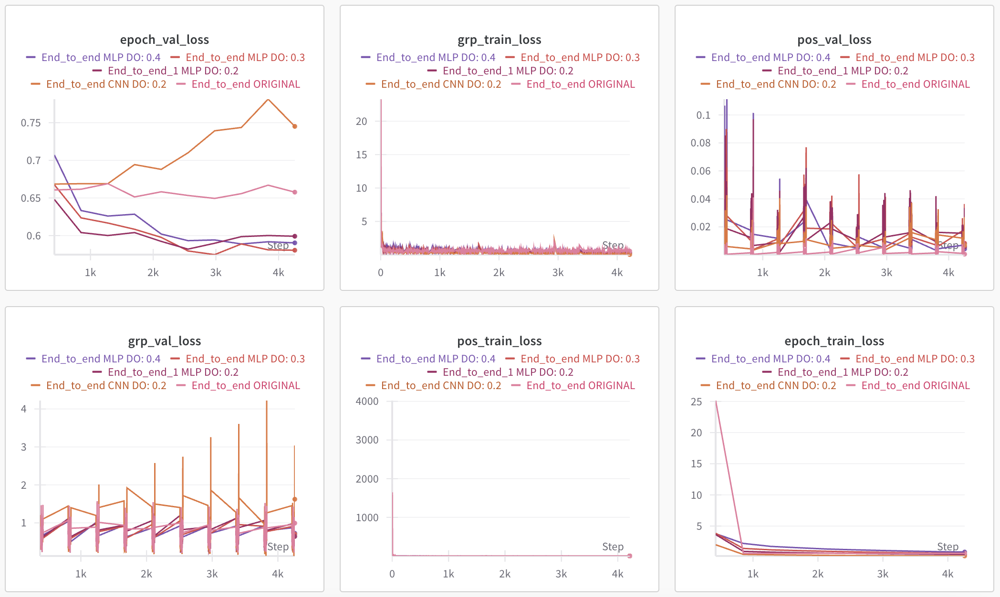

In [ ]:
# Experiment 1 Run (WANDB)
image_path = '/content/drive/MyDrive/comp0188_2425/cw2/wandb/exp1_run.png'
display(Image(filename=image_path, width=1600))

In [ ]:
# Get Predicted Values

# MODEL CODE MOVED TO THE APPENDIX DUE TO FILE SIZE LIMITS

train_pos_preds = pd.read_csv('/content/drive/MyDrive/comp0188_2425/cw2/predictions/exp1/epoch_7_train_preds_pos.csv',header=None)
train_grp_preds = pd.read_csv('/content/drive/MyDrive/comp0188_2425/cw2/predictions/exp1/epoch_7_train_preds_grp.csv',header=None)
val_pos_preds = pd.read_csv('/content/drive/MyDrive/comp0188_2425/cw2/predictions/exp1/epoch_7_val_preds_pos.csv',header=None)
val_grp_preds = pd.read_csv('/content/drive/MyDrive/comp0188_2425/cw2/predictions/exp1/epoch_7_val_preds_grp.csv',header=None)

,Dimension 1,Dimension 2,Dimension 3
Metric,,,
Training R2,-26.770333,-37.299340,-21.036910
Validation R2,0.179304,-0.401288,0.384147
Training RMSE,0.591351,0.629467,0.554606
Validation RMSE,0.102110,0.114470,0.089691
Training MAE,0.443935,0.469402,0.417394
Validation MAE,0.079411,0.090235,0.070548


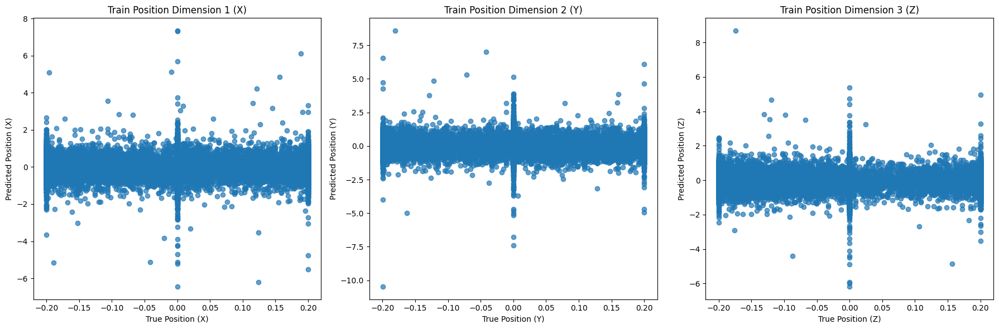

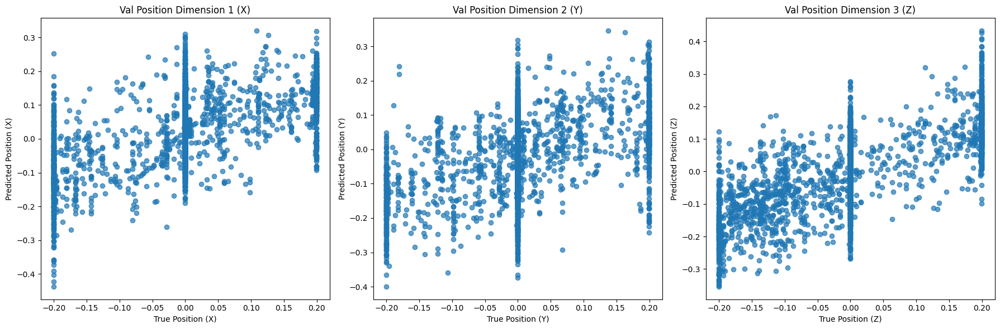

Training Precision: 0.5982, Recall: 0.6411, F1 Score: 0.6179
Validation Precision: 0.7102, Recall: 0.7570, F1 Score: 0.7092


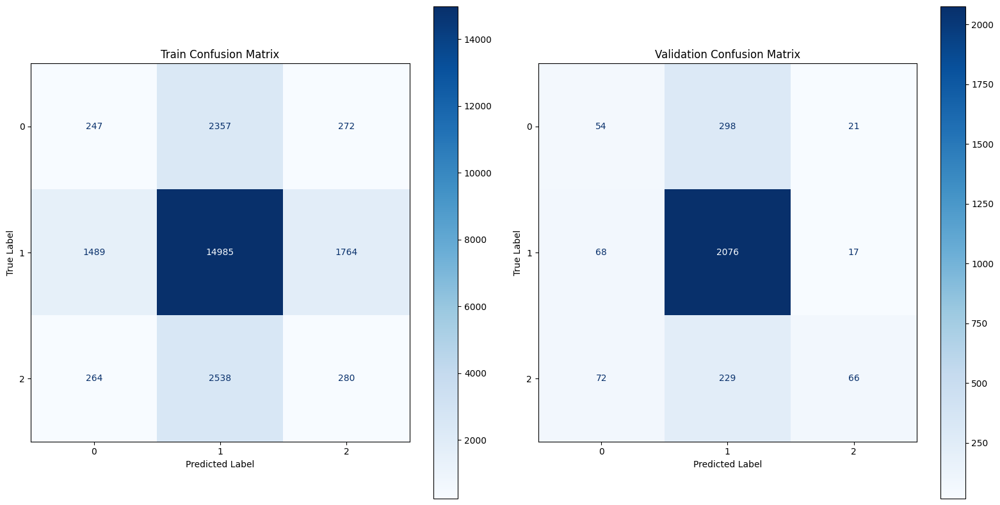

In [ ]:
evaluate_model_position(train_pos_labels,val_pos_labels,train_pos_preds,val_pos_preds,visualize=True)
evaluate_model_gripper(train_grp_labels,val_grp_labels,train_grp_preds,val_grp_preds,visualize=True)

#### Experiment 2 discussion

##### Description

In my second experiment, I wanted to adjust the loss criterion by adding class weights to my Cross Entropy loss function. For each class in my training dataset, I calculated how much that class represented of the total. Then, I took the inverse of this value to create a weight for each class and normalized them to make the weights sum up to 1. These weights are then used in the CrossEntropyLoss function to scale the loss for each class. This will address class imbalance by scaling the loss for minority classes more heavily to force the model to focus on minority classes (in reverse proportion to their frequency) in addition to the majority class. Please see the Appendix for code used to run experiment #2.

##### Justification

I am conducting this experiment due to the heavy class imbalance as seen in the failure mode investigation above. I knew that it was heavily underperforming on predicting the minority classes and so I wanted to penalize the model more if it predicted the minority classes incorrectly to encourage higher overall accuracy and balance individual class accuracies.

##### Conclusion

I learned from the experiment that adding weights to Cross Entropy Loss was very effective. First, I found that the overall loss of the model heavily decreased. The overall epoch validation loss jumped from ending at around 0.65 to ending below 0.2 at the final epoch. This decrease in overall epoch loss can be attributed to the decrease in gripper validation loss, as seen by the bottom left chart on the wandb screenshot below. The weighted model (green) operates at a 10th of the loss of the original model across all epochs.

Additionally, the model's improved ability to make predictions on the minority classes is seen by the confusion matrix below. The validation accuracy for action type 0 went up from 0% to 3% and the validation accuracy, although the validation accuracy for type 2 did decrease from 19% to 17%. The overall f1 score for validation increased from 68% to 69%. Although these are not huge jumps in class performance metrics, we can see that the effect was significant on the overall validation loss of the model. Due to time constraints, I was not able to refine the weights further. With additional time and resources, I would have liked to continue to experiment with different sets of weights and potentially add data augmentation to create additional samples for the minority classes.

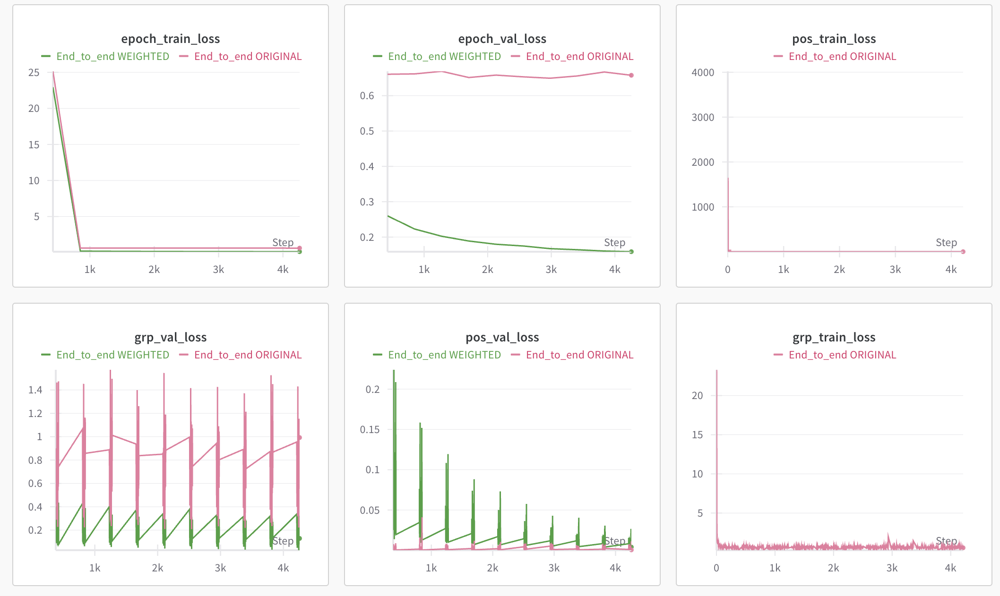

In [ ]:
# Experiment 2 Run (WANDB)
image_path = '/content/drive/MyDrive/comp0188_2425/cw2/wandb/exp2_run.png'
display(Image(filename=image_path, width=1600))

In [ ]:
# Plot predictions vs true values

# MODEL CODE MOVED TO THE APPENDIX DUE TO FILE SIZE LIMITS

# Get Predicted Values
train_pos_preds = pd.read_csv('/content/drive/MyDrive/comp0188_2425/cw2/predictions/exp2/epoch_10_train_preds_pos.csv',header=None)
train_grp_preds = pd.read_csv('/content/drive/MyDrive/comp0188_2425/cw2/predictions/exp2/epoch_10_train_preds_grp.csv',header=None)
val_pos_preds = pd.read_csv('/content/drive/MyDrive/comp0188_2425/cw2/predictions/exp2/epoch_10_val_preds_pos.csv',header=None)
val_grp_preds = pd.read_csv('/content/drive/MyDrive/comp0188_2425/cw2/predictions/exp2/epoch_10_val_preds_grp.csv',header=None)

,Dimension 1,Dimension 2,Dimension 3
Metric,,,
Training R2,-1.184198,-1.953088,-1.314376
Validation R2,0.303343,-0.434016,0.408639
Training RMSE,0.165844,0.174789,0.179732
Validation RMSE,0.094078,0.115799,0.087889
Training MAE,0.130075,0.137389,0.142839
Validation MAE,0.072489,0.090521,0.068532


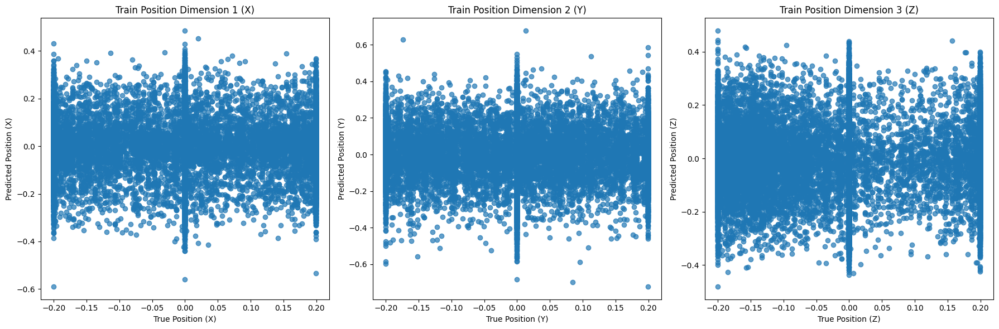

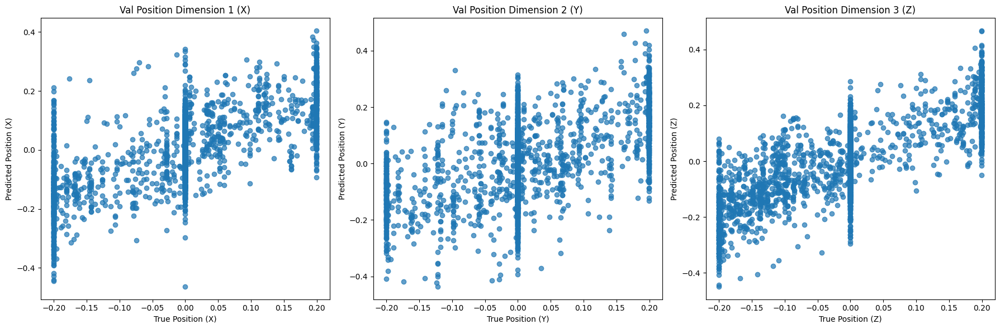

Training Precision: 0.5962, Recall: 0.4644, F1 Score: 0.5139
Validation Precision: 0.7665, Recall: 0.6587, F1 Score: 0.6951


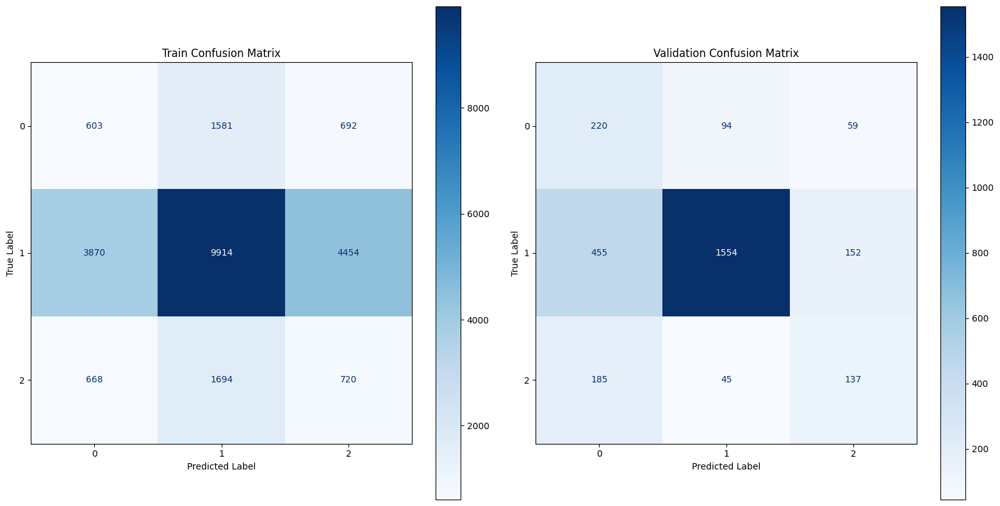

In [ ]:
evaluate_model_position(train_pos_labels,val_pos_labels,train_pos_preds,val_pos_preds,visualize=True)
evaluate_model_gripper(train_grp_labels,val_grp_labels,train_grp_preds,val_grp_preds,visualize=True)

#### Experiment 3 discussion

##### Description

For my third experiment, I experimented with increasing the complexity of the network in multiple ways. I tested three different levels of complexity, labeled in the WANDB screenshot below as L1,L2,L3, with each level corresponding to additional network complexity. For L1, I doubled the hidden size of each convolutional layer. For L2, I added additional hidden layers in the image encoder and the final MLP on top of L1. For L3, I added two new convolutional layers on top of L1 and L2. Due to time constraints, I was not able to test additional combinations of network sizes. Please see the Appendix for code used to generate experiment #3.

##### Justification

The motivation behind this experiment was to improve the model's ability to learn from the training data. As seen in the evaluation of my baseline model, my model is strangely performing well on my validation set despite very poor performance on the training set. I wanted to increase model complexity in order to improve the training performance which may then increase the validation performance. There is a tradeoff between model complexity and overfitting, which can harm validation accuracy. However, I am less concerned about this side effect seeing as I am adding dropout to my final improved model to address overfitting.

##### Conclusion

I found that adding complexity improved the performance of my model. The L1 complexity significantly decreased my validation loss from around 0.65 at epoch 10 to around 0.2 at epoch 10, while also decreasing my training loss. The L2 complexity (additional hidden layers in the MLPs) still improved upon the baseline but slightly less so than the increase in the convolutional complexity. The L3 complexity, with the addition of two new convolutional layers, had the biggest increase in performance, taking the final validation loss to below 0.2. I did however find that the L3 complexity had a more unstable loss curve with larger oscillations over the epochs. Therefore, in my final model, I continued to test new iterations of complexity with all of improvements added to the model to balance performance with stability and generalizaiton.

In regards to the training fit issue, I am still seeing a poor training fit (the added complexity of the model actually decreased the training R2 and RMSE). I am unable to explain this phenomenon. However, seeing as the validation loss/metrics have continued to improve, I am confident that my experiments are helping me improve my model.

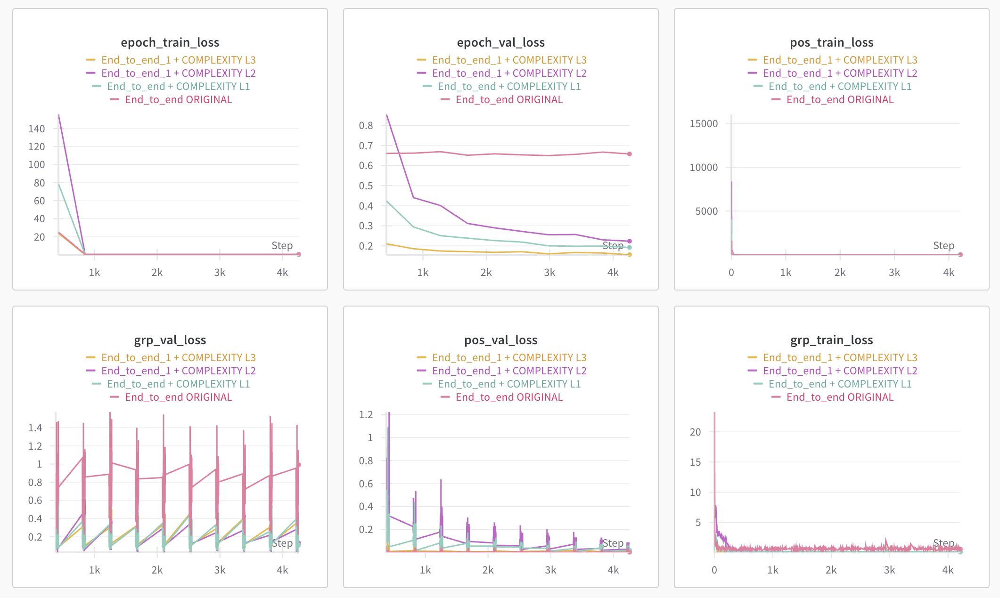

In [ ]:
# Experiment 3 Run (WANDB)
image_path = '/content/drive/MyDrive/comp0188_2425/cw2/wandb/exp3_run.png'
display(Image(filename=image_path, width=1600))

In [ ]:
# Plot predictions vs true values

# Get Predicted Values
train_pos_preds = pd.read_csv('/content/drive/MyDrive/comp0188_2425/cw2/predictions/exp3/epoch_10_train_preds_pos.csv',header=None)
train_grp_preds = pd.read_csv('/content/drive/MyDrive/comp0188_2425/cw2/predictions/exp3/epoch_10_train_preds_grp.csv',header=None)
val_pos_preds = pd.read_csv('/content/drive/MyDrive/comp0188_2425/cw2/predictions/exp3/epoch_10_val_preds_pos.csv',header=None)
val_grp_preds = pd.read_csv('/content/drive/MyDrive/comp0188_2425/cw2/predictions/exp3/epoch_10_val_preds_grp.csv',header=None)

,Dimension 1,Dimension 2,Dimension 3
Metric,,,
Training R2,-1.093647,-1.238479,-1.253655
Validation R2,0.631844,0.396090,0.535461
Training RMSE,0.162370,0.152179,0.177359
Validation RMSE,0.068390,0.075147,0.077897
Training MAE,0.127187,0.119314,0.141124
Validation MAE,0.053554,0.059371,0.060055


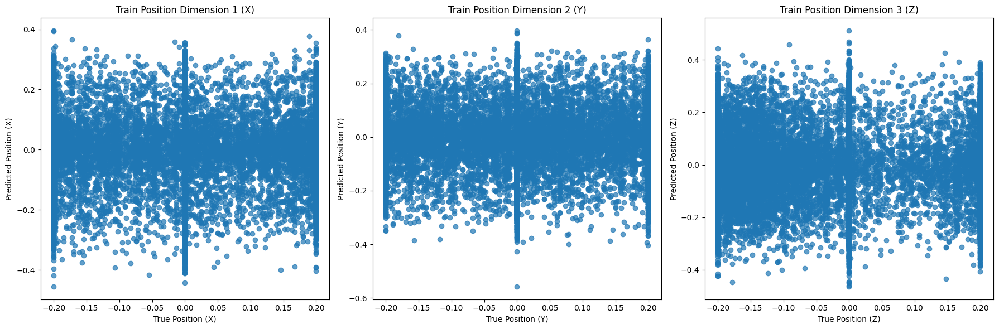

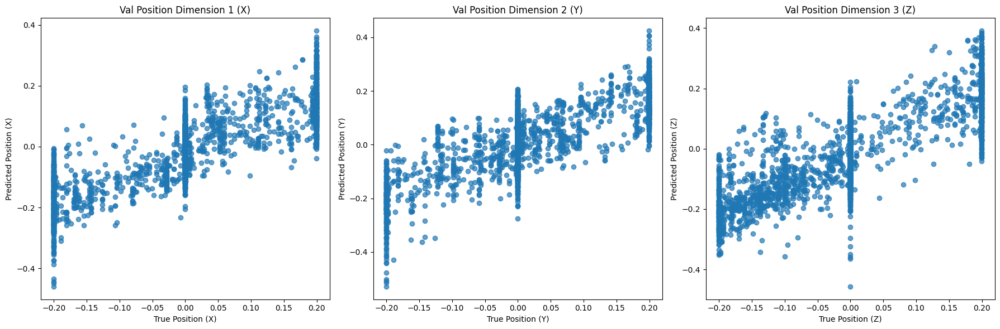

Training Precision: 0.5966, Recall: 0.4583, F1 Score: 0.5096
Validation Precision: 0.7789, Recall: 0.6794, F1 Score: 0.7132


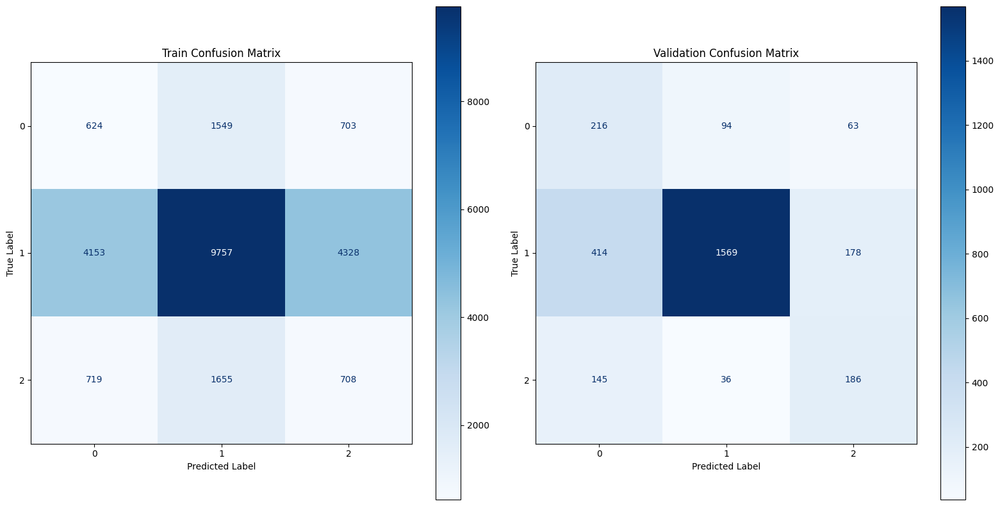

In [ ]:
evaluate_model_position(train_pos_labels,val_pos_labels,train_pos_preds,val_pos_preds,visualize=True)
evaluate_model_gripper(train_grp_labels,val_grp_labels,train_grp_preds,val_grp_preds,visualize=True)

# Task 2: Self-supervised pretraining with VAEs

### Self-supervised VAE model

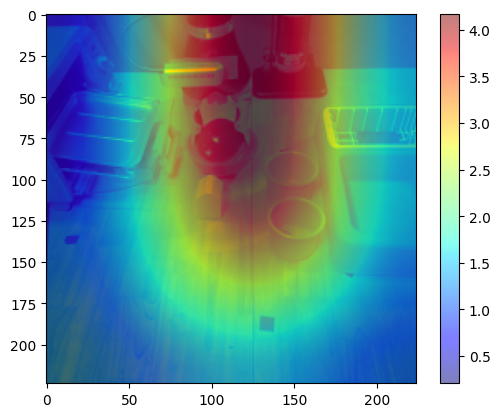

In [ ]:
# Create Spatial Attention Mask

def create_soft_attention_mask(x1, y1, x2, y2, outside_weight=0.1, inside_weight=5.0,blur_radius=40):
    """
    Create a spatial soft attention mask with weights inside and outside a bounding box for a 224x224 image.
    """
    H,W = 224, 224
    mask = torch.full((H, W), outside_weight)

    # Fill the bounding box area with inside weight
    mask[y1:y2, x1:x2] = inside_weight

    # Create a blurred region around the bounding box edges
    mask_np = mask.numpy()
    blurred_mask = gaussian_filter(mask_np, sigma=blur_radius)

    # Combine the blurred mask with the original mask for a smooth transition at edges
    mask = torch.from_numpy(blurred_mask)

    return mask

# Bounding box coordinates (selected manually by visually inspecting the image)
x1, y1, x2, y2 = 70, 0, 180, 180

# Create the attention mask
mask = create_soft_attention_mask(x1, y1, x2, y2)

# Plot a sample image with the bounding box overlayed
image = train_nps['front_cam_ob'][0]
plt.imshow(image)
plt.imshow(mask, alpha=0.5, cmap='jet')
plt.colorbar()
plt.show()

In [ ]:
# Create dataloaders for VAE

def create_dataloaders(image_variable):

    image_transforms = {
        image_variable:
            transforms.Compose([
                transforms.ToTensor(),
                transforms.Lambda(lambda x: x / 255.0), # Scaling
                transforms.Normalize(mean=front_mean, std=front_std) # Standardization
                ])
    }

    vae_train_dataset = NpDictDataset(
        array_dict={k:train_nps[k].astype(np.float32) for k in train_nps},
        transform_lkp = image_transforms,
        dep_vars = [],
        indep_vars = [
            image_variable
            ]
        )

    vae_val_dataset = NpDictDataset(
        array_dict={k:val_nps[k].astype(np.float32) for k in val_nps},
        transform_lkp = image_transforms,
        dep_vars = [],
        indep_vars = [
            image_variable
            ]
        )
    out = vae_train_dataset[0]

    def vae_collate_func(input_list:List[DatasetOutput])->DatasetOutput:

        images = []

        for val in input_list:
            images.append(
                torch.concat(
                    [val.input[image_variable]],
                    dim=0
                )[None,:]
                )
        return DatasetOutput(
            input = {
                "images":torch.concat(images,dim=0),
                },
            output={}
        )

    vae_train_dataloader = DataLoader(
        vae_train_dataset,
        batch_size=64,
        shuffle=True,
        collate_fn=vae_collate_func,
    )
    vae_val_dataloader = DataLoader(
        vae_val_dataset,
        batch_size=64,
        shuffle=False,
        collate_fn=vae_collate_func,
    )

    return vae_train_dataloader, vae_val_dataloader


vae_train_dataloader_front, vae_val_dataloader_front = create_dataloaders('front_cam_ob')
vae_train_dataloader_mount, vae_val_dataloader_mount = create_dataloaders('mount_cam_ob')

first_batch = next(vae_train_dataloader_front.__iter__())
first_batch_input_dim = first_batch.input["images"].shape
print(first_batch_input_dim)

first_batch = next(vae_train_dataloader_mount.__iter__())
first_batch_input_dim = first_batch.input["images"].shape
print(first_batch_input_dim)

torch.Size([64, 1, 224, 224])
torch.Size([64, 1, 224, 224])


In [ ]:
# Construct Convolutional VAE

# Set device
device = 'cuda' if torch.cuda.is_available() else 'cpu'  # Use cuda if available

# Define model architecture
class VAE(nn.Module):
    def __init__(self, latent_dim):
        super(VAE, self).__init__()

        self.latent_dim = latent_dim

        self.encoder = nn.Sequential(
            nn.Conv2d(1, 16, 3, 1, 1),
            nn.LeakyReLU(),
            nn.MaxPool2d(2),  # 112x112
            nn.Conv2d(16, 32, 3, 1, 1),
            nn.LeakyReLU(),
            nn.MaxPool2d(2),  # 56x56
            nn.Conv2d(32, 64, 3, 1, 1),
            nn.LeakyReLU(),
            nn.Flatten(),
        )

        self.encoder_output_size = 56 * 56 * 64

        self.linear_mu = nn.Linear(self.encoder_output_size, self.latent_dim)
        self.linear_logvar = nn.Linear(self.encoder_output_size, self.latent_dim)
        self.linear_up = nn.Linear(self.latent_dim, self.encoder_output_size)

        self.decoder = nn.Sequential(
            nn.Conv2d(64, 32, 3, 1, 1),
            nn.LeakyReLU(),
            nn.Upsample(scale_factor=2),  # 112x112
            nn.Conv2d(32, 16, 3, 1, 1),
            nn.LeakyReLU(),
            nn.Upsample(scale_factor=2),  # 224x224
            nn.Conv2d(16, 1, 3, 1, 1),
        )

    def encode(self, x):
        x = self.encoder(x)
        mu = self.linear_mu(x)
        logvar = self.linear_logvar(x)
        return mu, logvar

    def reparametrize(self, mu, logvar):
        std = torch.exp(0.5*logvar)
        epsilon = torch.randn(std.size())
        epsilon = epsilon.to(device)
        return (mu + std*epsilon)

    def decode(self, z):
        z = self.linear_up(z)
        z = z.view(-1, 64, 56, 56)
        z = self.decoder(z)
        z = z.reshape(-1, 224*224)
        return z


    def forward(self, x, mask=None):
        if mask is not None:
          x = x * mask.unsqueeze(0)
        mu, logvar = self.encode(x)
        z = self.reparametrize(mu, logvar)
        return mu, logvar, self.decode(z)

latent_dim = 128
model = VAE(latent_dim).to(device)
summary(model, (1, 224, 224))

params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print("Total number of parameters is: {}".format(params))
print(model)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 16, 224, 224]             160
         LeakyReLU-2         [-1, 16, 224, 224]               0
         MaxPool2d-3         [-1, 16, 112, 112]               0
            Conv2d-4         [-1, 32, 112, 112]           4,640
         LeakyReLU-5         [-1, 32, 112, 112]               0
         MaxPool2d-6           [-1, 32, 56, 56]               0
            Conv2d-7           [-1, 64, 56, 56]          18,496
         LeakyReLU-8           [-1, 64, 56, 56]               0
           Flatten-9               [-1, 200704]               0
           Linear-10                  [-1, 128]      25,690,240
           Linear-11                  [-1, 128]      25,690,240
           Linear-12               [-1, 200704]      25,890,816
           Conv2d-13           [-1, 32, 56, 56]          18,464
        LeakyReLU-14           [-1, 32,

In [ ]:
def loss_function_VAE(recon_x, x, mu, logvar, beta, mask=None):

  if mask is not None:
    mask = mask.unsqueeze(0).expand(x.size(0), -1, -1)  # [batch_size, 224, 224]
    mask = mask.view(x.size(0), -1)  # Flatten mask
    x = x * mask  # Apply mask to input
    recon_x = recon_x * mask  # Apply mask to reconstruction
  recon_loss = F.mse_loss(recon_x, x, reduction='mean')
  KL_divergence = 0.5*torch.sum(1+logvar-mu**2-torch.exp(logvar))

  return recon_loss, -beta*KL_divergence

### Model Convergence Discussion

I decided to train three different VAEs: one for the front camera observations, one for the mount camera observations, and one for the front camera observations with a spatial attention mask. Although I could train a single VAE on both image types, since they are of the same subject and therefore come from roughly the same distribution, I decided against it based on the very large visual differences that the difference of angles introduces (I also experimented and trained a single VAE that encoded both, but found decreased performance). Therefore, I decided to train a separate VAE for each image type. As discussed below, I found that the VAE was excluding information I deemed important to the downstream task, and so I trained a third and final VAE that used a spatial attention mask to "pay more attention" to the objects and robot arm in the images.

In my experiments, I found that the KL Divergence loss was very close to zero for all three VAEs across all epochs. The extremely low KL Divergence loss raises concerns over whether my VAE is balancing reconstruction and regularization properly. The fact that my KL divergence is so low, close to zero, means that the posterior is almost identically matching the prior, meaning my latent space is probably not capturing meaningful features. Additionally, after visualizing samples of the reconstructed images for each VAE, I also discovered that the VAEs were outputting very generic reconstructions despite variations in the input images, further confirming the fact that my latent space may be over-regularized. To address this, I introduced KL annealing where the value of Beta, which weights the KL divergence in the loss function, starts at 0 and then increases to 1 over all of the epochs. By ignoring the KL divergence in the first epoch and gradually increasing it over time, I hoped my VAE would not be overdominated by the KL term and could instead focus on minimizing reconstruction loss and encoding important features. After finding success during experimentation, I implemented this technique in all three VAEs.

To evaluate each VAE, I visualized the total loss, reconstruction loss, and KL divergence loss. I also visualizes samples of the reconstructed images. I will discuss each VAE's performance individually below.

VAE 1: Front Camera (No Mask)

The first VAE I trained appears to be performing well. The total training loss starts at 0.0021, jumps to 1.49 after the KL divergence term is introduced (which is to be expected), and then decreases again to a final training loss of 0.0013. However, the validation loss is plateaud across training and hangs around 0.007 despite a continuous decrease in total training loss. This could suggest potential overfitting, but the fact that the total validation loss is so low suggests the model is still reconstructing properly and resembling a normal distribution in the latent space. Another concern is that the KL divergence loss stays close to zero beyond the jump after it is originally introduced. As mentioned above, this may be evidence of posterior collapse. Ideally, we would hope to see the KL divergence increase from a low initial valuea and then stabilize.

After visualizing the reconstructions, I was able to see the images are being reconstructed with clarity, but there are generic outputs with the objects and robot arms removed from the images. However, the latent space may still be informative for my downstream model despite the poor reconstruction quality.

VAE 2: Front Camera (Mask)

The second VAE I trained took in the front images as inputs and also applied a spatial attention mask. After visualizing samples from my first VAE, I realized the reconstructed image was sharp but that it had removed all of the information regarding the objects in the image and the robot arm. This is concerning for my downstream task seeing as these are the parts of the image that are likely needed in prediction. Therefore, I created a bounding box which I believed captured the relevant parts of the image based on manual inspection and assigned them a higher weight. I also applied a Gaussian blur to soften the edges of this bounding box. The mask was then applied to the input and incorporated into the loss calculation.

The addition of the spatial attention mask caused a drop in performance. The total training loss started at a higher value than my first VAE at 4.97, jumped to 117.53 as the KL divergence term was introduced, and then eventually decreased to 0.067. The validation loss was unstable throughout training,starting at 0.0069 but ended at 4.235. It was interesting to note that there was more range in the KL divergence loss throughout training compared to the first VAE, suggesting there may be less posterior collapse with the spatial attention mask applied. However, the combined higher loss values and the decreased quality in the visualized reconstructions suggested that the first VAE without the spatial attention mask would be better suited for the downstream task.

With additional time, I would have liked to continue to test different constructions of spatial attention masks or different techniques such as a guided attention mechanism to enforce better encoding of the images.

VAE 3: Mount Camera (Mask)

The third VAE took in only the mount images as inputs. This VAE did not perform very well seeing as the test and train loss increase over epochs and never converge, with the test loss remaining above the training loss. The KL Divergence loss also does not increase/stabilize over time meaning the latent space is not encoding features properly. Additionally, I visualized reconstructions and upon inspection could see that the VAE was not functioning effectively due to the generic and blurry reconstructions.

Unfortunately due to time constraints, I was not able to test/tune my VAEs further. With additional time, I would have liked to address the potential overfitting by adding data augmentation or dropout. I would also have liked to do further experimentation with the spatial attention to design a more robust approach to force the VAE to recognize the objects and robot arm position. Based on the final test loss and reconstruction quality, I will proceed with the first front camera VAE in the final model.



In [ ]:
# Training function

def train_vae(loader_train,loader_test,latent_dim,lr,beta_start,beta_end,num_epochs,mask=None):

    model = VAE(latent_dim).to(device)

    # optimizer
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    # cosine annealing scheduler
    scheduler = CosineAnnealingLR(optimizer, T_max=num_epochs)

    train_reconstruction_losses = []
    train_KL_losses = []
    train_tot_losses = []

    test_reconstruction_losses = []
    test_KL_losses = []
    test_tot_losses = []

    # KL annealing schedule
    def kl_annealing(epoch, num_epochs, beta_start, beta_end):
        return beta_start + (beta_end - beta_start) * (epoch / (num_epochs - 1))

    # Convolutional implementation training
    for epoch in range(num_epochs):

            # Update beta for KL annealing
            beta = kl_annealing(epoch, num_epochs, beta_start, beta_end)

            # Train
            epoch_reconstruction_loss = 0
            epoch_KL_loss = 0
            epoch_tot_loss = 0

            for batch_idx, batch in enumerate(loader_train):

                optimizer.zero_grad()
                x = batch.input["images"].to(device)
                if mask is not None:
                  mask = mask.to(device)
                mu, logvar, recon_x = model(x, mask=mask)

                reconstruction_loss, KL_loss = loss_function_VAE(recon_x, x.reshape(-1,224*224), mu, logvar, beta, mask=mask)
                tot_loss = reconstruction_loss + KL_loss

                tot_loss.backward()
                optimizer.step()

                epoch_reconstruction_loss += reconstruction_loss.item()
                epoch_KL_loss += KL_loss.item()
                epoch_tot_loss += tot_loss.item()

            train_reconstruction_losses.append(epoch_reconstruction_loss/len(loader_train.dataset))
            train_KL_losses.append(epoch_KL_loss/len(loader_train.dataset))
            train_tot_losses.append(epoch_tot_loss/len(loader_train.dataset))

            print("Epoch: %d, train loss = %.4f" % (epoch+1, train_tot_losses[-1]))
            if epoch+1 in [5,10]:
              print("-- Epoch: %d, train KL loss = %.4f" % (epoch+1, train_KL_losses[-1]))
              print("-- Epoch: %d, train rec loss = %.4f" % (epoch+1, train_reconstruction_losses[-1]))

            # Test
            test_reconstruction_loss = 0
            test_KL_loss = 0
            test_tot_loss = 0


            with torch.no_grad():
                for batch in loader_test:
                    x_test = batch.input["images"].to(device)
                    mu_test, logvar_test, recon_x_test = model(x_test)
                    x_test_flat = x_test.reshape(-1, 224*224)
                    recon_x_test_flat = recon_x_test.reshape(-1, 224*224)
                    reconstruction_loss, KL_loss = loss_function_VAE(
                        recon_x_test_flat, x_test_flat, mu_test, logvar_test, beta
                    )
                    test_loss = reconstruction_loss + KL_loss

                    test_reconstruction_loss += reconstruction_loss.item()
                    test_KL_loss += KL_loss.item()
                    test_tot_loss += test_loss.item()

            test_tot_losses.append(test_tot_loss / len(loader_test.dataset))
            test_reconstruction_losses.append(test_reconstruction_loss / len(loader_test.dataset))
            test_KL_losses.append(test_KL_loss / len(loader_test.dataset))

            print("Epoch: %d, test loss = %.4f" % (epoch+1, test_tot_losses[-1]))
            if epoch+1 in [5,10]:
              print("-- Epoch: %d, test KL loss = %.4f" % (epoch+1, test_KL_losses[-1]))
              print("-- Epoch: %d, test rec loss = %.4f" % (epoch+1, test_reconstruction_losses[-1]))

            scheduler.step()

    return model, train_tot_losses, test_tot_losses, train_reconstruction_losses, test_reconstruction_losses, train_KL_losses, test_KL_losses

Epoch: 1, train loss = 0.0021
Epoch: 1, test loss = 0.0011
Epoch: 2, train loss = 1.4905
Epoch: 2, test loss = 0.0076
Epoch: 3, train loss = 0.0073
Epoch: 3, test loss = 0.0069
Epoch: 4, train loss = 0.0062
Epoch: 4, test loss = 0.0073
Epoch: 5, train loss = 0.0062
-- Epoch: 5, train KL loss = 0.0027
-- Epoch: 5, train rec loss = 0.0035
Epoch: 5, test loss = 0.0070
-- Epoch: 5, test KL loss = 0.0035
-- Epoch: 5, test rec loss = 0.0035
Epoch: 6, train loss = 0.0057
Epoch: 6, test loss = 0.0078
Epoch: 7, train loss = 0.0053
Epoch: 7, test loss = 0.0075
Epoch: 8, train loss = 0.0051
Epoch: 8, test loss = 0.0075
Epoch: 9, train loss = 0.0049
Epoch: 9, test loss = 0.0076
Epoch: 10, train loss = 0.0048
-- Epoch: 10, train KL loss = 0.0013
-- Epoch: 10, train rec loss = 0.0034
Epoch: 10, test loss = 0.0078
-- Epoch: 10, test KL loss = 0.0044
-- Epoch: 10, test rec loss = 0.0035


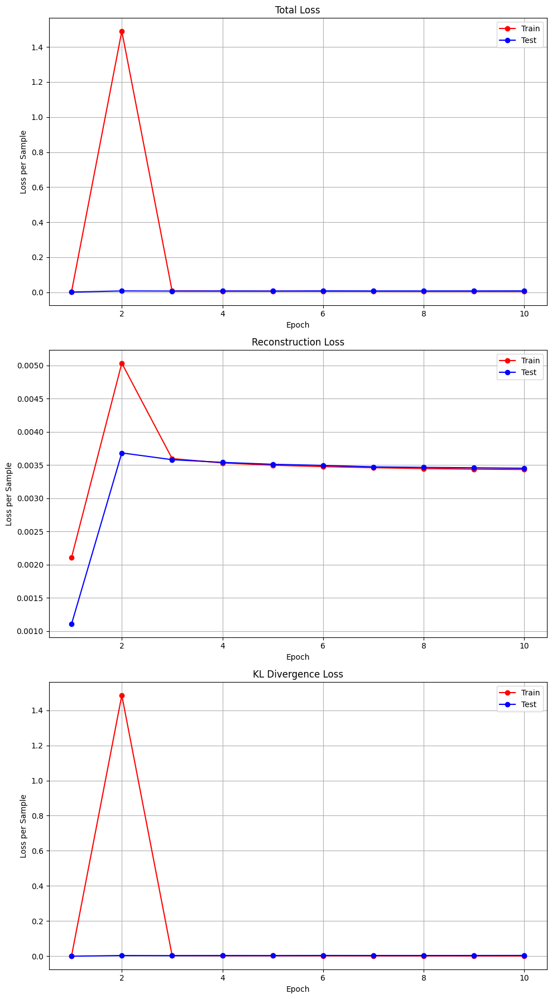

In [ ]:
# Front VAE no mask

num_epochs = 10

front_vae, train_tot_losses, test_tot_losses, train_reconstruction_losses, test_reconstruction_losses, train_KL_losses, test_KL_losses = train_vae(loader_train=vae_train_dataloader_front
                                                                                                                                               ,loader_test=vae_val_dataloader_front
                                                                                                                                               ,latent_dim=128,
                                                                                                                                               lr=0.001
                                                                                                                                               ,beta_start=0.0
                                                                                                                                               ,beta_end=1.0
                                                                                                                                               ,num_epochs=num_epochs
                                                                                                                                               ,mask=None)

epochs = range(1, num_epochs + 1)

fig, axs = plt.subplots(3, 1, figsize=(10, 18))

# Total Loss
axs[0].plot(epochs, train_tot_losses, "-ro", label="Train")
axs[0].plot(epochs, test_tot_losses, "-bo", label="Test")
axs[0].set_title("Total Loss")
axs[0].set_xlabel('Epoch')
axs[0].set_ylabel('Loss per Sample')
axs[0].legend()
axs[0].grid(True)

# Reconstruction Loss
axs[1].plot(epochs, train_reconstruction_losses, "-ro", label="Train")
axs[1].plot(epochs, test_reconstruction_losses, "-bo", label="Test")
axs[1].set_title("Reconstruction Loss")
axs[1].set_xlabel('Epoch')
axs[1].set_ylabel('Loss per Sample')
axs[1].legend()
axs[1].grid(True)

# KL Divergence Loss
axs[2].plot(epochs, train_KL_losses, "-ro", label="Train")
axs[2].plot(epochs, test_KL_losses, "-bo", label="Test")
axs[2].set_title("KL Divergence Loss")
axs[2].set_xlabel('Epoch')
axs[2].set_ylabel('Loss per Sample')
axs[2].legend()
axs[2].grid(True)

plt.tight_layout()
plt.show()


In [ ]:
def visualize_reconstructions(model, dataloader, device, num_samples=5, save_path=None):
    """
    Visualize samples of original and reconstructed images from a VAE.
    """
    model.eval()

    # Collect all images and reconstructions
    all_original_images = []
    all_reconstructed_images = []

    with torch.no_grad():
        for batch in dataloader:
            x = batch.input["images"].to(device)

            # Run the VAE
            mu, logvar, recon_x = model(x)

            # Reshape reconstructions back to image shape
            recon_x = recon_x.view(x.size(0), 1, 224, 224)

            # Move to CPU for storage
            all_original_images.append(x.cpu())
            all_reconstructed_images.append(recon_x.cpu())

    # Concatenate all images
    all_original_images = torch.cat(all_original_images)
    all_reconstructed_images = torch.cat(all_reconstructed_images)

    # Shuffle images
    shuffle_idx = torch.randperm(len(all_original_images))
    original_images = all_original_images[shuffle_idx]
    reconstructed_images = all_reconstructed_images[shuffle_idx]

    # Plot samples
    fig, axes = plt.subplots(num_samples, 2, figsize=(10, 2*num_samples))

    for i in range(num_samples):
        # Original image
        orig_img = original_images[i].squeeze().numpy()
        axes[i, 0].imshow(orig_img, cmap='gray')
        axes[i, 0].set_title(f'Original Image {i+1}')
        axes[i, 0].axis('off')

        # Reconstructed image
        recon_img = reconstructed_images[i].squeeze().numpy()
        axes[i, 1].imshow(recon_img, cmap='gray')
        axes[i, 1].set_title(f'Reconstructed Image {i+1}')
        axes[i, 1].axis('off')

    plt.tight_layout()

    if save_path:
        plt.savefig(save_path)

    plt.show()

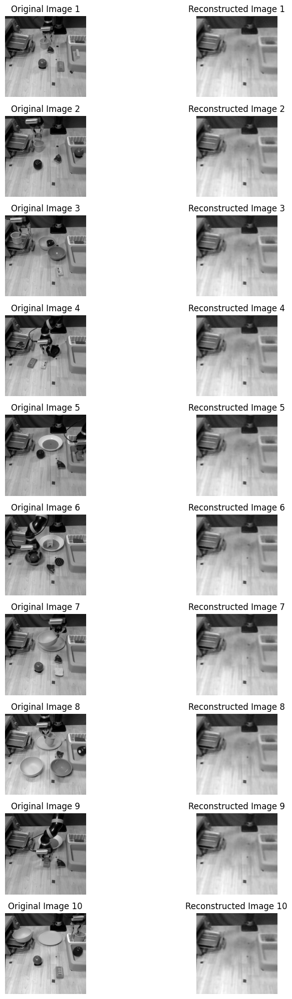

In [ ]:
# Visualize reconstructions

visualize_reconstructions(
    front_vae,
    vae_val_dataloader_front,
    device,
    num_samples=10
)

Epoch: 1, train loss = 4.9674
Epoch: 1, test loss = 0.0069
Epoch: 2, train loss = 117.5270
Epoch: 2, test loss = 4.9442
Epoch: 3, train loss = 0.1667
Epoch: 3, test loss = 6.0629
Epoch: 4, train loss = 0.6484
Epoch: 4, test loss = 2.6499
Epoch: 5, train loss = 0.0927
-- Epoch: 5, train KL loss = 0.0309
-- Epoch: 5, train rec loss = 0.0617
Epoch: 5, test loss = 2.8934
-- Epoch: 5, test KL loss = 2.8858
-- Epoch: 5, test rec loss = 0.0075
Epoch: 6, train loss = 0.0834
Epoch: 6, test loss = 3.0831
Epoch: 7, train loss = 0.0766
Epoch: 7, test loss = 3.2854
Epoch: 8, train loss = 0.0709
Epoch: 8, test loss = 3.5736
Epoch: 9, train loss = 0.0676
Epoch: 9, test loss = 3.8071
Epoch: 10, train loss = 0.0667
-- Epoch: 10, train KL loss = 0.0218
-- Epoch: 10, train rec loss = 0.0449
Epoch: 10, test loss = 4.2350
-- Epoch: 10, test KL loss = 4.2296
-- Epoch: 10, test rec loss = 0.0054


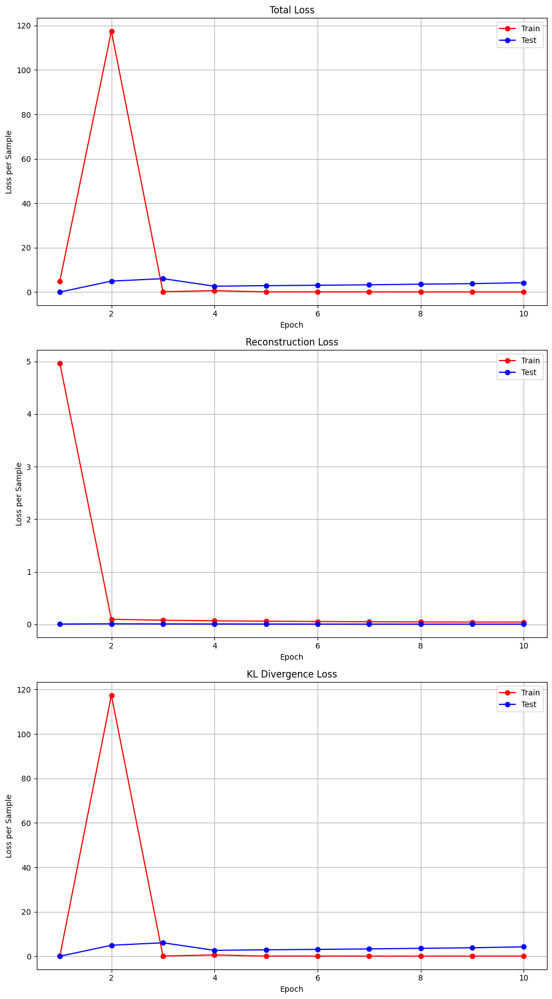

In [ ]:
# Front VAE with mask

num_epochs = 10

front_vae_masked, train_tot_losses, test_tot_losses, train_reconstruction_losses, test_reconstruction_losses, train_KL_losses, test_KL_losses = train_vae(loader_train=vae_train_dataloader_front
                                                                                                                                               ,loader_test=vae_val_dataloader_front
                                                                                                                                               ,latent_dim=128,
                                                                                                                                               lr=0.001
                                                                                                                                               ,beta_start=0.0
                                                                                                                                               ,beta_end=1.0
                                                                                                                                               ,num_epochs=num_epochs
                                                                                                                                               ,mask=mask)

epochs = range(1, num_epochs + 1)

fig, axs = plt.subplots(3, 1, figsize=(10, 18))

# Total Loss
axs[0].plot(epochs, train_tot_losses, "-ro", label="Train")
axs[0].plot(epochs, test_tot_losses, "-bo", label="Test")
axs[0].set_title("Total Loss")
axs[0].set_xlabel('Epoch')
axs[0].set_ylabel('Loss per Sample')
axs[0].legend()
axs[0].grid(True)

# Reconstruction Loss
axs[1].plot(epochs, train_reconstruction_losses, "-ro", label="Train")
axs[1].plot(epochs, test_reconstruction_losses, "-bo", label="Test")
axs[1].set_title("Reconstruction Loss")
axs[1].set_xlabel('Epoch')
axs[1].set_ylabel('Loss per Sample')
axs[1].legend()
axs[1].grid(True)

# KL Divergence Loss
axs[2].plot(epochs, train_KL_losses, "-ro", label="Train")
axs[2].plot(epochs, test_KL_losses, "-bo", label="Test")
axs[2].set_title("KL Divergence Loss")
axs[2].set_xlabel('Epoch')
axs[2].set_ylabel('Loss per Sample')
axs[2].legend()
axs[2].grid(True)

plt.tight_layout()
plt.show()


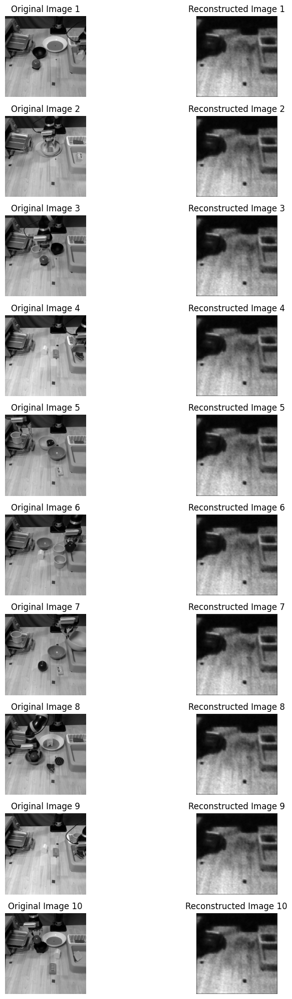

In [ ]:
# Visualize sample images and reconstructions

visualize_reconstructions(
    front_vae_masked,
    vae_val_dataloader_front,
    device,
    num_samples=10
)

Epoch: 1, train loss = 0.0026
Epoch: 1, test loss = 0.0014
Epoch: 2, train loss = 0.5004
Epoch: 2, test loss = 0.0122
Epoch: 3, train loss = 0.0124
Epoch: 3, test loss = 0.0134
Epoch: 4, train loss = 0.0210
Epoch: 4, test loss = 0.0110
Epoch: 5, train loss = 0.0109
-- Epoch: 5, train KL loss = 0.0013
-- Epoch: 5, train rec loss = 0.0096
Epoch: 5, test loss = 0.0117
-- Epoch: 5, test KL loss = 0.0016
-- Epoch: 5, test rec loss = 0.0101
Epoch: 6, train loss = 0.0123
Epoch: 6, test loss = 0.0118
Epoch: 7, train loss = 0.0105
Epoch: 7, test loss = 0.0125
Epoch: 8, train loss = 0.0103
Epoch: 8, test loss = 0.0109
Epoch: 9, train loss = 0.0102
Epoch: 9, test loss = 0.0108
Epoch: 10, train loss = 0.0101
-- Epoch: 10, train KL loss = 0.0006
-- Epoch: 10, train rec loss = 0.0095
Epoch: 10, test loss = 0.0108
-- Epoch: 10, test KL loss = 0.0008
-- Epoch: 10, test rec loss = 0.0100


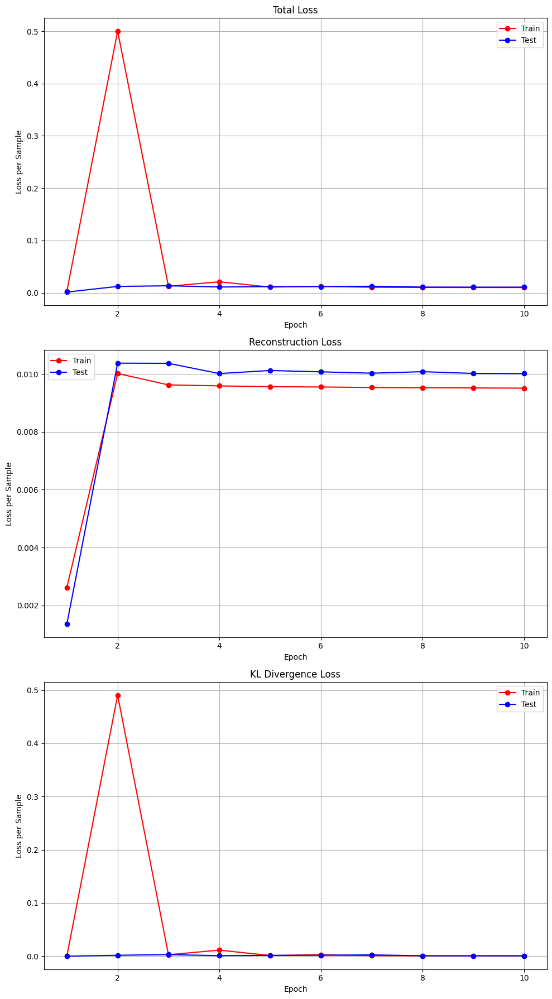

In [ ]:
# Mount VAE
num_epochs = 10

mount_vae, train_tot_losses, test_tot_losses, train_reconstruction_losses, test_reconstruction_losses, train_KL_losses, test_KL_losses = train_vae(loader_train=vae_train_dataloader_mount
                                                                                                                                                   ,loader_test=vae_val_dataloader_mount
                                                                                                                                                   ,latent_dim=128
                                                                                                                                                   ,lr=0.001
                                                                                                                                                   ,beta_start=0.0
                                                                                                                                                   ,beta_end=1.0
                                                                                                                                                   ,num_epochs=num_epochs)

epochs = range(1, num_epochs + 1)

fig, axs = plt.subplots(3, 1, figsize=(10, 18))

# Total Loss
axs[0].plot(epochs, train_tot_losses, "-ro", label="Train")
axs[0].plot(epochs, test_tot_losses, "-bo", label="Test")
axs[0].set_title("Total Loss")
axs[0].set_xlabel('Epoch')
axs[0].set_ylabel('Loss per Sample')
axs[0].legend()
axs[0].grid(True)

# Reconstruction Loss
axs[1].plot(epochs, train_reconstruction_losses, "-ro", label="Train")
axs[1].plot(epochs, test_reconstruction_losses, "-bo", label="Test")
axs[1].set_title("Reconstruction Loss")
axs[1].set_xlabel('Epoch')
axs[1].set_ylabel('Loss per Sample')
axs[1].legend()
axs[1].grid(True)

# KL Divergence Loss
axs[2].plot(epochs, train_KL_losses, "-ro", label="Train")
axs[2].plot(epochs, test_KL_losses, "-bo", label="Test")
axs[2].set_title("KL Divergence Loss")
axs[2].set_xlabel('Epoch')
axs[2].set_ylabel('Loss per Sample')
axs[2].legend()
axs[2].grid(True)

plt.tight_layout()
plt.show()


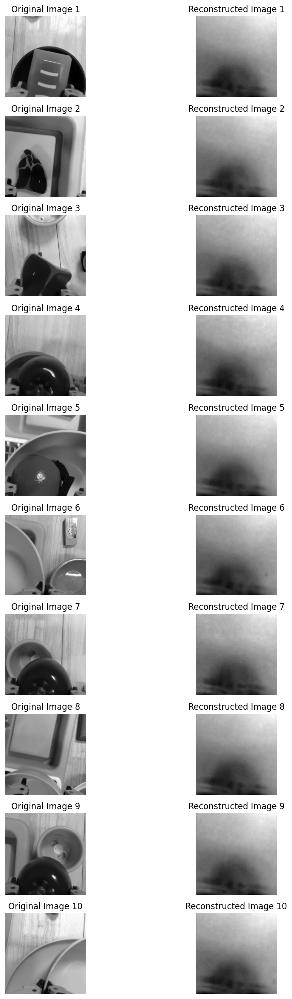

In [ ]:
# Visualize sample images and reconstructions

visualize_reconstructions(
    mount_vae,
    vae_val_dataloader_mount,
    device,
    num_samples=10
)

### Latent Space Analysis

I visualized the latent space representations using the means of the latent representations as the embedding. I will also use the means of the latent representations as the inputs to my supervised model in the following section, based on the method discussed in the research paper *BERT-Flow-VAE: A Weakly-supervised Model for Multi-Label Text Classification.* I am using mu rather than z as the latent representation because mu is a deterministic representation of the latent space for each input while z includes stochastic noise generated by the reparameterization trick.

I am using T-SNE (t-Distributed Stochastic Neighbor Embedding) which allows visualization of high-dimensional spaces in two-dimensions while preserving the structure of the original data. My T-SNE visualizations compressed the 128 latent dimensions into a 2 dimensional space for all three VAEs that I trained above. In all three visualizations, there appear to be clusters starting to form, but the representations are not clearly grouped and are largely scattered throughout the visualization. Ideally, we would want to see strong clusters forming in the T-SNE representation, which would indicate the self-supervised VAE is picking up on important distinctions in the image data.

Interestingly, the second VAE which utilized the spatial attention mask appears to have the most distinct latent space clusters of the three VAEs. This is likely because the model is paying more attention to the features which distinguish the images (the objects on the table and the robot arm), allowing the model to separate them slightly more in the latent space.

Based on the visualizations of the latent space, and the evaluation of the VAEs above, I would suspect that my self-supervised model would not be beneficial for the downstream supervised task. This is because there are not distinct clusters forming in the latent space, there is evidence of posterior collapse, and there is erasure of important image features which are necessary in the prediction task.

In [ ]:
def extract_and_visualize_latent_representations(loader_test, model, latent_dim):
    """
    Extracts latent representations from the test set and visualizes them using T-SNE.
    """
    model.eval()  # Set the model to evaluation mode
    latent_representations = []

    with torch.no_grad():
        for batch in loader_test:
            x = batch.input["images"].to(device)
            mu, _, _ = model(x)  # Extract latent means
            z = mu  # Use the mean of the latent representation as the embedding
            latent_representations.append(z.cpu())

    # Concatenate all latent representations
    latent_representations = torch.cat(latent_representations, dim=0).numpy()

    # Perform T-SNE on latent representations
    tsne = TSNE(n_components=2, random_state=42)
    tsne_results = tsne.fit_transform(latent_representations)

    # Plot the T-SNE results
    plt.figure(figsize=(10, 8))
    scatter = plt.scatter(
        tsne_results[:, 0],
        tsne_results[:, 1],
        alpha=0.7,
        edgecolor='k'
    )
    plt.colorbar(scatter)
    plt.title("T-SNE Visualization of Latent Representations")
    plt.xlabel("T-SNE Dimension 1")
    plt.ylabel("T-SNE Dimension 2")
    plt.show()

    return tsne_results

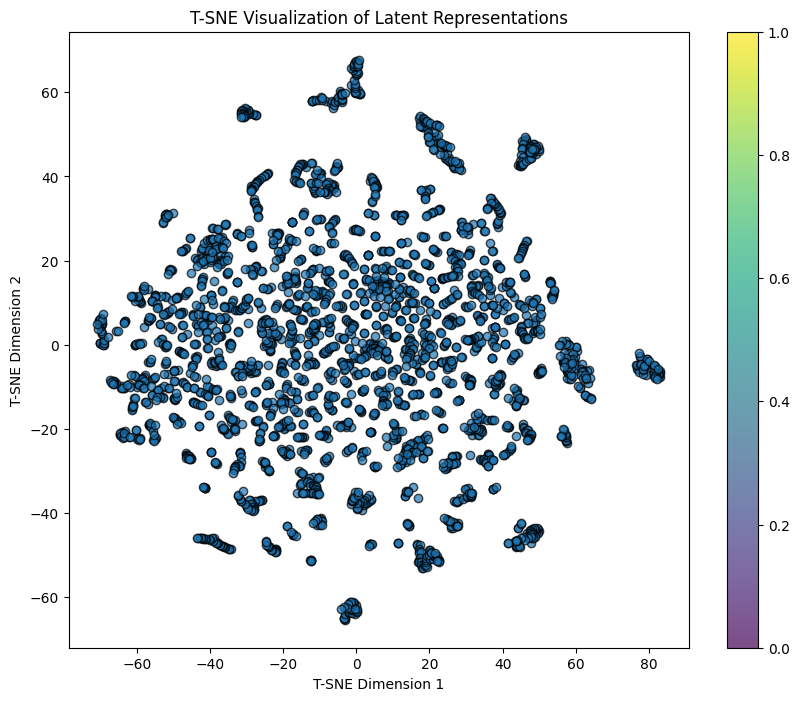

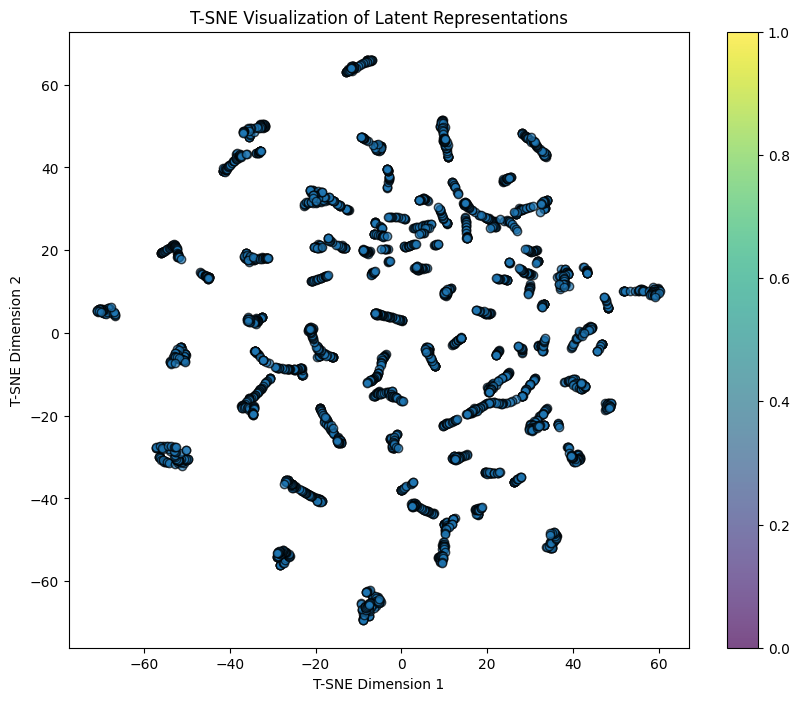

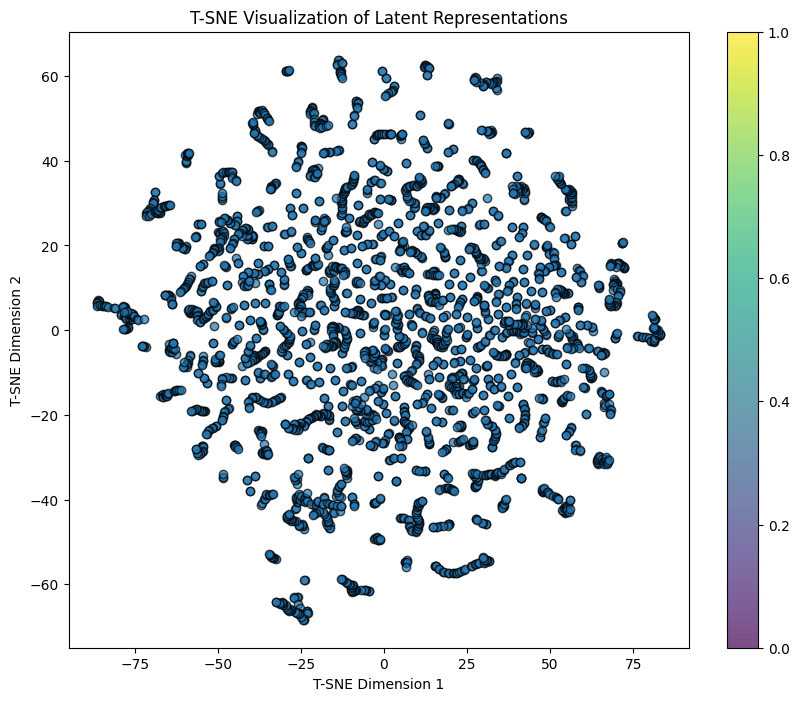

array([[-68.76816  ,  32.674236 ],
       [-68.79152  ,  32.569324 ],
       [-69.27518  ,  30.746912 ],
       ...,
       [ 67.73024  ,   6.6834073],
       [ 67.729065 ,   7.1144814],
       [ 67.65208  ,   7.367317 ]], dtype=float32)

In [ ]:
# Plot TSNE representations

latent_dim = 128

# 1. FRONT VAE
extract_and_visualize_latent_representations(vae_val_dataloader_front, front_vae, latent_dim)

# 2. FRONT VAE MASKED
extract_and_visualize_latent_representations(vae_val_dataloader_front, front_vae_masked, latent_dim)

# 3. MOUNT VAE
extract_and_visualize_latent_representations(vae_val_dataloader_mount, mount_vae, latent_dim)

### Task 3: Full Model Training
In this task, I develop a supervised head which utilises the latent space from my self-supervised method. Then I assess the models performance as well as the improved model I developed from task 1 on the test set.

### Combining self-supervised model with the downstream task

In [ ]:
# Set vae to eval
front_vae.eval()

# Redefine cross entropy loss to give weights to minority classes
class_weights = torch.tensor(class_weights,device=torch.device('cuda'))
pos_criterion = nn.MSELoss(reduction="mean")
grp_criterion = nn.CrossEntropyLoss(reduction="mean",weight=class_weights) # Add in pre-calculated weights

final_cnn2_config = ConvolutionLayersConfig(
    input_dim=224,
    input_channels=1,
    layers=[
        nn.Conv2d(
            in_channels=1,
            out_channels=16,
            kernel_size=(3,3),
            stride=1,
            padding=1,
            dilation=1
          ),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=(2,2)),
        nn.Conv2d(
            in_channels=16,
            out_channels=32,
            kernel_size=(3,3),
            stride=1,
            padding=1
          ),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=(2,2)),
        nn.Conv2d(
            in_channels=32,
            out_channels=64,
            kernel_size=(3,3),
            stride=1,
            padding=1
          ),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=(2,2)),
        nn.Conv2d(in_channels=64,
                  out_channels=128,
                  kernel_size=(3,3),
                  stride=1,
                  padding=1), # Adding a new convolutional layer
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=(2,2)),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=(2,2)),
        nn.Conv2d(in_channels=128,
                  out_channels=256,
                  kernel_size=(3,3),
                  stride=1,
                  padding=1), # Adding a new convolutional layer
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=(2,2))
       ]
   )

final_cnn_output_dim = final_cnn2_config.get_output_dims()
final_cnn_output_channels = final_cnn2_config.get_output_channels()
final_mlp_input_dim = int(
            (final_cnn_output_dim[-1]*final_cnn_output_dim[-1])*final_cnn_output_channels[-1]
            )


final_image_encoder = JointCNNEncoder(
    cnn=CNN(final_cnn2_config),
    dense=MLP(
        input_dim=final_mlp_input_dim,
        hidden_dims=[512,256],
        output_dim=128,
        dropouts=[0.3,0.3]
        )
)

final_obs_encoder = MLP(
    input_dim = 15,
    hidden_dims = [512,256],
    output_dim = 128,
    dropouts = [0.3,0.3]
)

final_dense = MLP(
    input_dim = 128,
    hidden_dims = [256, 128, 64],
    output_dim = 6,
    dropouts = [0.3,0.3,0.3]
)

class FinalModel(BaseModel):

  def __init__(
      self,
      image_encoder:JointCNNEncoder,
      obs_encoder:MLP,
      vae_encoder,
      dense:MLP
      ) -> None:
      super().__init__()
      self.image_encoder = image_encoder
      self.obs_encoder = obs_encoder
      self.vae_encoder = vae_encoder # Add in VAE
      self.dense = dense

  def forward(self, images, obs):
    front_images = images[:, 0, :, :].unsqueeze(1)
    mount_images = images[:, 1, :, :].unsqueeze(1)
    _img_enc = self.image_encoder(mount_images)
    _obs_enc = self.obs_encoder(obs)
    _vae_enc_mu , _, _ = self.vae_encoder(front_images) # Using mu as latent representation
    _dense_enc = self.dense(_img_enc+_obs_enc+_vae_enc_mu)
    pos = _dense_enc[:,0:3]
    grp = _dense_enc[:,3:]
    return {
        "pos": pos,
        "grp":grp
        }

  def reset(
      self,
      image_encoder_kwargs,
      obs_encoder_kwargs,
      dense_kwargs
      ):
    self.image_encoder.reset(**image_encoder_kwargs)
    self.obs_encoder.reset(**obs_encoder_kwargs)
    self.dense.reset(**dense_kwargs)

torch.manual_seed(5)
final_model = FinalModel(
    image_encoder=final_image_encoder,
    obs_encoder=final_obs_encoder,
    vae_encoder=front_vae, # Add in VAE
    dense=final_dense
)

torch.manual_seed(5)
final_model.reset({},{},{})
exp_kwargs = {
    "batch_size": 64,
    "learning_rate": 0.0001,
    "half_precision": True,
    "target_offset": 0
}

# Define a learning rate scheduler
scheduler = torch.optim.lr_scheduler.StepLR(
    optimizer,
    step_size=4,
    gamma=0.2
)

exp_kwargs["model_def"] = final_model.__repr__()

first_batch = next(train_dataloader.__iter__())

if exp_kwargs["half_precision"]:
    final_model = final_model.half()
optimizer = torch.optim.Adam(
    final_model.parameters(), lr=exp_kwargs["learning_rate"],
    eps=1e-04
    )

__criterion = TrackerBalancedLoss(
    loss_lkp={
        "pos":pos_criterion,
        "grp": grp_criterion
    }
    )

if exp_kwargs["half_precision"]:
    with torch.no_grad():
        if torch.cuda.is_available():
            final_model = final_model.cuda()
            with torch.autocast(device_type="cuda"):
                res = final_model(
                    images=first_batch.input["images"].cuda(),
                    obs=first_batch.input["obs"].cuda()
                    )
                first_batch.output["pos"] = first_batch.output["pos"].cuda()
                first_batch.output["grp"] = first_batch.output["grp"].cuda()
        else:
            with torch.autocast(device_type="cuda"):
                res = improved_model(
                    images=first_batch.input["images"],
                    obs=first_batch.input["obs"]
                    )
else:
    with torch.no_grad():
        if torch.cuda.is_available():
            final_model = final_model.cuda()
            res = final_model(
                images=first_batch.input["images"].cuda(),
                obs=first_batch.input["obs"].cuda()
                )
            first_batch.output["pos"] = first_batch.output["pos"].cuda()
            first_batch.output["grp"] = first_batch.output["grp"].cuda()
        else:
            res = final_model(
                images=first_batch.input["images"],
                obs=first_batch.input["obs"]
                )


<ipython-input-24-b1b24ac5c5ce>:5: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  class_weights = torch.tensor(class_weights,device=torch.device('cuda'))


In [ ]:
mo = WandBMetricOrchestrator()

train_criterion = TrackerBalancedLoss(
    loss_lkp={
        "pos":copy.deepcopy(pos_criterion),
        "grp":copy.deepcopy(grp_criterion)
    },
    name="train",
    mo=mo
    )

val_criterion = TrackerBalancedLoss(
    loss_lkp={
        "pos":copy.deepcopy(pos_criterion),
        "grp":copy.deepcopy(grp_criterion)
    },
    name="val",
    mo=mo
    )

sl_trainer = TorchTrainingLoop(
    model=final_model, gpu=True, optimizer=optimizer, criterion=train_criterion,
    val_criterion=val_criterion, epochs=10,
    logger=logger,mo=WandBMetricOrchestrator(), half_precision=exp_kwargs["half_precision"],
    preds_save_type="csv",output_dir='/content/drive/MyDrive/comp0188_2425/cw2/predictions/final',
    scheduler=scheduler
)

wandb_name = "End_to_end_1"
wandb_grp="End_to_end"

if project_options.debug:
    wandb_name = f"{wandb_name}_DEBUG"

orig = datetime.datetime.now()
sl_trainer.training_loop(
    train_loader=train_dataloader,
    val_loader=val_dataloader,
    wandb_proj=WANDB_PROJECT,
    wandb_grp=wandb_grp,
    wandb_config=exp_kwargs,
    wandb_name=wandb_name,
    reset_kwargs={
        "image_encoder_kwargs": {},
        "obs_encoder_kwargs": {},
        "dense_kwargs": {}
    }
    )
post_train = datetime.datetime.now()

INFO:cw2_logger:Running epochs: 10
INFO:cw2_logger:Running training epoch
100%|██████████| 398/398 [00:49<00:00,  8.03it/s]
INFO:cw2_logger:epoch 1	 training loss : 0.85986328125
INFO:cw2_logger:Running validation
INFO:cw2_logger:epoch 1	 validation loss : 0.1820068359375 
INFO:cw2_logger:Running training epoch
100%|██████████| 398/398 [00:49<00:00,  8.02it/s]
INFO:cw2_logger:epoch 2	 training loss : 0.490234375
INFO:cw2_logger:Running validation
INFO:cw2_logger:epoch 2	 validation loss : 0.1800537109375 
INFO:cw2_logger:Running training epoch
100%|██████████| 398/398 [00:50<00:00,  7.81it/s]
INFO:cw2_logger:epoch 3	 training loss : 0.40869140625
INFO:cw2_logger:Running validation
INFO:cw2_logger:epoch 3	 validation loss : 0.1771240234375 
INFO:cw2_logger:Running training epoch
100%|██████████| 398/398 [00:50<00:00,  7.93it/s]
INFO:cw2_logger:epoch 4	 training loss : 0.359375
INFO:cw2_logger:Running validation
INFO:cw2_logger:epoch 4	 validation loss : 0.1744384765625 
INFO:cw2_logger:

epoch_train_loss,█▄▃▃▂▂▂▁▁▁
epoch_val_loss,█▇▅▄▃▂▁▂▃▆
grp_train_loss,▇█▆█▄▄▅▆▆▇▆▇▆█▇▃▄▅▇▅▄▅▃▂▃▁▂▃▃▂▂▂▃▁▁▁▃▃▂▁
grp_val_loss,▂▄▃▃▂▃▃▂▂▃▃▄▂▂▂▂▃▃▄▂▂▄▂▃▃▃▂▃▂▂▁▃▂▂▃▄▁█▁▄
pos_train_loss,▆▆█▃▄▂▂▂▂▃▂▂▂▂▂▂▂▂▁▁▂▂▁▁▁▁▁▂▁▂▁▃▁▁▁▁▁▁▁▁
pos_val_loss,▄▆▆█▇█▃▆▃▆▄▃▂▃▅▆▃▃▇▅▅█▃▅▆▇▄▁▅▇▅▄▄▆▇█▇▄▅▃
epoch_train_loss,0.20337
epoch_val_loss,0.17761
grp_train_loss,0.11177
grp_val_loss,0.12472
pos_train_loss,0.18434


### Assessing the suitability of self-supervised learning

In [ ]:
_keys = [
    "actions","front_cam_ob",
    "mount_cam_ob","terminals",
    "ee_cartesian_pos_ob",
    "ee_cartesian_vel_ob",
    "joint_pos_ob"
    ]
test_nps = load_all_files(test_dh.loc,"test_[0-9]+.h5",keys=_keys)

100%|██████████| 5/5 [00:16<00:00,  3.21s/it]


In [ ]:
# Create test dataloader

torch.manual_seed(5)

exp_kwargs = {
    "batch_size": 64,
    "learning_rate": 0.001,
    "half_precision": True,
    "target_offset": 0
}

if project_options.debug:
    exp_kwargs["batch_size"] = 4

test_dataset = NpDictDataset(
    array_dict=test_nps,
    transform_lkp = global_transforms,
    dep_vars = ["actions"],
    indep_vars = [
        "front_cam_ob","mount_cam_ob", "ee_cartesian_pos_ob",
        "ee_cartesian_vel_ob", "joint_pos_ob"
        ],
    target_offset=exp_kwargs["target_offset"]
    )

test_dataloader = DataLoader(
    test_dataset,
    batch_size=exp_kwargs["batch_size"],
    shuffle=False,
    collate_fn=collate_func,
)

first_batch = next(test_dataloader.__iter__())

with torch.no_grad():
    if torch.cuda.is_available():
        model = model.cuda()
        with torch.autocast(device_type="cuda"):
            res = final_model(
                images=first_batch.input["images"].cuda(),
                obs=first_batch.input["obs"].cuda()
                )
            first_batch.output["pos"] = first_batch.output["pos"].cuda()
            first_batch.output["grp"] = first_batch.output["grp"].cuda()
    else:
        with torch.autocast(device_type="cuda"):
            res = final_model(
                images=first_batch.input["images"],
                obs=first_batch.input["obs"]
                )


In [ ]:
# Get Test True Values

test_labels = {"pos": [], "grp": []}
with torch.no_grad():
    for vals in test_dataloader:
        output_vals = {key: val for key, val in vals.output.items()}
        for k in output_vals.keys():
            test_labels[k].append(output_vals[k].detach().cpu())

test_labels = {k: torch.cat(test_labels[k], dim=0) for k in test_labels}

test_pos_labels = test_labels['pos']
test_grp_labels = test_labels['grp']

# Convert to numpy arrays
test_pos_labels = test_pos_labels.numpy()
test_grp_labels = test_grp_labels.numpy()

In [ ]:
# FINAL MODEL TESTING BLOCK

# Set VAE to eval
front_vae.eval()

# Run test dataloader through the final_model
final_model.eval()

# # Initialize lists to store predictions
final_pos_predictions = []
final_grp_predictions = []

# Disable wandb for testing
wandb.init(mode="disabled")

with torch.no_grad():

    if torch.cuda.is_available():
        final_model = final_model.cuda()
        for batch_idx, batch_data in enumerate(test_dataloader):
          with torch.autocast(device_type="cuda"):
              outputs = final_model(
                  images=batch_data.input["images"].cuda(),
                  obs=batch_data.input["obs"].cuda()
                  )
              final_pos_predictions.append(outputs["pos"].cpu().numpy())
              final_grp_predictions.append(outputs["grp"].cpu().numpy())
    else:

      for batch_idx, batch_data in enumerate(test_dataloader):
        with torch.autocast(device_type="cuda"):
            outputs = final_model(
                images=batch_data.input["images"],
                obs=batch_data.input["obs"]
                )
            final_pos_predictions.append(outputs["pos"].cpu().numpy())
            final_grp_predictions.append(outputs["grp"].cpu().numpy())


# Concatenate predictions into NumPy arrays
final_pos_predictions = np.concatenate(final_pos_predictions, axis=0)
final_grp_predictions = np.concatenate(final_grp_predictions, axis=0)

# Convert NumPy arrays to Pandas DataFrames
final_pos_predictions_df = pd.DataFrame(final_pos_predictions)
final_grp_predictions_df = pd.DataFrame(final_grp_predictions)

# Output to csv

final_pos_predictions_df.to_csv('/content/drive/MyDrive/comp0188_2425/cw2/predictions/test/final/pos_predictions.csv')
final_grp_predictions_df.to_csv('/content/drive/MyDrive/comp0188_2425/cw2/predictions/test/final/grp_predictions.csv')


In [ ]:
# IMPROVED MODEL TESTING BLOCK

# Run test dataloader through the improved_model
improved_model.eval()

# # Initialize lists to store predictions
improved_pos_predictions = []
improved_grp_predictions = []

with torch.no_grad():

    if torch.cuda.is_available():
        improved_model = improved_model.cuda()
        for batch_idx, batch_data in enumerate(test_dataloader):
          with torch.autocast(device_type="cuda"):
              outputs = improved_model(
                  images=batch_data.input["images"].cuda(),
                  obs=batch_data.input["obs"].cuda()
                  )
              improved_pos_predictions.append(outputs["pos"].cpu().numpy())
              improved_grp_predictions.append(outputs["grp"].cpu().numpy())
    else:

      for batch_idx, batch_data in enumerate(test_dataloader):
        with torch.autocast(device_type="cuda"):
            outputs = improved_model(
                images=batch_data.input["images"],
                obs=batch_data.input["obs"]
                )
            improved_pos_predictions.append(outputs["pos"].cpu().numpy())
            improved_grp_predictions.append(outputs["grp"].cpu().numpy())

# Concatenate predictions into NumPy arrays
improved_pos_predictions = np.concatenate(improved_pos_predictions, axis=0)
improved_grp_predictions = np.concatenate(improved_grp_predictions, axis=0)

# Convert NumPy arrays to Pandas DataFrames
improved_pos_predictions_df = pd.DataFrame(improved_pos_predictions)
improved_grp_predictions_df = pd.DataFrame(improved_grp_predictions)

# Output to csv
improved_pos_predictions_df.to_csv('/content/drive/MyDrive/comp0188_2425/cw2/predictions/test/improved/pos_predictions.csv')
improved_grp_predictions_df.to_csv('/content/drive/MyDrive/comp0188_2425/cw2/predictions/test/improved/grp_predictions.csv')

,Dimension 1,Dimension 2,Dimension 3
Metric,,,
Improved R2,0.768555,0.765137,0.875000
Final R2,0.648438,0.626953,0.778320
Improved RMSE,0.056519,0.047699,0.039154
Final RMSE,0.069641,0.060089,0.052216
Improved MAE,0.039337,0.032166,0.027634
Final MAE,0.051117,0.042999,0.038361


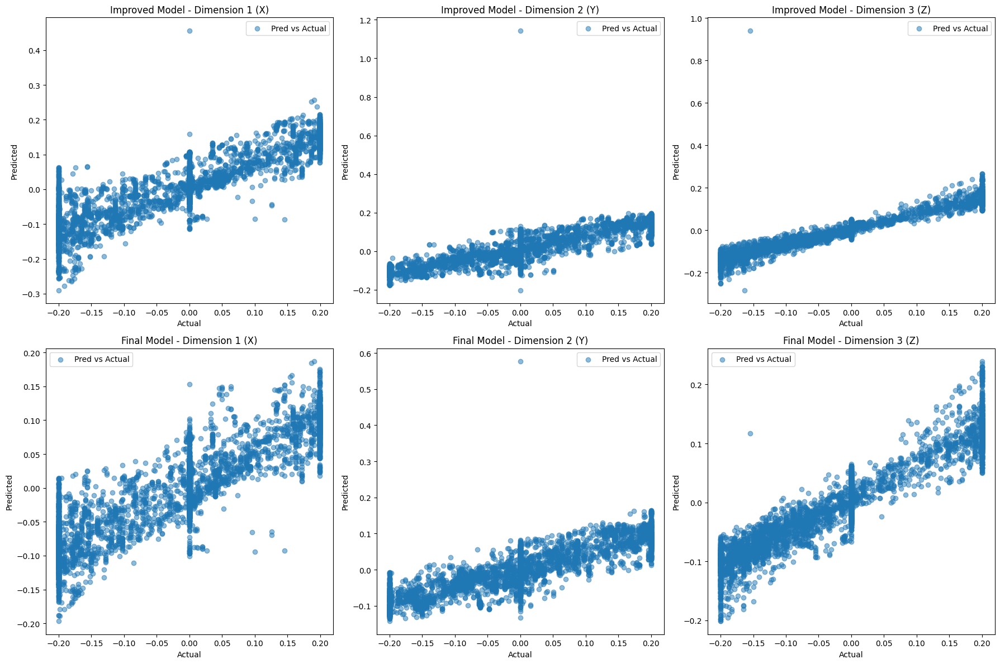

In [ ]:
# Evaluate final model

def evaluate_final_model_position(true_pos_labels, improved_pos_predictions, final_pos_predictions, visualize=True):

    # Convert labels to numpy arrays
    test_pos_labels = train_pos_labels.numpy()

        # Calculate metrics for the improved model
    improved_r2 = [r2_score(true_pos_labels[:, i], improved_pos_predictions[:, i]) for i in range(true_pos_labels.shape[1])]
    improved_rmse = np.sqrt(mean_squared_error(true_pos_labels, improved_pos_predictions, multioutput='raw_values'))
    improved_mae = mean_absolute_error(true_pos_labels, improved_pos_predictions, multioutput='raw_values')

    # Calculate metrics for the final model
    final_r2 = [r2_score(true_pos_labels[:, i], final_pos_predictions[:, i]) for i in range(true_pos_labels.shape[1])]
    final_rmse = np.sqrt(mean_squared_error(true_pos_labels, final_pos_predictions, multioutput='raw_values'))
    final_mae = mean_absolute_error(true_pos_labels, final_pos_predictions, multioutput='raw_values')

    # Print R2, RMSE, MAE for each dimension
    eval_data = {
        "Metric": ["Improved R2", "Final R2", "Improved RMSE", "Final RMSE", "Improved MAE", "Final MAE"],
        "Dimension 1": [improved_r2[0], final_r2[0], improved_rmse[0], final_rmse[0], improved_mae[0], final_mae[0]],
        "Dimension 2": [improved_r2[1], final_r2[1], improved_rmse[1], final_rmse[1], improved_mae[1], final_mae[1]],
        "Dimension 3": [improved_r2[2], final_r2[2], improved_rmse[2], final_rmse[2], improved_mae[2], final_mae[2]]
    }

    eval_df = pd.DataFrame(eval_data)
    eval_df = eval_df.set_index("Metric")
    display(eval_df)

    if visualize:
        # Plot Position Predictions vs Actuals for both models
        fig, ax = plt.subplots(2, 3, figsize=(18, 12))

        # Improved Model
        ax[0, 0].scatter(true_pos_labels[:, 0], improved_pos_predictions[:, 0], label='Pred vs Actual', alpha=0.5)
        ax[0, 0].set_title('Improved Model - Dimension 1 (X)')
        ax[0, 0].set_xlabel('Actual')
        ax[0, 0].set_ylabel('Predicted')
        ax[0, 0].legend()

        ax[0, 1].scatter(true_pos_labels[:, 1], improved_pos_predictions[:, 1], label='Pred vs Actual', alpha=0.5)
        ax[0, 1].set_title('Improved Model - Dimension 2 (Y)')
        ax[0, 1].set_xlabel('Actual')
        ax[0, 1].set_ylabel('Predicted')
        ax[0, 1].legend()

        ax[0, 2].scatter(true_pos_labels[:, 2], improved_pos_predictions[:, 2], label='Pred vs Actual', alpha=0.5)
        ax[0, 2].set_title('Improved Model - Dimension 3 (Z)')
        ax[0, 2].set_xlabel('Actual')
        ax[0, 2].set_ylabel('Predicted')
        ax[0, 2].legend()

        # Final Model
        ax[1, 0].scatter(true_pos_labels[:, 0], final_pos_predictions[:, 0], label='Pred vs Actual', alpha=0.5)
        ax[1, 0].set_title('Final Model - Dimension 1 (X)')
        ax[1, 0].set_xlabel('Actual')
        ax[1, 0].set_ylabel('Predicted')
        ax[1, 0].legend()

        ax[1, 1].scatter(true_pos_labels[:, 1], final_pos_predictions[:, 1], label='Pred vs Actual', alpha=0.5)
        ax[1, 1].set_title('Final Model - Dimension 2 (Y)')
        ax[1, 1].set_xlabel('Actual')
        ax[1, 1].set_ylabel('Predicted')
        ax[1, 1].legend()

        ax[1, 2].scatter(true_pos_labels[:, 2], final_pos_predictions[:, 2], label='Pred vs Actual', alpha=0.5)
        ax[1, 2].set_title('Final Model - Dimension 3 (Z)')
        ax[1, 2].set_xlabel('Actual')
        ax[1, 2].set_ylabel('Predicted')
        ax[1, 2].legend()


        plt.tight_layout()
        plt.show()

evaluate_final_model_position(test_pos_labels,improved_pos_predictions,final_pos_predictions)

Improved Model:
  Precision: 0.7187
  Recall: 0.6590
  F1 Score: 0.6775

Final Model:
  Precision: 0.7522
  Recall: 0.6454
  F1 Score: 0.6812


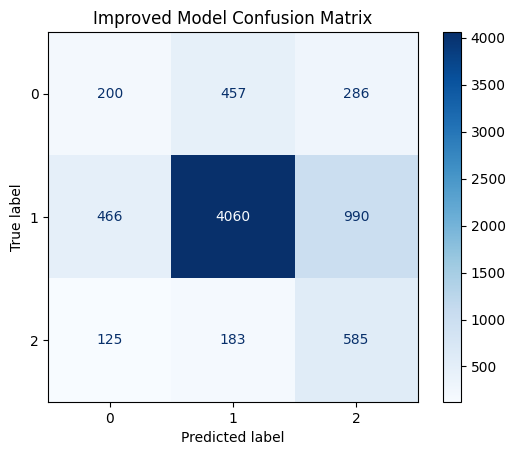

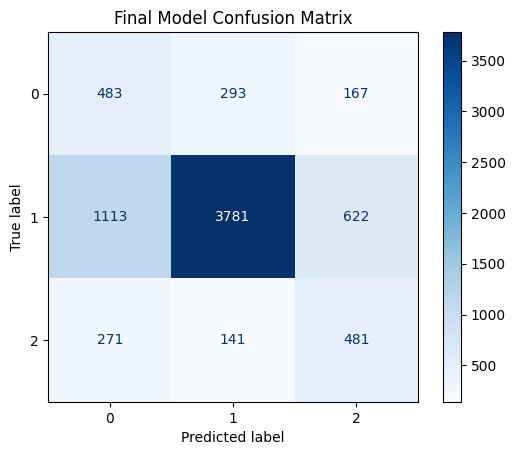

In [ ]:
def evaluate_final_model_gripper(true_grp_labels, improved_grp_preds, final_grp_preds, visualize=True):

    # Convert logits to class predictions
    true_labels = np.argmax(true_grp_labels, axis=1)
    improved_predicted_labels = np.argmax(improved_grp_preds, axis=1)
    final_predicted_labels = np.argmax(final_grp_preds, axis=1)

    # Compute the confusion matrices
    improved_conf_matrix = confusion_matrix(true_labels, improved_predicted_labels, labels=[0, 1, 2])
    final_conf_matrix = confusion_matrix(true_labels, final_predicted_labels, labels=[0, 1, 2])

    # Compute Precision, Recall, and F1 Score for Improved Model
    improved_precision = precision_score(true_labels, improved_predicted_labels, average="weighted", zero_division=0)
    improved_recall = recall_score(true_labels, improved_predicted_labels, average="weighted", zero_division=0)
    improved_f1 = f1_score(true_labels, improved_predicted_labels, average="weighted", zero_division=0)

    # Compute Precision, Recall, and F1 Score for Final Model
    final_precision = precision_score(true_labels, final_predicted_labels, average="weighted", zero_division=0)
    final_recall = recall_score(true_labels, final_predicted_labels, average="weighted", zero_division=0)
    final_f1 = f1_score(true_labels, final_predicted_labels, average="weighted", zero_division=0)

    # Print Evaluation Metrics
    print("Improved Model:")
    print(f"  Precision: {improved_precision:.4f}")
    print(f"  Recall: {improved_recall:.4f}")
    print(f"  F1 Score: {improved_f1:.4f}")
    print("\nFinal Model:")
    print(f"  Precision: {final_precision:.4f}")
    print(f"  Recall: {final_recall:.4f}")
    print(f"  F1 Score: {final_f1:.4f}")

    # Visualize confusion matrices (optional)
    if visualize:
        disp_improved = ConfusionMatrixDisplay(confusion_matrix=improved_conf_matrix, display_labels=[0, 1, 2])
        disp_improved.plot(cmap=plt.cm.Blues)
        plt.title("Improved Model Confusion Matrix")
        plt.show()

        disp_final = ConfusionMatrixDisplay(confusion_matrix=final_conf_matrix, display_labels=[0, 1, 2])
        disp_final.plot(cmap=plt.cm.Blues)
        plt.title("Final Model Confusion Matrix")
        plt.show()

evaluate_final_model_gripper(test_grp_labels, improved_grp_predictions, final_grp_predictions)

#### Conclusion

In the final section, I added in a pre-trained VAE to the improved model to encode the front camera images. The means of the latent representation of each image were used as the inputs for the front camera variable in the supervised prediction task.

First, I will discuss the training and validation curves for the improved vs final model. As seen in the WANDB screenshot below, the final model with the VAE included saw improvements in performance with a decreased epoch validation loss compared to the original improved model for the first 7 epochs. After the 7 epochs, there is a spike in the epoch validation loss which may indicate overfitting. This is likely because the new model needs to be tuned and adjusted to incorporate the new method of encoding the images.

Now, I will evaluate the improved vs final model using the test set under the evaluation metrics I defined in part 1. According to these metrics, the final model with the VAE-encoded images had a drop in performance compared to the improved model. Across all three dimensions, there was a drop in R2 (0.77 to 0.65, 0.77 to 0.63, and 0.88 to 0.78 respectively). There were also slight increases in RMSE and MAE across all three dimensions for the improved model vs the final model. Therefore, using these metrics, we would conclude the VAE caused a slight drop in performance in the prediction of the cartesian coordinate portion of the action variable. The difference between these results and the validation results are likely attributed to a combination of the following factors: the difference in evaluation metrics, differences between the validation and test sets, and potential overfitting on the training dataset.

In regards to the gripper position prediction, there was a slight increase in performance caused by the VAE encoded images, although the evidence is mixed. The precision score increased from 0.7187 to 0.7522 and the F1 score increased from 0.6775 to 0.6812 (although the recall score had a slight decrease from 0.6590 to 0.6454). Below are the final class accuracies from the confusion matrix (calculated by hand using the confusion matrix above):

Class 0 (Improved): 21.2%

Class 0 (Final): 51%

Class 1 (Improved): 73.6%

Class 1 (Final): 68.5%

Class 2 (Improved): 65.5%

Class 2 (Final): 53.4%

This indicates that the final model greatly improved classification accuracy for class 0, but decreased classification accuracy for class 1 and class 2. Therefore, there is mixed evidence on whether or not the VAE improved the gripper position predictions.

In regards to model complexity and speed of convergence, the addition of the VAE greatly increased the complexity of the model and lowered the speed of convergence. The final model parameter count would be the parameters of the supervised model plus the parameters of the VAE. Additionally, the time of the training increased by about 150% with the addition of the VAE.

It is also important to note this direct comparison between the improved model and the final model (improved architecture+vae) may not represent the full potential of the VAE. Inserting the VAE into the exact same architecture of the improved model may not be a valid method of comparison because the new method of encoding will likely require adjustments to the original model to achieve optimal performance. As discussed above, additional hyperparameter tuning is needed to address overfitting once the VAE is added into the original improved model's architecture.

Even without additional tuning, however, the model is able to achieve lower validation loss up to epoch 7 with the VAE-encoded front camera images and achieve an improved F1 score on gripper classification. This disproves my earlier hypothesis that the VAE would not be useful for the downstream task. The fact that the supervised model can use the latent representation of the images and still perform well, knowing also that my VAE appeared to be performing poorly and removing important features of the images, is a testament to the power of VAEs. With additional tuning of the VAE and corresponding hypertuning of the final model, there would likely be an even bigger jump in performance. Therefore, despite the additional cost in complexity and convergence time, I would conclude the VAE, with additional testing and tuning, would be very beneficial for the downstream prediction task.


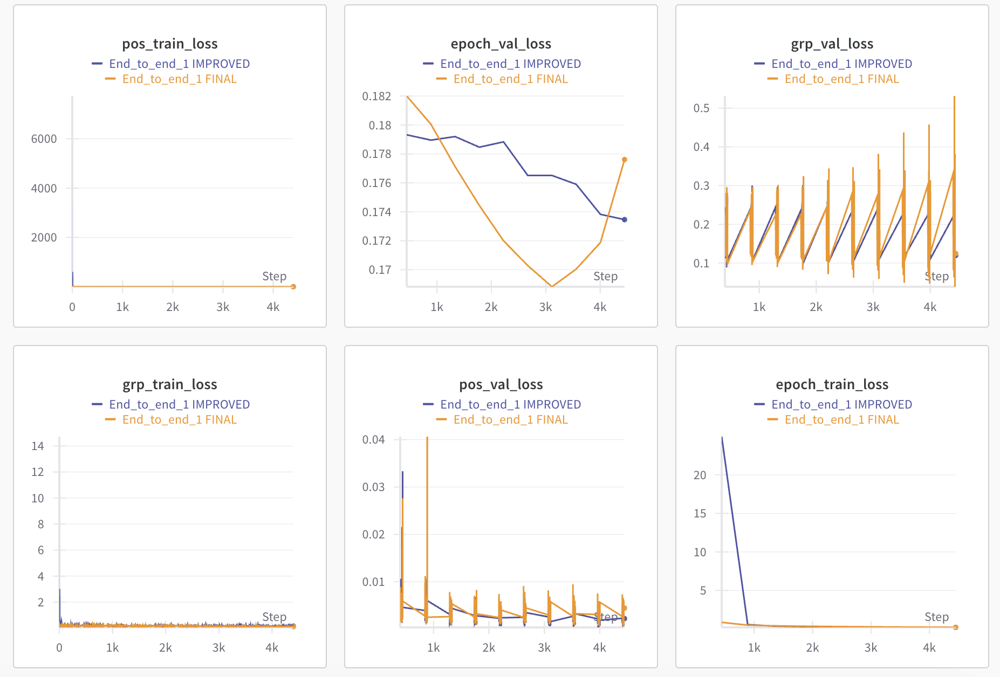

In [ ]:
# Final vs Improved Run (WANDB)
image_path = '/content/drive/MyDrive/comp0188_2425/cw2/wandb/final_comparison.png'
display(Image(filename=image_path, width=1600))

# Appendix

In [ ]:
# Experiment 1

"""

cnn2_config = ConvolutionLayersConfig(
    input_dim=224,
    input_channels=2,
    layers=[
        nn.Conv2d(
            in_channels=2,
            out_channels=8,
            kernel_size=(3,3),
            stride=1,
            padding=1,
            dilation=1
          ),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=(2,2)),
        nn.Conv2d(
            in_channels=8,
            out_channels=16,
            kernel_size=(3,3),
            stride=1,
            padding=1
          ),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=(2,2)),
        nn.Conv2d(
            in_channels=16,
            out_channels=32,
            kernel_size=(3,3),
            stride=1,
            padding=1
          ),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=(2,2))
        ]
    )

_cnn_output_dim = cnn2_config.get_output_dims()
_cnn_output_channels = cnn2_config.get_output_channels()
_mlp_input_dim = int(
            (_cnn_output_dim[-1]*_cnn_output_dim[-1])*_cnn_output_channels[-1]
            )


image_encoder = JointCNNEncoder(
    cnn=CNN(cnn2_config),
    dense=MLP(
        input_dim=_mlp_input_dim,
        hidden_dims=[256],
        output_dim=128,
        dropouts=[0.3]
        )
)

obs_encoder = MLP(
    input_dim = 15,
    hidden_dims = [256,256],
    output_dim = 128,
    dropouts = [0.3,0.3]
)

dense = MLP(
    input_dim = 128,
    hidden_dims = [64,32],
    output_dim = 6,
    dropouts = [0.3,0.3]
)

class Baseline1(BaseModel):

  def __init__(
      self,
      image_encoder:JointCNNEncoder,
      obs_encoder:MLP,
      dense:MLP
      ) -> None:
      super().__init__()
      self.image_encoder = image_encoder
      self.obs_encoder = obs_encoder
      self.dense = dense

  def forward(self, images, obs):
    _img_enc = self.image_encoder(images)
    _obs_enc = self.obs_encoder(obs)
    _dense_enc = self.dense(_img_enc+_obs_enc)
    pos = _dense_enc[:,0:3]
    grp = _dense_enc[:,3:]
    return {
        "pos": pos,
        "grp":grp
        }
  def reset(
      self,
      image_encoder_kwargs,
      obs_encoder_kwargs,
      dense_kwargs
      ):
    self.image_encoder.reset(**image_encoder_kwargs)
    self.obs_encoder.reset(**obs_encoder_kwargs)
    self.dense.reset(**dense_kwargs)

torch.manual_seed(5)
model = Baseline1(
    image_encoder=image_encoder,
    obs_encoder=obs_encoder,
    dense=dense
)

torch.manual_seed(5)
model.reset({},{},{})
exp_kwargs = {
    "batch_size": 64,
    "learning_rate": 0.0001,
    "half_precision": True,
    "target_offset": 0
}

exp_kwargs["model_def"] = model.__repr__()

first_batch = next(train_dataloader.__iter__())

if exp_kwargs["half_precision"]:
    model = model.half()
optimizer = torch.optim.Adam(
    model.parameters(), lr=exp_kwargs["learning_rate"],
    eps=1e-04
    )

__criterion = TrackerBalancedLoss(
    loss_lkp={
        "pos":pos_criterion,
        "grp": grp_criterion
    }
    )

if exp_kwargs["half_precision"]:
    with torch.no_grad():
        if torch.cuda.is_available():
            model = model.cuda()
            with torch.autocast(device_type="cuda"):
                res = model(
                    images=first_batch.input["images"].cuda(),
                    obs=first_batch.input["obs"].cuda()
                    )
                first_batch.output["pos"] = first_batch.output["pos"].cuda()
                first_batch.output["grp"] = first_batch.output["grp"].cuda()
        else:
            with torch.autocast(device_type="cuda"):
                res = model(
                    images=first_batch.input["images"],
                    obs=first_batch.input["obs"]
                    )
else:
    with torch.no_grad():
        if torch.cuda.is_available():
            model = model.cuda()
            res = model(
                images=first_batch.input["images"].cuda(),
                obs=first_batch.input["obs"].cuda()
                )
            first_batch.output["pos"] = first_batch.output["pos"].cuda()
            first_batch.output["grp"] = first_batch.output["grp"].cuda()
        else:
            res = model(
                images=first_batch.input["images"],
                obs=first_batch.input["obs"]
                )

mo = WandBMetricOrchestrator()

train_criterion = TrackerBalancedLoss(
    loss_lkp={
        "pos":copy.deepcopy(pos_criterion),
        "grp":copy.deepcopy(grp_criterion)
    },
    name="train",
    mo=mo
    )

val_criterion = TrackerBalancedLoss(
    loss_lkp={
        "pos":copy.deepcopy(pos_criterion),
        "grp":copy.deepcopy(grp_criterion)
    },
    name="val",
    mo=mo
    )

sl_trainer = TorchTrainingLoop(
    model=model, gpu=True, optimizer=optimizer, criterion=train_criterion,
    val_criterion=val_criterion, epochs=10, logger=logger,
    mo=WandBMetricOrchestrator(), half_precision=exp_kwargs["half_precision"],
    preds_save_type="csv",output_dir='/content/drive/MyDrive/comp0188_2425/cw2/predictions/exp1'
)

wandb_name = "End_to_end_1"
wandb_grp="End_to_end"

if project_options.debug:
    wandb_name = f"{wandb_name}_DEBUG"

orig = datetime.datetime.now()
sl_trainer.training_loop(
    train_loader=train_dataloader,
    val_loader=val_dataloader,
    wandb_proj=WANDB_PROJECT,
    wandb_grp=wandb_grp,
    wandb_config=exp_kwargs,
    wandb_name=wandb_name,
    reset_kwargs={
        "image_encoder_kwargs": {},
        "obs_encoder_kwargs": {},
        "dense_kwargs": {}
    }
    )
post_train = datetime.datetime.now()

"""

In [ ]:
# Experiment 2

"""
# Calculate weights for each class

# Calculate the total number of samples
total_samples = train_grp_labels.shape[0]

# Calculate the count of each class
class_counts = torch.sum(train_grp_labels, dim=0).tolist()

# Calculate the percentage of each class
class_percentages = [(count / total_samples) * 100 for count in class_counts]

# Print the percentages
print("Class Percentages:")
for i, percentage in enumerate(class_percentages):
    print(f"Class {i+1}: {percentage:.2f}%")

# Calculate weights
class_weights = [1.0 / percentage for percentage in class_percentages]
total_weight = sum(class_weights)
class_weights = [weight / total_weight for weight in class_weights]

print("Class Weights for Loss:")
for i, weight in enumerate(class_weights):
    print(f"Class {i+1}: {weight:.4f}")

# Redefine cross entropy loss to give weights to minority classes
class_weights = torch.tensor(class_weights,device=torch.device('cuda'))
pos_criterion = nn.MSELoss(reduction="mean")
grp_criterion = nn.CrossEntropyLoss(reduction="mean",weight=class_weights) # Add in pre-calculated weights

cnn2_config = ConvolutionLayersConfig(
    input_dim=224,
    input_channels=2,
    layers=[
        nn.Conv2d(
            in_channels=2,
            out_channels=8,
            kernel_size=(3,3),
            stride=1,
            padding=1,
            dilation=1
          ),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=(2,2)),
        nn.Conv2d(
            in_channels=8,
            out_channels=16,
            kernel_size=(3,3),
            stride=1,
            padding=1
          ),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=(2,2)),
        nn.Conv2d(
            in_channels=16,
            out_channels=32,
            kernel_size=(3,3),
            stride=1,
            padding=1
          ),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=(2,2))
        ]
    )

_cnn_output_dim = cnn2_config.get_output_dims()
_cnn_output_channels = cnn2_config.get_output_channels()
_mlp_input_dim = int(
            (_cnn_output_dim[-1]*_cnn_output_dim[-1])*_cnn_output_channels[-1]
            )


image_encoder = JointCNNEncoder(
    cnn=CNN(cnn2_config),
    dense=MLP(
        input_dim=_mlp_input_dim,
        hidden_dims=[256],
        output_dim=128
        )
)

obs_encoder = MLP(
    input_dim = 15,
    hidden_dims = [256,256],
    output_dim = 128
)

dense = MLP(
    input_dim = 128,
    hidden_dims = [64,32],
    output_dim = 6
)

class Baseline1(BaseModel):

  def __init__(
      self,
      image_encoder:JointCNNEncoder,
      obs_encoder:MLP,
      dense:MLP
      ) -> None:
      super().__init__()
      self.image_encoder = image_encoder
      self.obs_encoder = obs_encoder
      self.dense = dense

  def forward(self, images, obs):
    _img_enc = self.image_encoder(images)
    _obs_enc = self.obs_encoder(obs)
    _dense_enc = self.dense(_img_enc+_obs_enc)
    pos = _dense_enc[:,0:3]
    grp = _dense_enc[:,3:]
    return {
        "pos": pos,
        "grp":grp
        }
  def reset(
      self,
      image_encoder_kwargs,
      obs_encoder_kwargs,
      dense_kwargs
      ):
    self.image_encoder.reset(**image_encoder_kwargs)
    self.obs_encoder.reset(**obs_encoder_kwargs)
    self.dense.reset(**dense_kwargs)

torch.manual_seed(5)
model = Baseline1(
    image_encoder=image_encoder,
    obs_encoder=obs_encoder,
    dense=dense
)

torch.manual_seed(5)
model.reset({},{},{})
exp_kwargs = {
    "batch_size": 64,
    "learning_rate": 0.0001,
    "half_precision": True,
    "target_offset": 0
}

exp_kwargs["model_def"] = model.__repr__()

if exp_kwargs["half_precision"]:
    model = model.half()
optimizer = torch.optim.Adam(
    model.parameters(), lr=exp_kwargs["learning_rate"],
    eps=1e-04
    )

__criterion = TrackerBalancedLoss(
    loss_lkp={
        "pos":pos_criterion,
        "grp": grp_criterion
    }
    )

if exp_kwargs["half_precision"]:
    with torch.no_grad():
        if torch.cuda.is_available():
            model = model.cuda()
            with torch.autocast(device_type="cuda"):
                res = model(
                    images=first_batch.input["images"].cuda(),
                    obs=first_batch.input["obs"].cuda()
                    )
                first_batch.output["pos"] = first_batch.output["pos"].cuda()
                first_batch.output["grp"] = first_batch.output["grp"].cuda()
        else:
            with torch.autocast(device_type="cuda"):
                res = model(
                    images=first_batch.input["images"],
                    obs=first_batch.input["obs"]
                    )
else:
    with torch.no_grad():
        if torch.cuda.is_available():
            model = model.cuda()
            res = model(
                images=first_batch.input["images"].cuda(),
                obs=first_batch.input["obs"].cuda()
                )
            first_batch.output["pos"] = first_batch.output["pos"].cuda()
            first_batch.output["grp"] = first_batch.output["grp"].cuda()
        else:
            res = model(
                images=first_batch.input["images"],
                obs=first_batch.input["obs"]
                )

mo = WandBMetricOrchestrator()

train_criterion = TrackerBalancedLoss(
    loss_lkp={
        "pos":copy.deepcopy(pos_criterion),
        "grp":copy.deepcopy(grp_criterion)
    },
    name="train",
    mo=mo
    )

val_criterion = TrackerBalancedLoss(
    loss_lkp={
        "pos":copy.deepcopy(pos_criterion),
        "grp":copy.deepcopy(grp_criterion)
    },
    name="val",
    mo=mo
    )

sl_trainer = TorchTrainingLoop(
    model=model, gpu=True, optimizer=optimizer, criterion=train_criterion,
    val_criterion=val_criterion, epochs=10, logger=logger,
    mo=WandBMetricOrchestrator(), half_precision=exp_kwargs["half_precision"],
    preds_save_type="csv",output_dir='/content/drive/MyDrive/comp0188_2425/cw2/predictions/exp2'
)

wandb_name = "End_to_end_1"
wandb_grp="End_to_end"

if project_options.debug:
    wandb_name = f"{wandb_name}_DEBUG"

orig = datetime.datetime.now()
sl_trainer.training_loop(
    train_loader=train_dataloader,
    val_loader=val_dataloader,
    wandb_proj=WANDB_PROJECT,
    wandb_grp=wandb_grp,
    wandb_config=exp_kwargs,
    wandb_name=wandb_name,
    reset_kwargs={
        "image_encoder_kwargs": {},
        "obs_encoder_kwargs": {},
        "dense_kwargs": {}
    }
    )
post_train = datetime.datetime.now()

"""

In [ ]:
# Experiment 3

"""

cnn2_config = ConvolutionLayersConfig(
    input_dim=224,
    input_channels=2,
    layers=[
        nn.Conv2d(
            in_channels=2,
            out_channels=16,
            kernel_size=(3,3),
            stride=1,
            padding=1,
            dilation=1
          ),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=(2,2)),
        nn.Conv2d(
            in_channels=16,
            out_channels=32,
            kernel_size=(3,3),
            stride=1,
            padding=1
          ),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=(2,2)),
        nn.Conv2d(
            in_channels=32,
            out_channels=64,
            kernel_size=(3,3),
            stride=1,
            padding=1
          ),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=(2,2)),
        nn.Conv2d(in_channels=64, out_channels=128, kernel_size=(3,3), stride=1, padding=1), # Adding a new convolutional layer
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=(2,2))
       ]
   )

_cnn_output_dim = cnn2_config.get_output_dims()
_cnn_output_channels = cnn2_config.get_output_channels()
_mlp_input_dim = int(
            (_cnn_output_dim[-1]*_cnn_output_dim[-1])*_cnn_output_channels[-1]
            )


image_encoder = JointCNNEncoder(
    cnn=CNN(cnn2_config),
    dense=MLP(
        input_dim=_mlp_input_dim,
        hidden_dims=[512,256],
        output_dim=128
        )
)

obs_encoder = MLP(
    input_dim = 15,
    hidden_dims = [512,256],
    output_dim = 128
)

dense = MLP(
    input_dim = 128,
    hidden_dims = [128, 64, 32],
    output_dim = 6
)

class Baseline1(BaseModel):

  def __init__(
      self,
      image_encoder:JointCNNEncoder,
      obs_encoder:MLP,
      dense:MLP
      ) -> None:
      super().__init__()
      self.image_encoder = image_encoder
      self.obs_encoder = obs_encoder
      self.dense = dense

  def forward(self, images, obs):
    _img_enc = self.image_encoder(images)
    _obs_enc = self.obs_encoder(obs)
    _dense_enc = self.dense(_img_enc+_obs_enc)
    pos = _dense_enc[:,0:3]
    grp = _dense_enc[:,3:]
    return {
        "pos": pos,
        "grp":grp
        }
  def reset(
      self,
      image_encoder_kwargs,
      obs_encoder_kwargs,
      dense_kwargs
      ):
    self.image_encoder.reset(**image_encoder_kwargs)
    self.obs_encoder.reset(**obs_encoder_kwargs)
    self.dense.reset(**dense_kwargs)

torch.manual_seed(5)
model = Baseline1(
    image_encoder=image_encoder,
    obs_encoder=obs_encoder,
    dense=dense
)

torch.manual_seed(5)
model.reset({},{},{})
exp_kwargs = {
    "batch_size": 64,
    "learning_rate": 0.0001,
    "half_precision": True,
    "target_offset": 0
}

exp_kwargs["model_def"] = model.__repr__()

first_batch = next(train_dataloader.__iter__())

if exp_kwargs["half_precision"]:
    model = model.half()
optimizer = torch.optim.Adam(
    model.parameters(), lr=exp_kwargs["learning_rate"],
    eps=1e-04
    )

__criterion = TrackerBalancedLoss(
    loss_lkp={
        "pos":pos_criterion,
        "grp": grp_criterion
    }
    )

if exp_kwargs["half_precision"]:
    with torch.no_grad():
        if torch.cuda.is_available():
            model = model.cuda()
            with torch.autocast(device_type="cuda"):
                res = model(
                    images=first_batch.input["images"].cuda(),
                    obs=first_batch.input["obs"].cuda()
                    )
                first_batch.output["pos"] = first_batch.output["pos"].cuda()
                first_batch.output["grp"] = first_batch.output["grp"].cuda()
        else:
            with torch.autocast(device_type="cuda"):
                res = model(
                    images=first_batch.input["images"],
                    obs=first_batch.input["obs"]
                    )
else:
    with torch.no_grad():
        if torch.cuda.is_available():
            model = model.cuda()
            res = model(
                images=first_batch.input["images"].cuda(),
                obs=first_batch.input["obs"].cuda()
                )
            first_batch.output["pos"] = first_batch.output["pos"].cuda()
            first_batch.output["grp"] = first_batch.output["grp"].cuda()
        else:
            res = model(
                images=first_batch.input["images"],
                obs=first_batch.input["obs"]
                )

mo = WandBMetricOrchestrator()

train_criterion = TrackerBalancedLoss(
    loss_lkp={
        "pos":copy.deepcopy(pos_criterion),
        "grp":copy.deepcopy(grp_criterion)
    },
    name="train",
    mo=mo
    )

val_criterion = TrackerBalancedLoss(
    loss_lkp={
        "pos":copy.deepcopy(pos_criterion),
        "grp":copy.deepcopy(grp_criterion)
    },
    name="val",
    mo=mo
    )

sl_trainer = TorchTrainingLoop(
    model=model, gpu=True, optimizer=optimizer, criterion=train_criterion,
    val_criterion=val_criterion, epochs=10, logger=logger,
    mo=WandBMetricOrchestrator(), half_precision=exp_kwargs["half_precision"],
    preds_save_type="csv",output_dir='/content/drive/MyDrive/comp0188_2425/cw2/predictions/exp3'
)

wandb_name = "End_to_end_1"
wandb_grp="End_to_end"

if project_options.debug:
    wandb_name = f"{wandb_name}_DEBUG"

orig = datetime.datetime.now()
sl_trainer.training_loop(
    train_loader=train_dataloader,
    val_loader=val_dataloader,
    wandb_proj=WANDB_PROJECT,
    wandb_grp=wandb_grp,
    wandb_config=exp_kwargs,
    wandb_name=wandb_name,
    reset_kwargs={
        "image_encoder_kwargs": {},
        "obs_encoder_kwargs": {},
        "dense_kwargs": {}
    }
    )
post_train = datetime.datetime.now()

"""